In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import math
from statsmodels.tsa.seasonal import seasonal_decompose

In [35]:
import warnings

warnings.filterwarnings("ignore")

In [36]:
combined_df = pd.read_csv("datasets/combined_df_with_2025_.csv")

In [37]:
combined_df

,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,0.096000,2014,4
1,25+,Total,Norway,0.028000,2014,10
2,25+,Male,Iceland,0.052000,2021,1
3,25+,Male,Iceland,0.049000,2021,2
4,25+,Male,Iceland,0.048000,2021,3
...,...,...,...,...,...,...
33650,25+,Total,United States of America,0.029308,2025,8
33651,25+,Total,United States of America,0.029101,2025,9
33652,25+,Total,United States of America,0.028894,2025,10
33653,25+,Total,United States of America,0.028688,2025,11


In [38]:
filtered_data = combined_df[
    (combined_df['Country'] == "Latvia") &
    (combined_df['Age'] == "15-24") &
    (combined_df['Sex'] == "Male")
]

In [39]:
filtered_data

,Age,Sex,Country,Unemployment Rate (%),Year,Month
460,15-24,Male,Latvia,0.173000,2021,9
461,15-24,Male,Latvia,0.142000,2021,10
462,15-24,Male,Latvia,0.119000,2021,11
463,15-24,Male,Latvia,0.107000,2021,12
464,15-24,Male,Latvia,0.184000,2020,6
...,...,...,...,...,...,...
32390,15-24,Male,Latvia,0.150803,2025,8
32391,15-24,Male,Latvia,0.150177,2025,9
32392,15-24,Male,Latvia,0.149714,2025,10
32393,15-24,Male,Latvia,0.149600,2025,11


## Common part

In [40]:
def prepare_data(combined_df, country, age, sex):
    # Filter the data based on provided country, age, and sex
    data_filtered = combined_df[
        (combined_df['Country'] == country) &
        (combined_df['Age'] == age) &
        (combined_df['Sex'] == sex)
    ].copy()

    # Prepare the Date column
    data_filtered['Date'] = pd.to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')

    # Drop unnecessary columns and set the index
    data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
    data_filtered.set_index('Date', inplace=True)
    data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
    data_filtered = data_filtered.sort_values(by='Date')

    return data_filtered

forecast_results_df = pd.DataFrame(columns=['Model', 'Country', 'Age', 'Sex', 'Date', 'Forecast', 'MSE', 'RMSE', 'MAPE'])

def save_forecast_results(model_name, country, age, sex, predictions, mse, rmse, mape):
    global forecast_results_df

    # Створюємо DataFrame для збереження результатів прогнозу
    results = pd.DataFrame({
        'Model': model_name,
        'Country': country,
        'Age': age,
        'Sex': sex,
        'Date': predictions.index,
        'Forecast': predictions.values,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE': mape
    })

    if not results.empty and not results.isna().all().all():
        forecast_results_df = pd.concat([forecast_results_df, results], ignore_index=True)
    else:
        print("Skipping empty or all-NA DataFrame in concatenation.")


# Вносимо зміни в `model_arima` і `model_sarima`, щоб викликати `save_forecast_results`
def model_arima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best ARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=3, max_q=3, m=12,
                              start_P=0, seasonal=False,
                              d=2, D=2, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best ARIMA parameters
    order = stepwise_fit.order

    # Fit the ARIMA model with the selected order
    arima_model = ARIMA(data_filtered['Value'], order=order)
    results_arima = arima_model.fit()

    # Predict using ARIMA
    arima_predictions = results_arima.predict(start='2022-01-01', end='2025-12-01').rename('ARIMA Predictions')

    # Plot ARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(arima_predictions, label='ARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with ARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    actual = data_filtered['Value']['2022-01-01':'2024-06-01']
    arima_predictions_trimmed = arima_predictions.loc['2022-01-01':'2024-06-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    arima_predictions_trimmed = arima_predictions_trimmed.loc[actual.index]

    mse_arima = mean_squared_error(actual, arima_predictions_trimmed)
    rmse_arima = math.sqrt(mse_arima)
    mape_arima = mean_absolute_percentage_error(actual, arima_predictions_trimmed)
    print(f'ARIMA - MSE: {mse_arima}, RMSE: {rmse_arima}, MAPE: {mape_arima:.2%}')
    save_forecast_results(
        model_name='ARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=arima_predictions,
        mse=mse_arima,
        rmse=rmse_arima,
        mape=mape_arima
    )

def model_sarima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best SARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=5, max_q=5, m=12,
                              start_P=0, seasonal=True,
                              d=1, D=1, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best SARIMA parameters
    order = stepwise_fit.order
    seasonal_order = stepwise_fit.seasonal_order

    # Fit the SARIMA model with the selected order
    sarima_model = SARIMAX(data_filtered['Value'], order=order, seasonal_order=seasonal_order)
    results_sarima = sarima_model.fit()

    sarima_predictions = results_sarima.predict(start='2022-01-01', end='2026-12-01').rename('SARIMA Predictions')


    # Plot SARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(sarima_predictions, label='SARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with SARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    actual = data_filtered['Value']['2022-01-01':'2025-12-01']
    sarima_predictions_trimmed = sarima_predictions.loc['2022-01-01':'2025-12-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    sarima_predictions_trimmed = sarima_predictions_trimmed.loc[actual.index]

    mse_sarima = mean_squared_error(actual, sarima_predictions_trimmed)
    rmse_sarima = math.sqrt(mse_sarima)
    mape_sarima = mean_absolute_percentage_error(actual, sarima_predictions_trimmed)
    print(f'SARIMA - MSE: {mse_sarima}, RMSE: {rmse_sarima}, MAPE: {mape_sarima:.2%}')
    save_forecast_results(
        model_name='SARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=sarima_predictions,
        mse=mse_sarima,
        rmse=rmse_sarima,
        mape=mape_sarima
    )

In [41]:
def calculate_seasonal_strength(data, column='Value', period=12, threshold=0.7):
    decomposition = seasonal_decompose(data[column], model='additive', period=period)
    seasonal_component = decomposition.seasonal
    residual_component = decomposition.resid

    # Calculate seasonal strength
    original_variance = np.var(data[column].dropna())
    residual_variance = np.var(residual_component.dropna())
    seasonal_strength = 1 - (residual_variance / original_variance)

    # Determine seasonality strength
    seasonality_detected = seasonal_strength > threshold

    print(f"Seasonal Strength: {seasonal_strength:.4f}")
    if seasonality_detected:
        print("Strong seasonality detected.")
    else:
        print("Weak or no seasonality detected.")

    return seasonal_strength, seasonality_detected

## ITALY

### 15-24, Male

In [42]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Male')

In [43]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9927
Strong seasonality detected.


(0.9927031779330502, True)

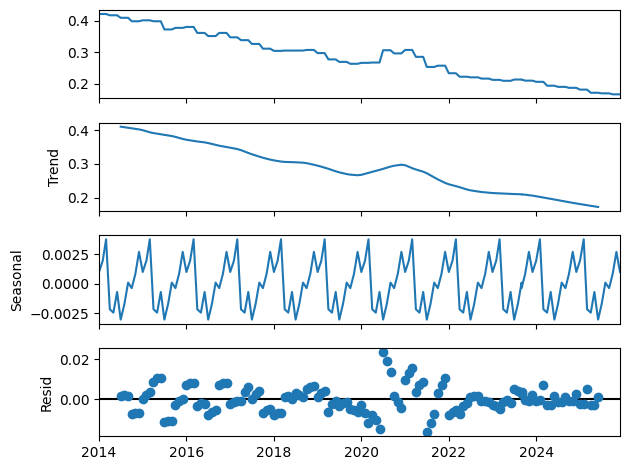

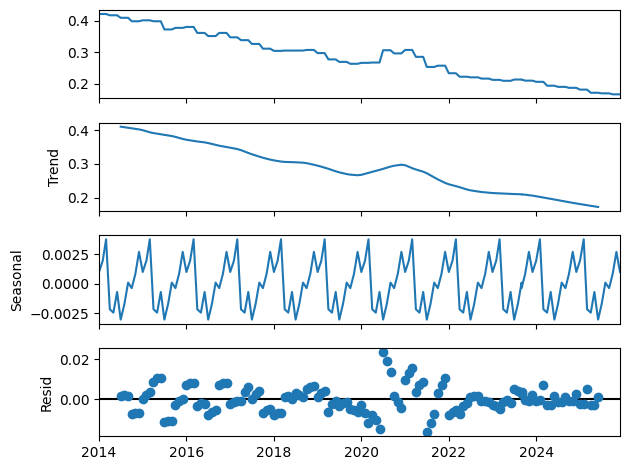

In [44]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Trend (Тренд): Верхня частина графіка показує наявність спадного тренду з деякими коливаннями, що свідчить про поступове зниження рівня показника з часом.

Seasonal (Сезонність): Сезонна компонента демонструє регулярні коливання на певних інтервалах, що вказує на циклічні зміни в даних. Цей компонент свідчить про сезонний характер часового ряду.

Resid (Залишок): Компонента залишків показує відхилення, які не пояснюються трендом або сезонністю.

Зважаючи на наявність чіткої сезонності, використання SARIMA (Seasonal ARIMA) буде більш підходящим для вашої задачі, ніж класична ARIMA. Модель SARIMA дозволяє враховувати як трендові, так і сезонні коливання в даних, що забезпечить точніший прогноз для вашого часового ряду з регулярною сезонністю.

In [45]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]

In [46]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)


2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=54.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-815.658, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-875.919, Time=36.71 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=30.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-813.658, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-905.078, Time=10.33 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-912.037, Time=25.13 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-921.411, Time=47.37 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=8.22 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=22.42 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-923.247, Time=11.13 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-925.588, Time=7.04 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=4.59 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=7.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AI

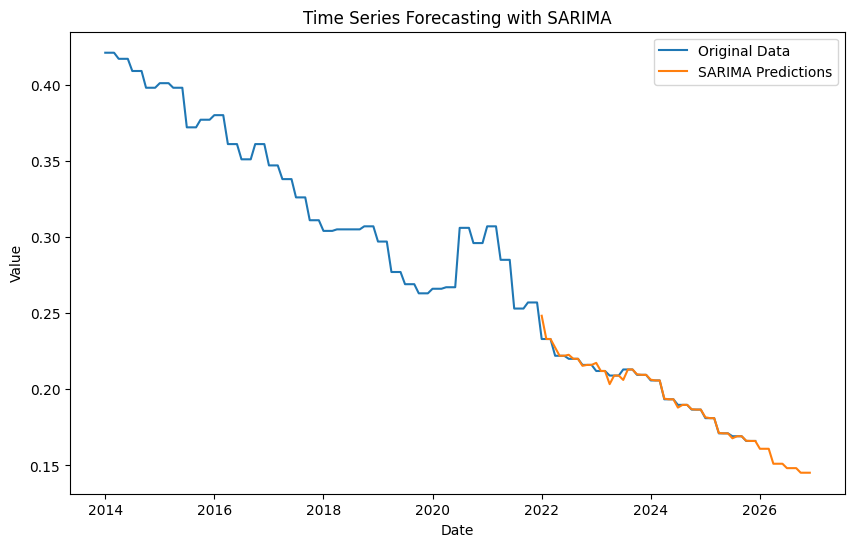

SARIMA - MSE: 7.9759147725931e-06, RMSE: 0.002824166208386663, MAPE: 0.46%


In [47]:
model_sarima(data_filtered, 'Italy', '15-24', 'Male')

### 15-24, Female

In [48]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Female')

In [49]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9855
Strong seasonality detected.


(0.9854673657989438, True)

In [50]:
data_filtered

,Value
Date,
2014-01-01,0.446000
2014-02-01,0.446000
2014-03-01,0.446000
2014-04-01,0.441000
2014-05-01,0.441000
...,...
2025-08-01,0.211366
2025-09-01,0.211366
2025-10-01,0.204605


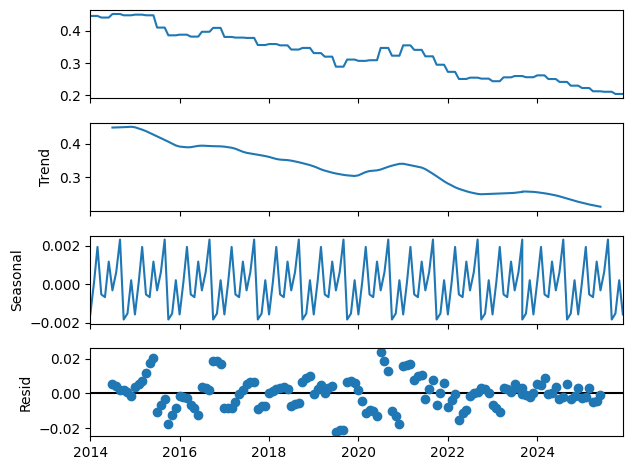

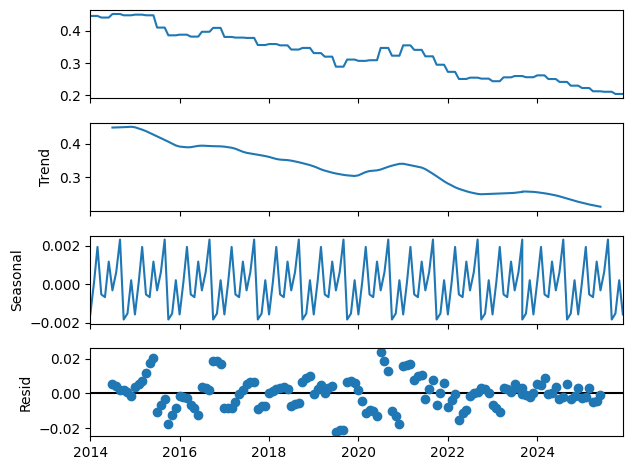

In [51]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Тренд: У часовому ряді є чіткий спадний тренд, що свідчить про загальне зниження показника з часом.

Сезонність: Сезонна компонента демонструє регулярні коливання, що вказує на наявність повторюваних сезонних циклів у даних.

Залишок: Компонента залишків показує невеликі відхилення від тренду і сезонності, але вони не виглядають суттєвими.

Зважаючи на наявність як тренду, так і сезонності, SARIMA (Seasonal ARIMA) буде оптимальним вибором для цього часового ряду. Модель SARIMA дозволяє враховувати і трендові, і сезонні коливання, що зробить прогноз точнішим у порівнянні з класичною ARIMA, яка не враховує сезонність.

In [52]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)


2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=10.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-720.455, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-774.706, Time=1.76 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=3.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-718.455, Time=0.14 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-823.985, Time=2.23 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-857.416, Time=8.82 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.92 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.74 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-859.470, Time=2.74 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-826.005, Time=0.87 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-776.706, 

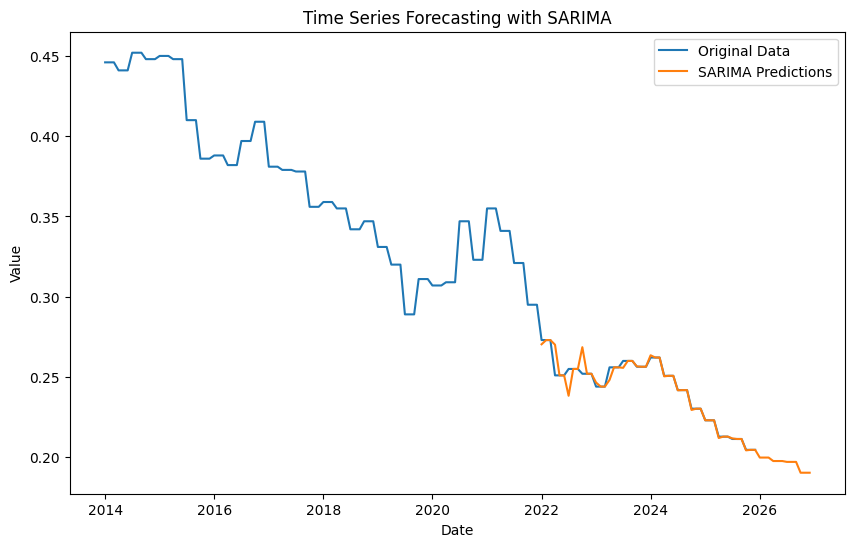

SARIMA - MSE: 2.116132733967958e-05, RMSE: 0.004600144273789636, MAPE: 0.61%


In [53]:
model_sarima(data_filtered, 'Italy', '15-24', 'Female')

### 15-24, Total

In [54]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Total')

In [55]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9836
Strong seasonality detected.


(0.9836487556108018, True)

In [56]:
data_filtered

,Value
Date,
2014-01-01,0.432000
2014-02-01,0.429000
2014-03-01,0.433000
2014-04-01,0.432000
2014-05-01,0.427000
...,...
2025-08-01,0.174302
2025-09-01,0.176917
2025-10-01,0.172977


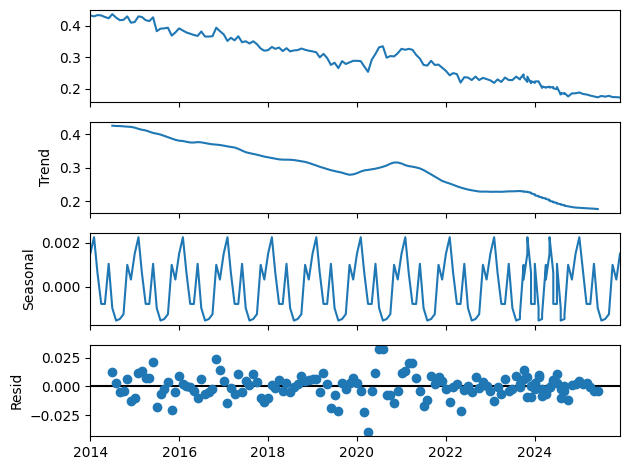

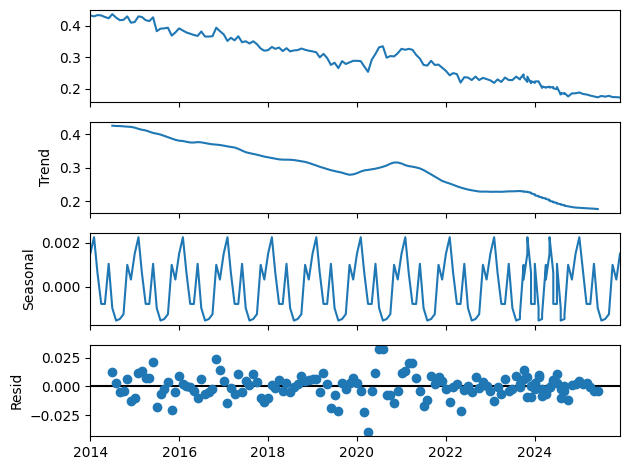

In [57]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Сезонність: Видно регулярні циклічні зміни, що означає наявність сезонної компоненти.
Тренд: Спостерігається загальна тенденція зниження, яка також може бути змодельована в SARIMA.
Випадкові залишки: Резідуальні коливання виглядають близькими до нуля, що може вказувати на те, що основні патерни враховані, але залишкові випадкові коливання все одно потребують сезонної корекції для підвищення точності.

In [58]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)


2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=3.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-642.815, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-712.092, Time=6.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-647.089, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-748.025, Time=0.31 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-746.227, Time=1.05 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-748.772, Time=1.73 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-710.292, Time=0.64 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.98 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-752.821, Time=1.17 sec
 ARIMA(3,1,0)(1,1,0)[12]             : AIC=-710.8

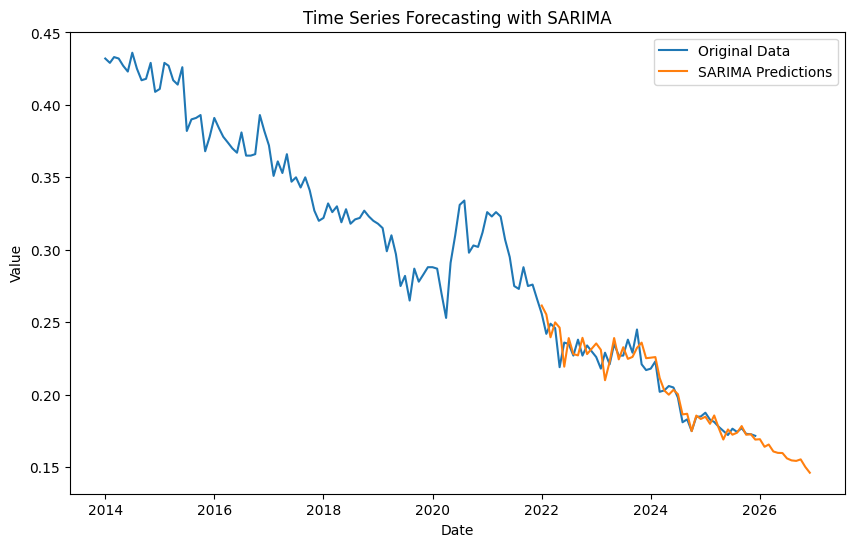

SARIMA - MSE: 6.943518551137051e-05, RMSE: 0.00833277777883045, MAPE: 2.77%


In [59]:
model_sarima(data_filtered, 'Italy', '15-24', 'Total')

### 25+, Female

In [60]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Female')

In [61]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9728
Strong seasonality detected.


(0.9727627039228897, True)

In [62]:
data_filtered

,Value
Date,
2014-01-01,0.117000
2014-02-01,0.117000
2014-03-01,0.117000
2014-04-01,0.116000
2014-05-01,0.116000
...,...
2025-08-01,0.068249
2025-09-01,0.068249
2025-10-01,0.066960


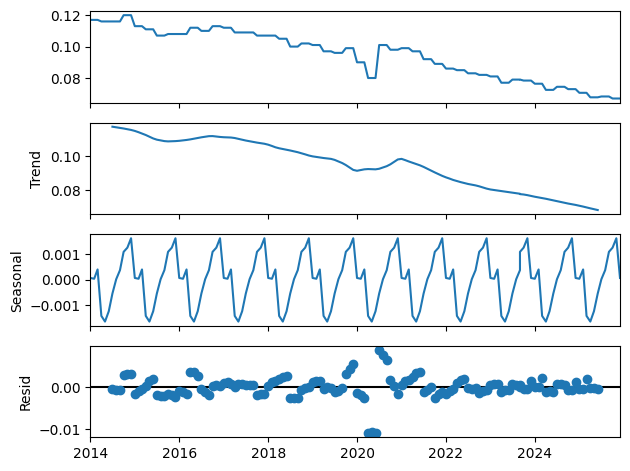

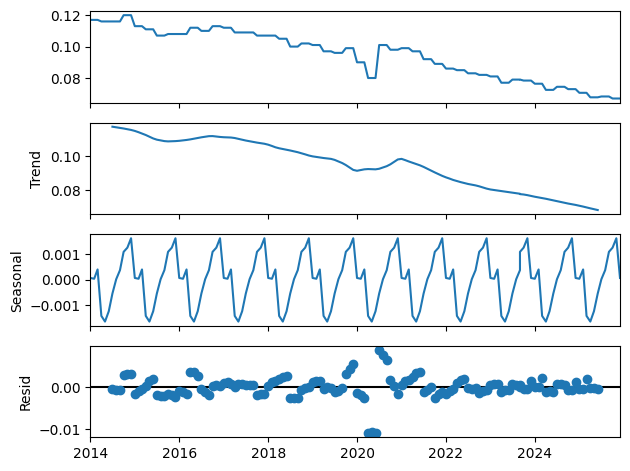

In [63]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [64]:

data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)


2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1163.700, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1093.740, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1121.136, Time=0.47 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1165.700, Time=3.93 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1091.741, Time=0.48 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1163.246, Time=0.51 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1087.741, Time=5.76 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1121.136, Time=0.60 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.58 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1167.700, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1165.246, Time=0.23 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1145.551, Time=0.78 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1123.136, Time=0.10 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1152.761, Time=1.86 sec
 ARIMA(1,1,

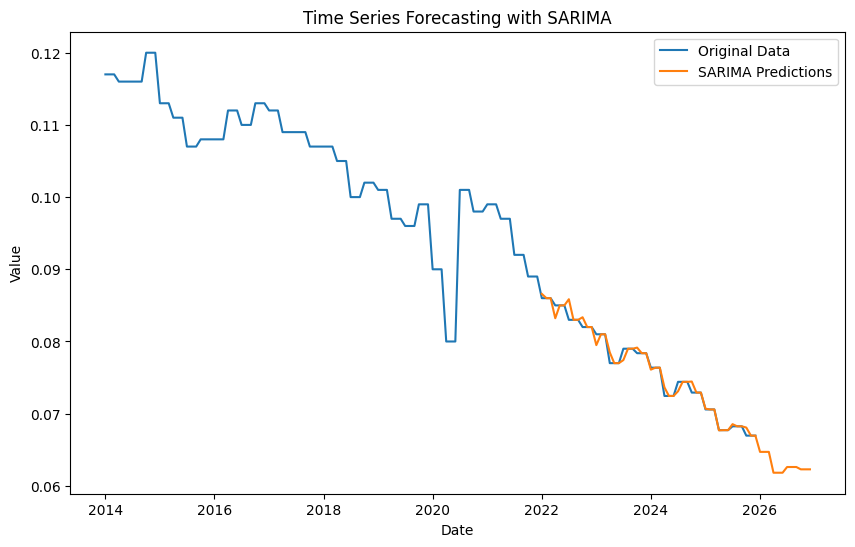

SARIMA - MSE: 5.823060177321551e-07, RMSE: 0.0007630897835328128, MAPE: 0.47%


In [65]:
model_sarima(data_filtered, 'Italy', '25+', 'Female')

### 25+ Male

In [66]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Male')

In [67]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9913
Strong seasonality detected.


(0.9913436556621181, True)

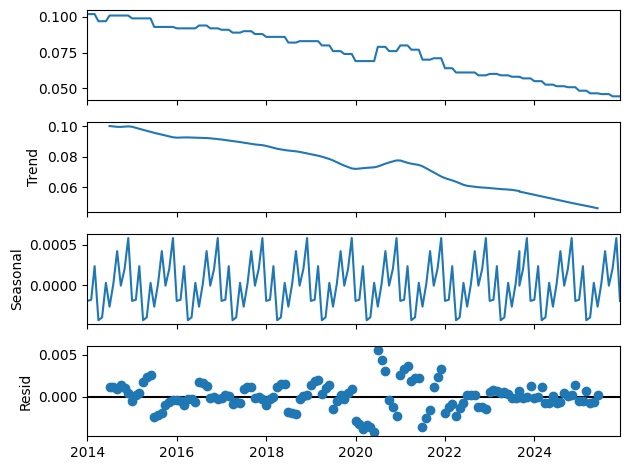

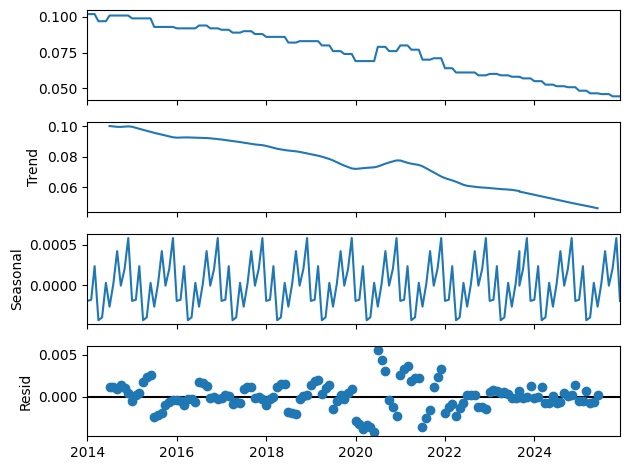

In [68]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [69]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)


2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1151.786, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1231.335, Time=0.86 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1147.788, Time=0.44 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1149.786, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1289.566, Time=1.25 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1337.134, Time=1.35 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1209.095, Time=0.39 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-1317.577, Time=1.43 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1300.543, Time=1.06 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-1335.496, Time=0.29 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-1335.137, Time=0.96 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1335.135, Time=1.67 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-1337.137, Time=0.70 sec
 ARIMA(0,1,

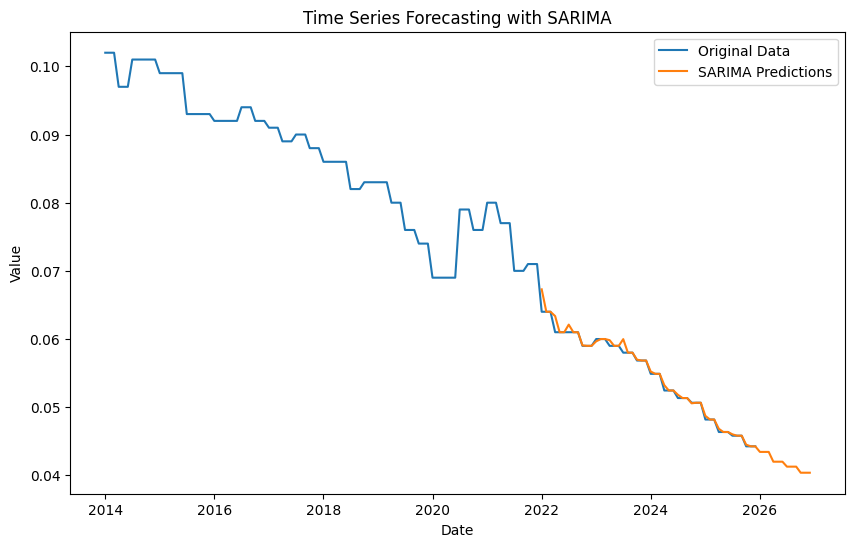

SARIMA - MSE: 4.994855693354387e-07, RMSE: 0.0007067429301630394, MAPE: 0.48%


In [70]:
model_sarima(data_filtered, 'Italy', '25+', 'Male')

### 25+, Total

In [71]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Total')

In [72]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9877
Strong seasonality detected.


(0.9877192768527281, True)

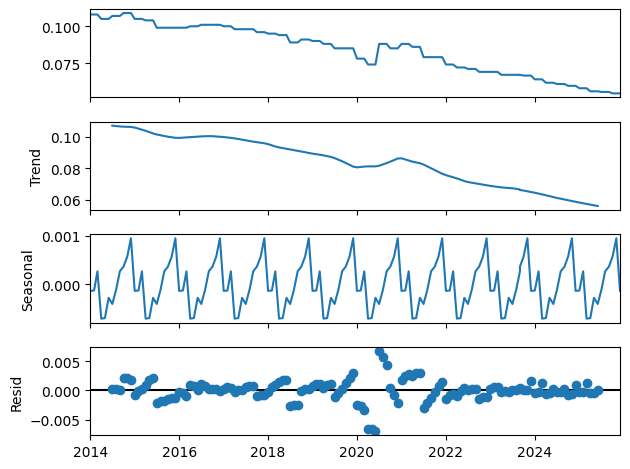

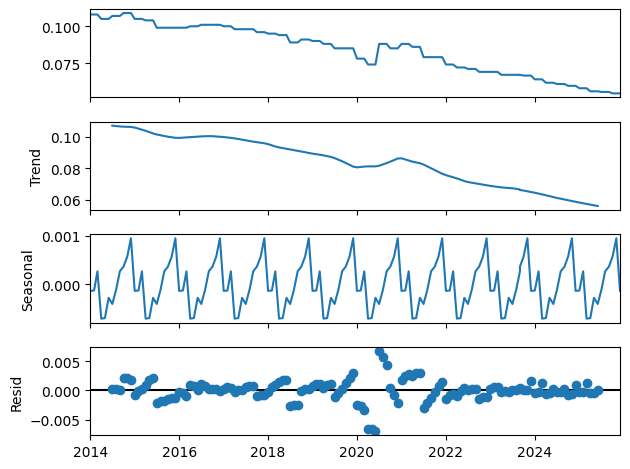

In [73]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [74]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)


2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1144.600, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1199.578, Time=0.36 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1142.601, Time=0.12 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1239.317, Time=0.44 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1272.404, Time=1.68 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1171.227, Time=0.21 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-1264.906, Time=1.35 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1263.443, Time=0.92 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-1274.404, Time=0.38 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1247.158, Time=0.60 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-1241.318, Time=0.48 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-1266.906, Time=0.96 sec
 ARIMA(0,1,0)(1,1

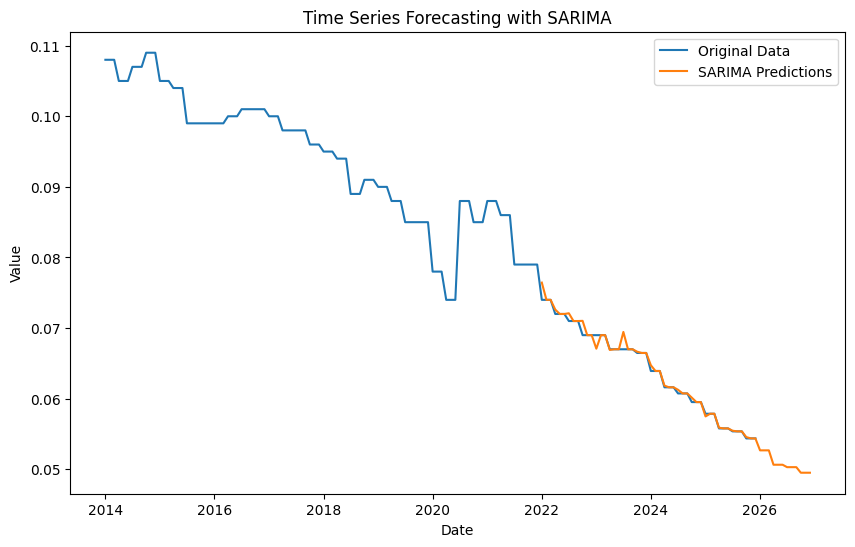

SARIMA - MSE: 4.78807962559272e-07, RMSE: 0.0006919595093350997, MAPE: 0.43%


In [75]:
model_sarima(data_filtered, 'Italy', '25+', 'Total')

## France

### 15-24, Male

In [76]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Male')

In [77]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9458
Strong seasonality detected.


(0.9457994203066257, True)

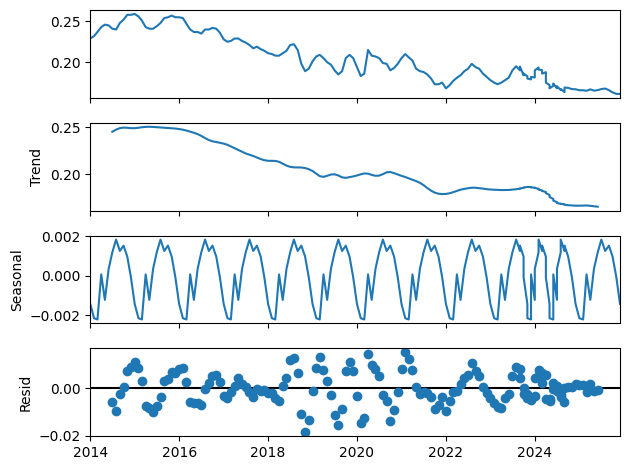

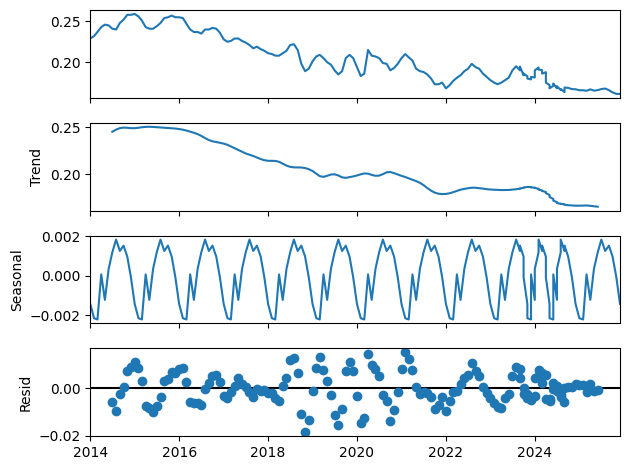

In [78]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [79]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-865.281, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-931.426, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-883.629, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-956.382, Time=1.05 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-952.695, Time=1.24 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-967.655, Time=0.55 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=2.04 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-965.285, Time=0.98 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-955.070, Time=2.18 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-969.262, Time=2.41 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=i

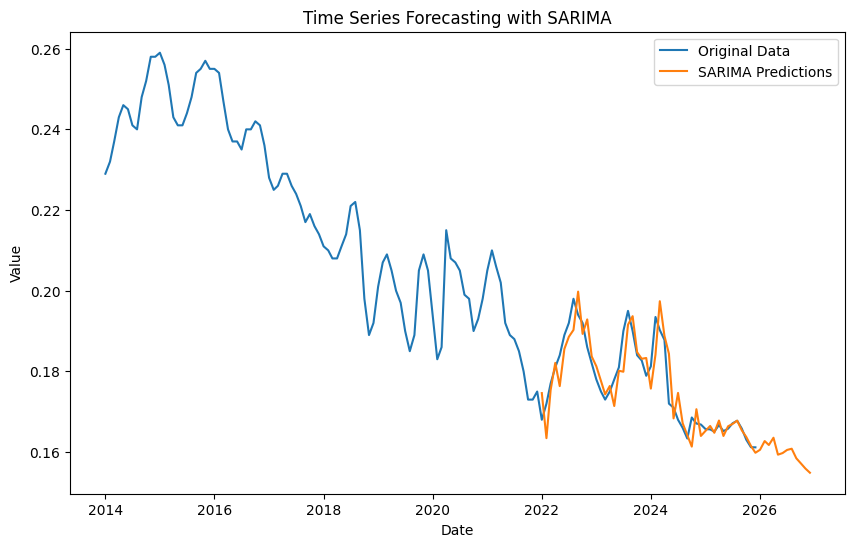

SARIMA - MSE: 2.1277170138340167e-05, RMSE: 0.00461271830251319, MAPE: 1.90%


In [80]:
model_sarima(data_filtered,'France', '15-24', 'Male')

### 15-24, Female

In [81]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Female')

In [82]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9684
Strong seasonality detected.


(0.9684193754724384, True)

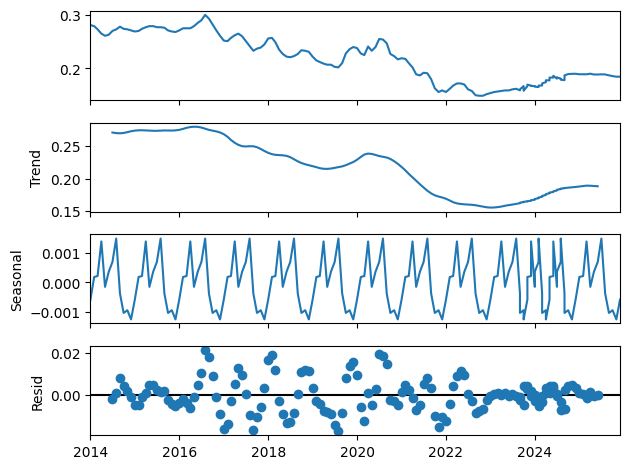

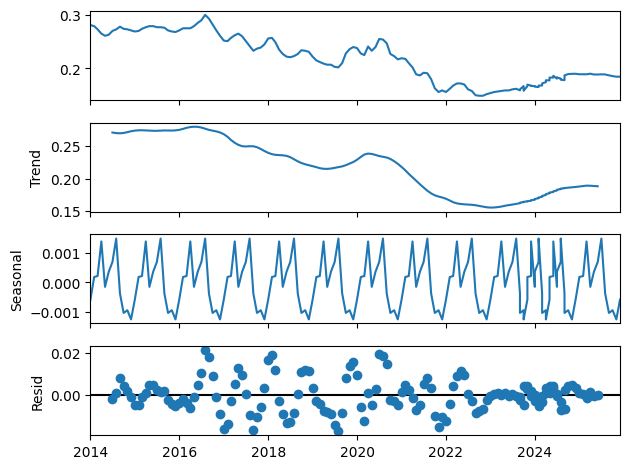

In [83]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [84]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-939.155, Time=0.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-861.738, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-919.792, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-947.919, Time=0.41 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-898.321, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=2.40 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-919.215, Time=0.41 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.64 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.52 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-940.165, Time=0.52 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-935.475, Time=0.38 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.07 sec

Best model:  ARIMA(0,1,1)(0,1,1)[12]          
T

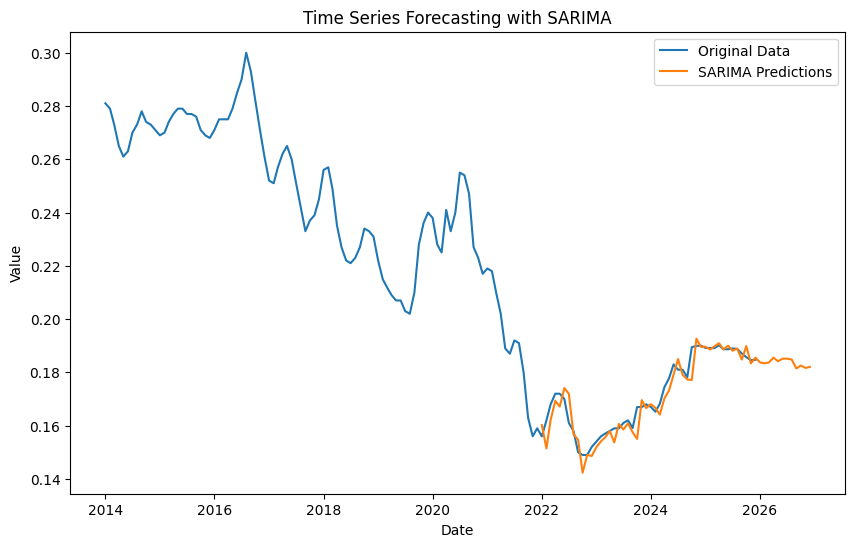

SARIMA - MSE: 1.866124730357024e-05, RMSE: 0.004319866584001205, MAPE: 1.83%


In [85]:
model_sarima(data_filtered,'France', '15-24', 'Female')

### 15-24, Total

In [86]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Total')

In [87]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9780
Strong seasonality detected.


(0.9780132497435645, True)

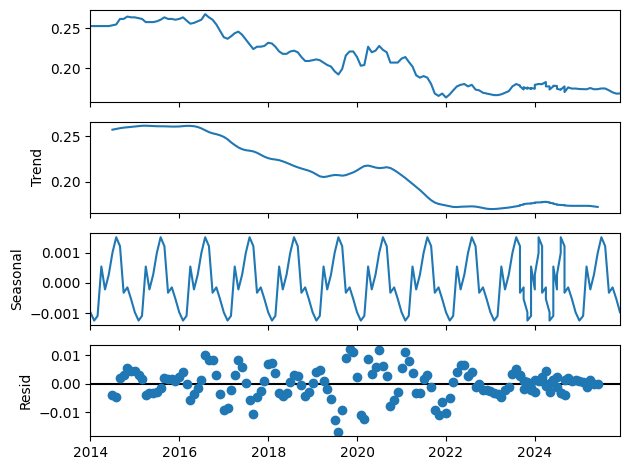

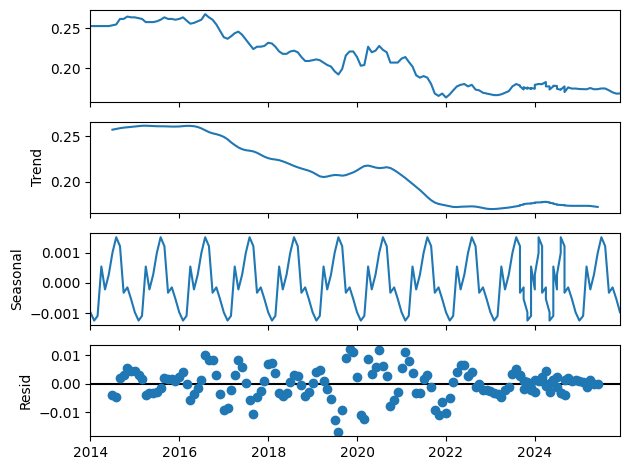

In [88]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [89]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1003.285, Time=0.65 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-914.518, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-968.407, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1005.939, Time=0.83 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-932.396, Time=0.14 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1010.175, Time=2.83 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-969.580, Time=0.58 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-988.840, Time=1.59 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.83 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-994.004, Time=1.94 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-1007.875, Time=1.82 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1003.731, Time=1.04 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1006.556, Time=1.78 sec
 ARIMA(0,1,2)(1,1,1)[12

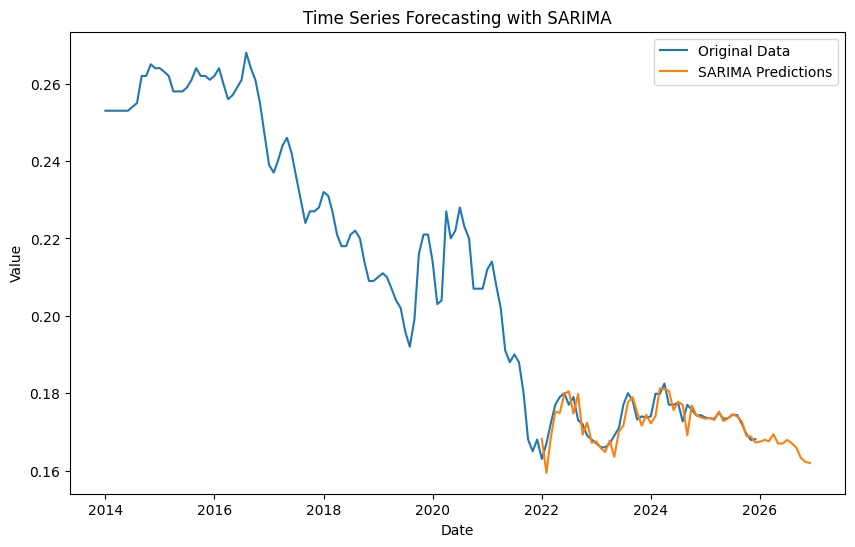

SARIMA - MSE: 9.0421572628256e-06, RMSE: 0.0030070180017461815, MAPE: 1.22%


In [90]:
model_sarima(data_filtered,'France', '15-24', 'Total')

### 25+, Male

In [91]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Male')

In [92]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9696
Strong seasonality detected.


(0.9696297940369725, True)

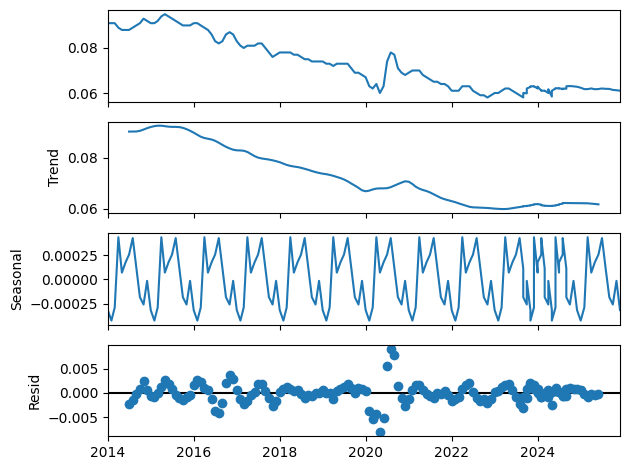

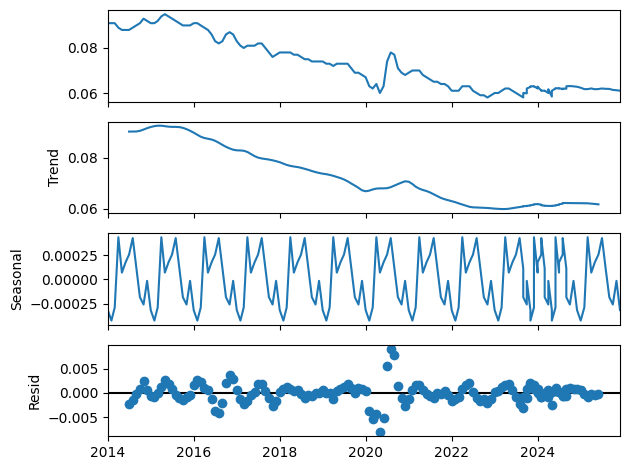

In [93]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [94]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1285.409, Time=1.25 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1195.481, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1252.318, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1288.065, Time=0.32 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1226.153, Time=0.15 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1278.267, Time=1.04 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1222.154, Time=0.43 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1262.198, Time=0.31 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1259.709, Time=0.26 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1282.443, Time=1.28 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1278.191, Time=1.02 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1236.047, Time=0.98 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-1286.099, Time=0.59 sec

Best model

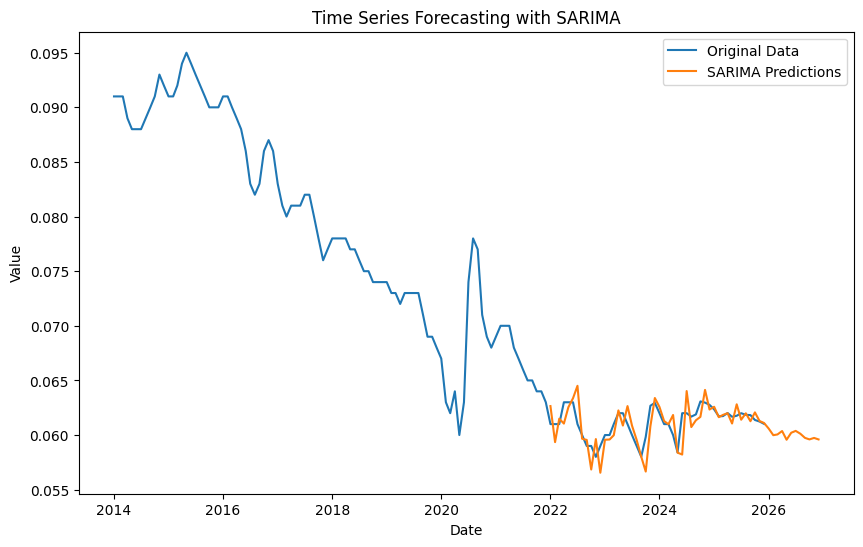

SARIMA - MSE: 1.7896832936171044e-06, RMSE: 0.0013377904520578343, MAPE: 1.58%


In [95]:
model_sarima(data_filtered,'France', '25+', 'Male')

### 25+, Female

In [96]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [97]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9273
Strong seasonality detected.


(0.9273400471913931, True)

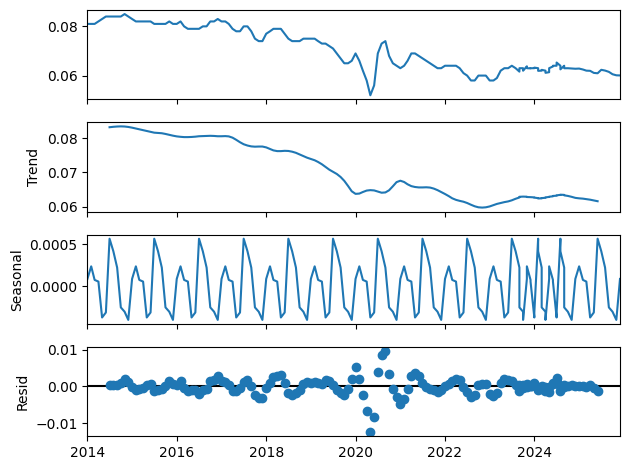

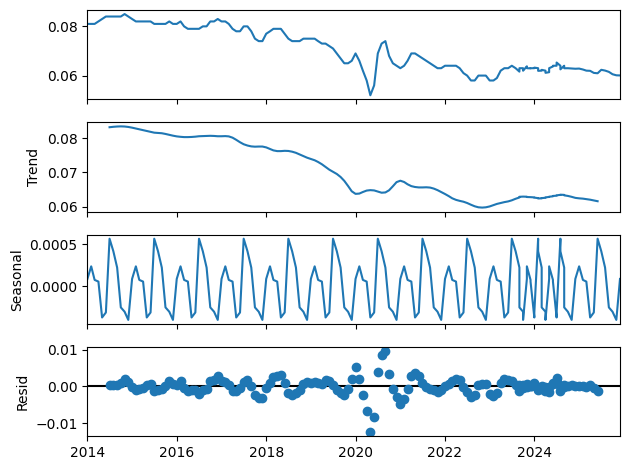

In [98]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [99]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1160.849, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1222.217, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1189.459, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1239.593, Time=0.34 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1244.016, Time=1.53 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1250.418, Time=1.43 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-1252.321, Time=1.99 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-1229.423, Time=0.49 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-1267.383, Time=3.08 sec
 ARIMA(2,1,0)(1,1,2)[12]           

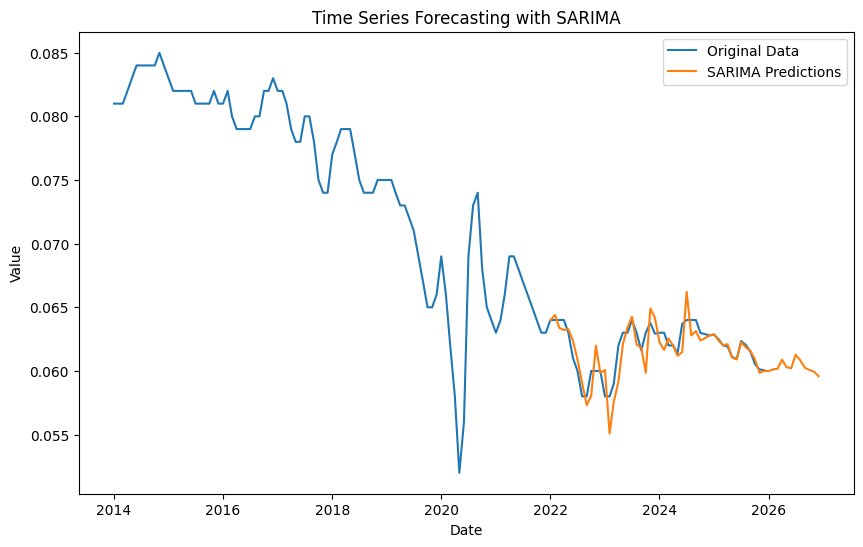

SARIMA - MSE: 1.3877021251635803e-06, RMSE: 0.0011780076931682494, MAPE: 1.34%


In [100]:
model_sarima(data_filtered,'France', '25+', 'Female')

### 25+, Total

In [101]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [102]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9273
Strong seasonality detected.


(0.9273400471913931, True)

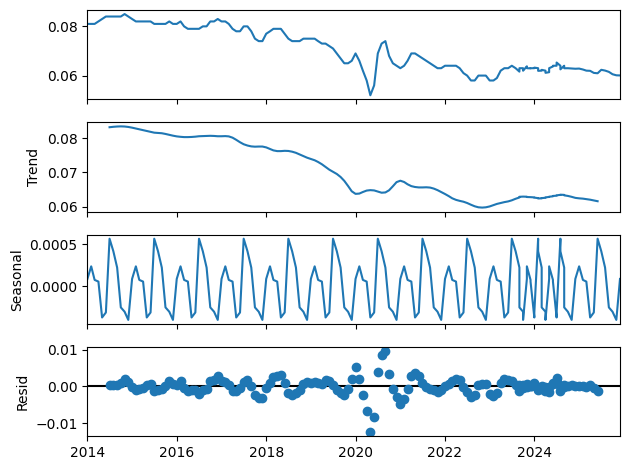

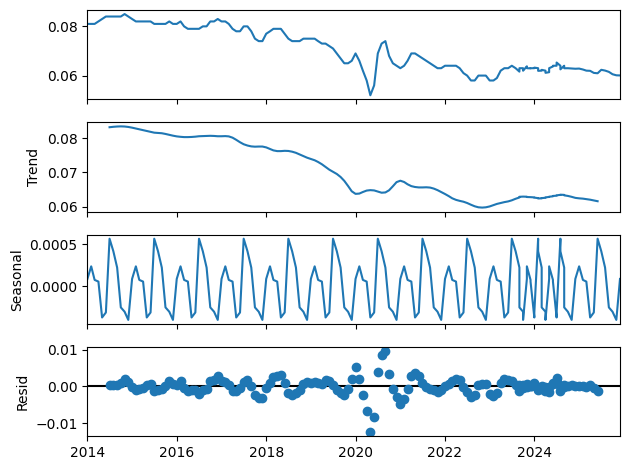

In [103]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [104]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1160.849, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1222.217, Time=0.41 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1189.459, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1239.593, Time=0.41 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1244.016, Time=1.33 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1250.418, Time=0.72 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-1252.321, Time=1.90 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-1229.423, Time=0.55 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-1267.383, Time=2.71 sec
 ARIMA(2,1,0)(1,1,2)[12]           

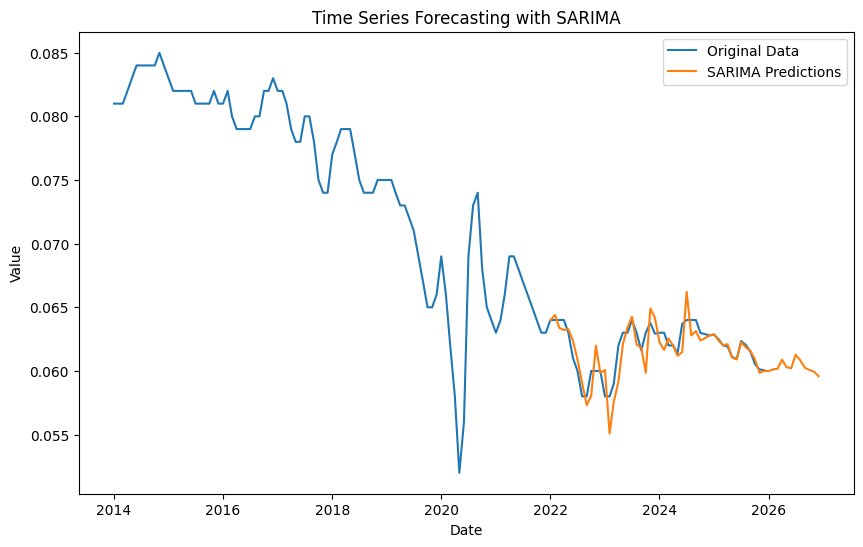

SARIMA - MSE: 1.3877021251635803e-06, RMSE: 0.0011780076931682494, MAPE: 1.34%


In [105]:
model_sarima(data_filtered,'France', '25+', 'Total')

## Iceland

### 15-24,Male

In [106]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Male')

In [107]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9871
Strong seasonality detected.


(0.9871309174614058, True)

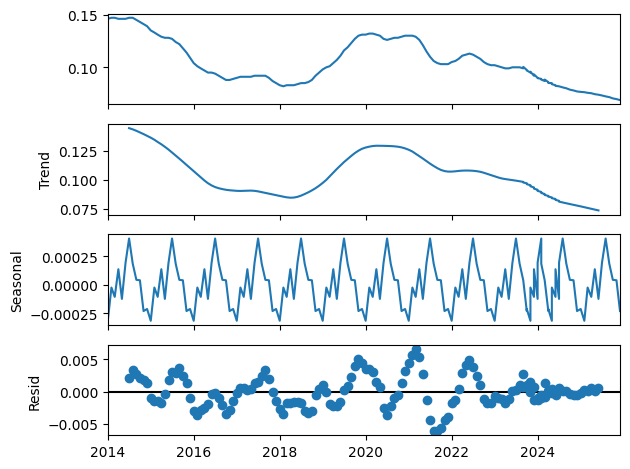

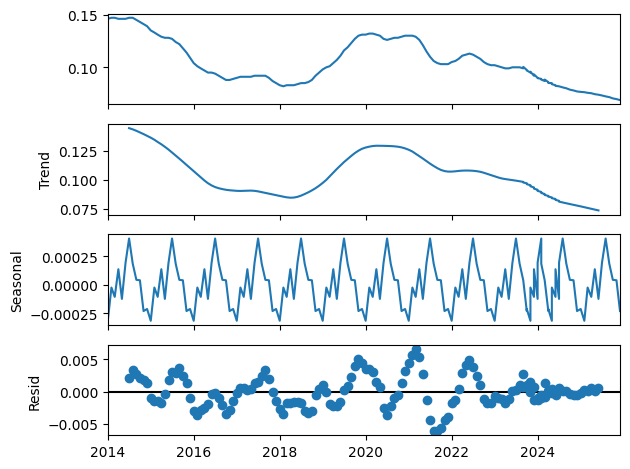

In [108]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [109]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1388.847, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1184.392, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1359.821, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1304.327, Time=0.67 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1337.168, Time=0.24 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1380.369, Time=0.65 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1333.171, Time=0.61 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1359.827, Time=0.68 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1336.240, Time=1.08 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1388.511, Time=0.50 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1387.708, Time=0.64 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1386.754, Time=0.62 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1214.951, Time=0.09 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1318.135, Time=0.57 sec
 ARIM

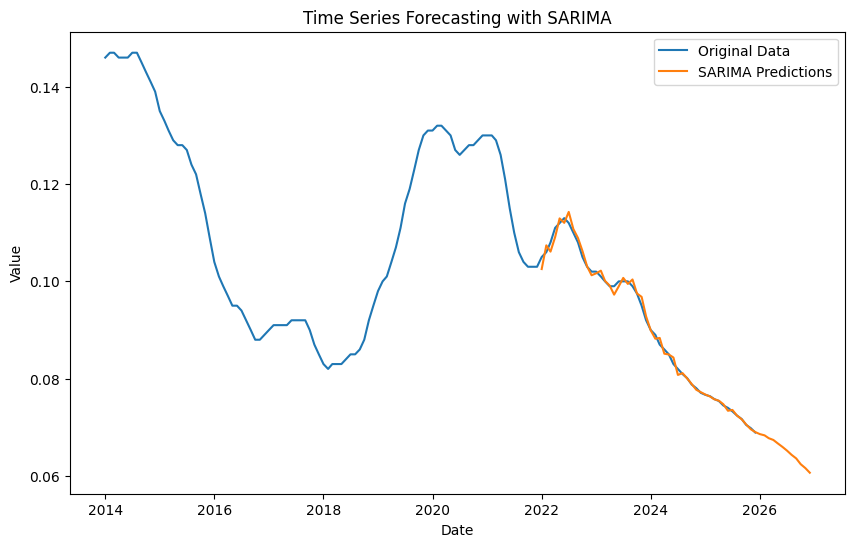

SARIMA - MSE: 9.435322189094916e-07, RMSE: 0.000971355866255767, MAPE: 0.72%


In [110]:
model_sarima(data_filtered,'Iceland', '15-24', 'Male')

### 15-24, Female

In [111]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Female')

In [112]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9573
Strong seasonality detected.


(0.957333649074975, True)

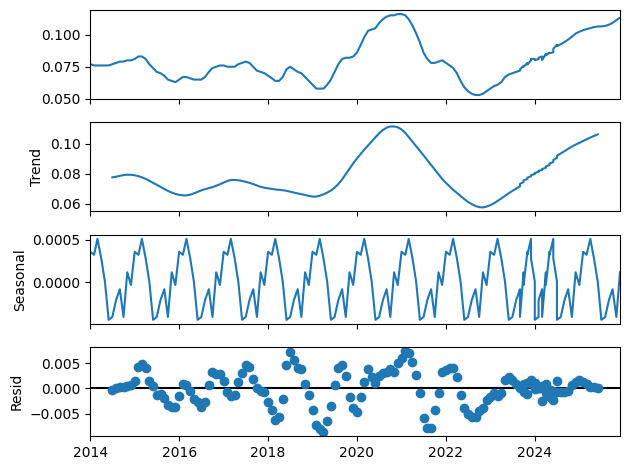

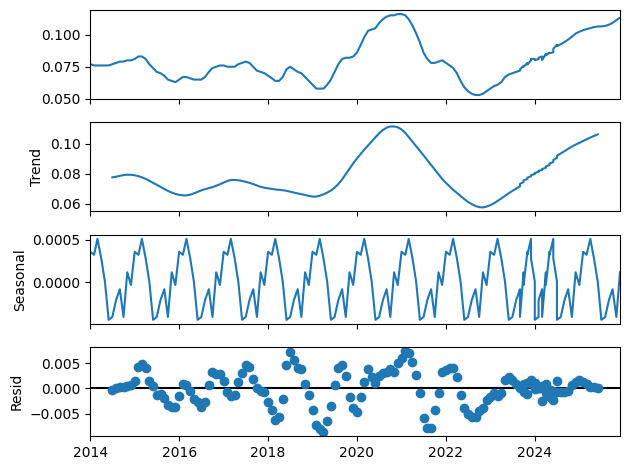

In [113]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [114]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1251.428, Time=0.60 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1097.741, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1238.550, Time=0.46 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1191.624, Time=0.24 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1215.619, Time=0.25 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1247.119, Time=0.44 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1260.353, Time=2.08 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1231.534, Time=1.34 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1212.063, Time=0.40 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1209.404, Time=0.44 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-1209.588, Time=0.98 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1093.742, Time=0.41 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1242.213, Time=1.61 sec
 ARIMA(2,1,

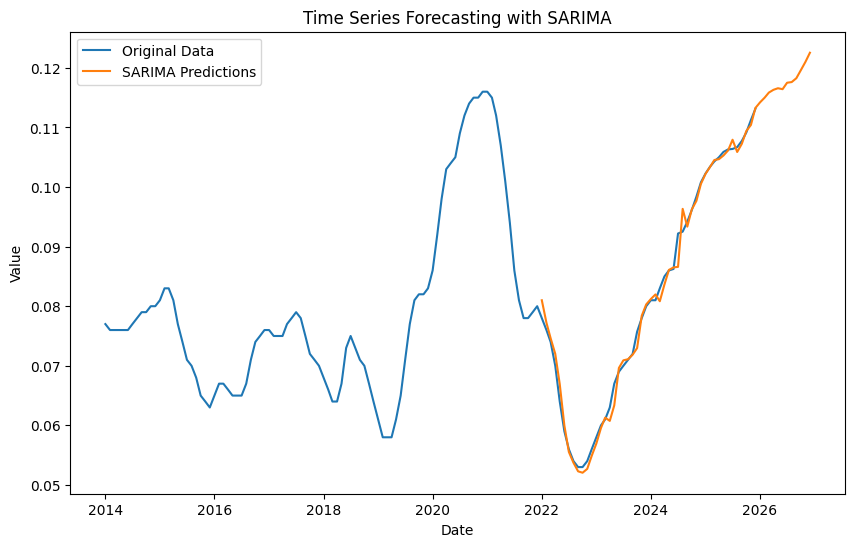

SARIMA - MSE: 2.4438071512353007e-06, RMSE: 0.0015632680996026562, MAPE: 1.39%


In [115]:
model_sarima(data_filtered,'Iceland', '15-24', 'Female')

### 15-24, Total

In [116]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Total')

In [117]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9690
Strong seasonality detected.


(0.9689802497761655, True)

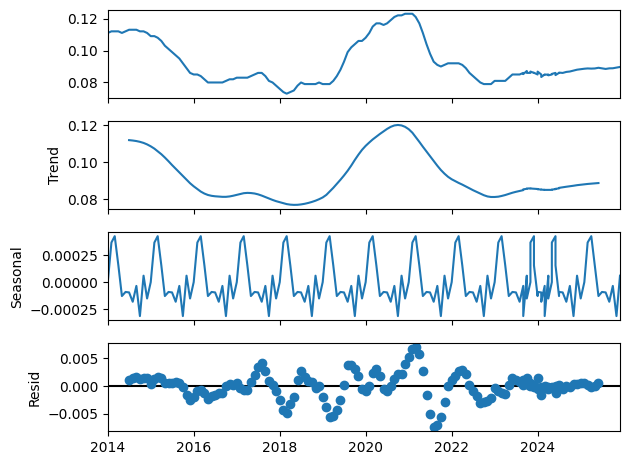

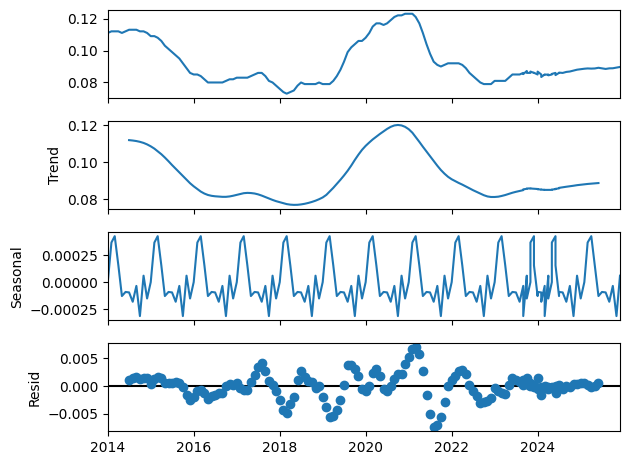

In [118]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [119]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1344.671, Time=0.44 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1193.074, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1335.671, Time=0.36 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1286.957, Time=1.15 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1318.407, Time=0.21 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1341.766, Time=0.33 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1314.411, Time=0.97 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1331.980, Time=0.17 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1320.115, Time=0.72 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1347.390, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1320.393, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1348.826, Time=0.49 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1340.188, Time=0.52 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1322.147, Time=0.60 sec
 ARIM

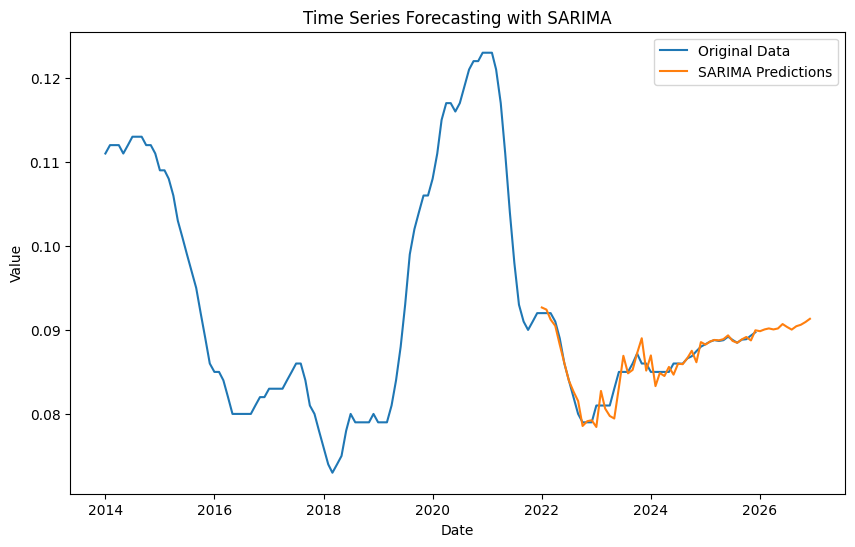

SARIMA - MSE: 1.2185509028346907e-06, RMSE: 0.001103879931348827, MAPE: 0.85%


In [120]:
model_sarima(data_filtered,'Iceland', '15-24', 'Total')

### 25+, Male

In [121]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Male')

In [122]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9768
Strong seasonality detected.


(0.9767508813109844, True)

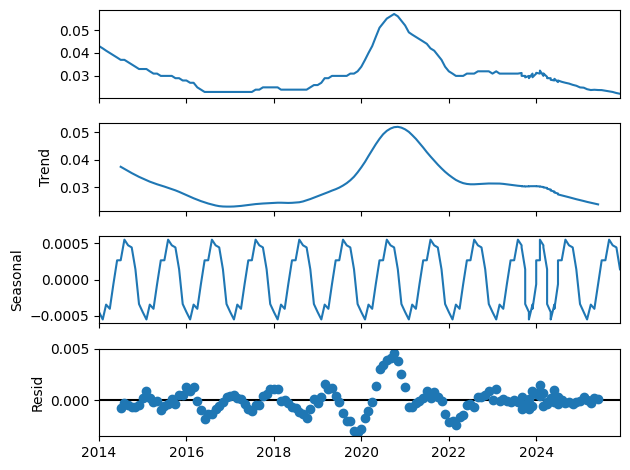

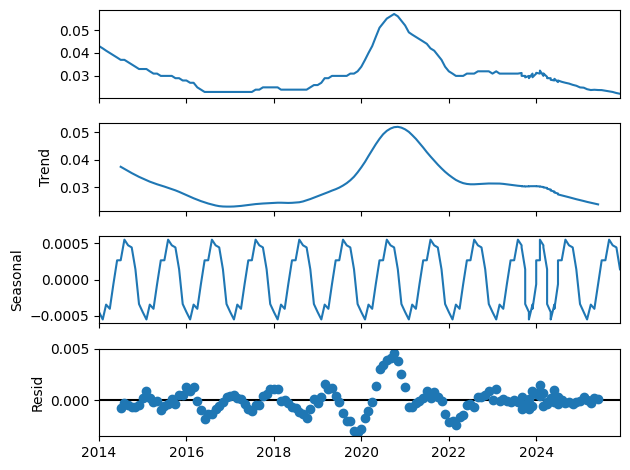

In [123]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [124]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1482.783, Time=0.66 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1315.298, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1448.774, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1415.245, Time=0.61 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1435.315, Time=0.10 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1462.805, Time=0.43 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1458.931, Time=0.14 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1451.535, Time=0.71 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1463.580, Time=0.15 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1488.243, Time=0.62 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1441.443, Time=0.38 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1468.581, Time=1.24 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=1.38 sec
 ARIMA(2,1,1)(1,1

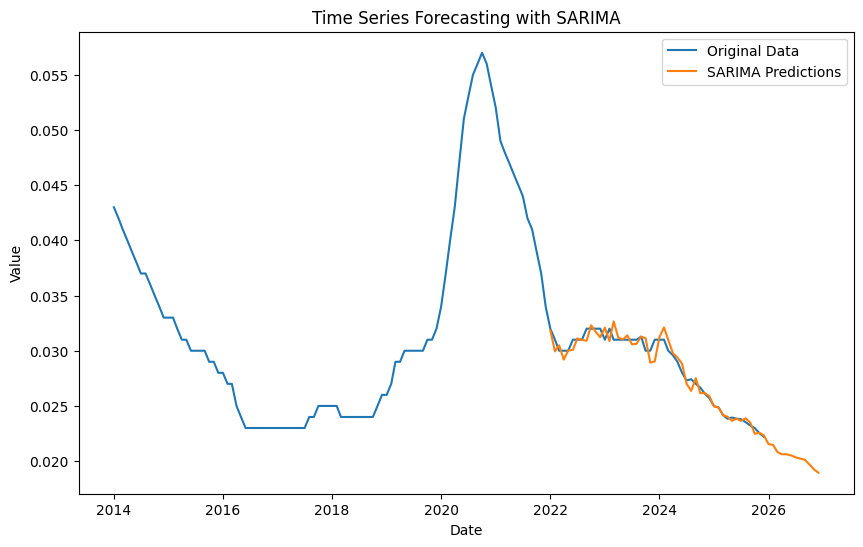

SARIMA - MSE: 4.657614296023116e-07, RMSE: 0.0006824671637539139, MAPE: 1.68%


In [125]:
model_sarima(data_filtered,'Iceland', '25+', 'Male')

### 25+, Female

In [126]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Female')

In [127]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9827
Strong seasonality detected.


(0.9827486677901346, True)

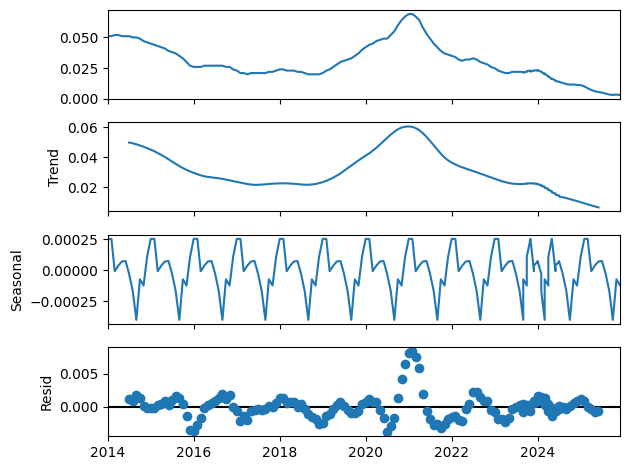

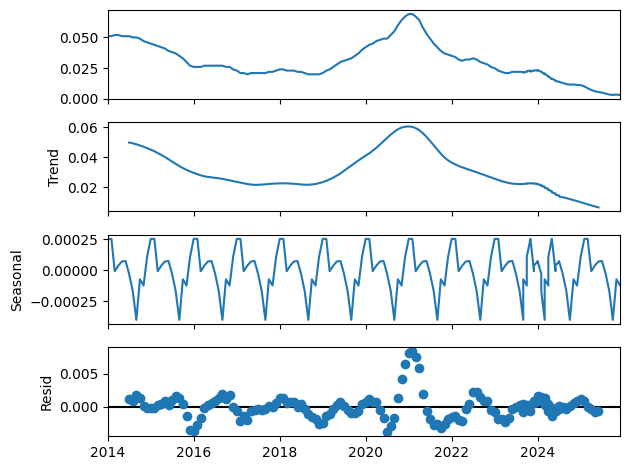

In [128]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [129]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1405.516, Time=1.47 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1222.322, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1386.191, Time=1.86 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1320.324, Time=0.44 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1359.353, Time=0.50 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1392.621, Time=1.15 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1355.357, Time=1.30 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1385.263, Time=1.32 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1381.919, Time=1.53 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1405.774, Time=0.37 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1358.854, Time=0.18 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1393.616, Time=0.70 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1354.852, Time=1.37 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1382.977, Time=1.04 sec
 ARIM

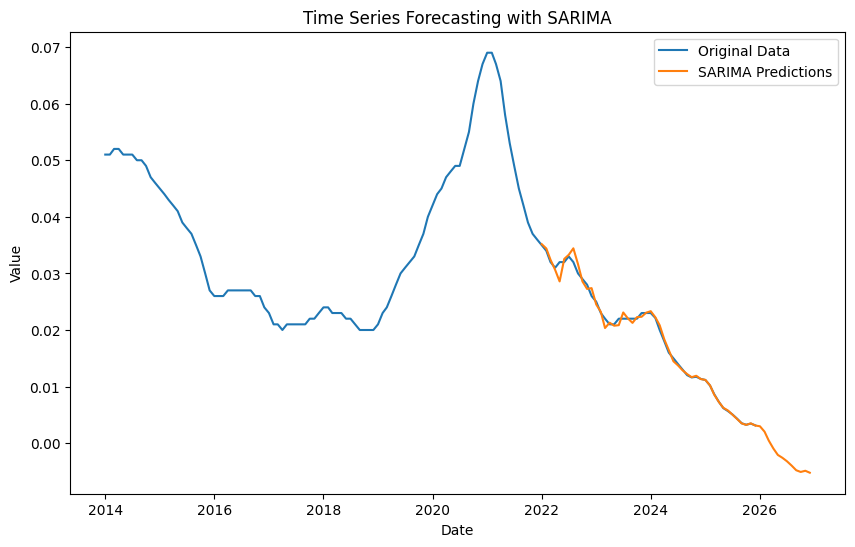

SARIMA - MSE: 6.706121393505503e-07, RMSE: 0.0008189091154398943, MAPE: 2.11%


In [130]:
model_sarima(data_filtered,'Iceland', '25+', 'Female')

### 25+, Total

In [131]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Total')

In [132]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9881
Strong seasonality detected.


(0.9881386215025488, True)

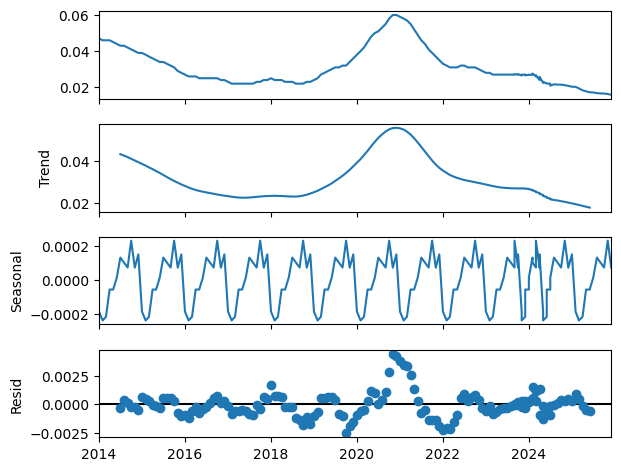

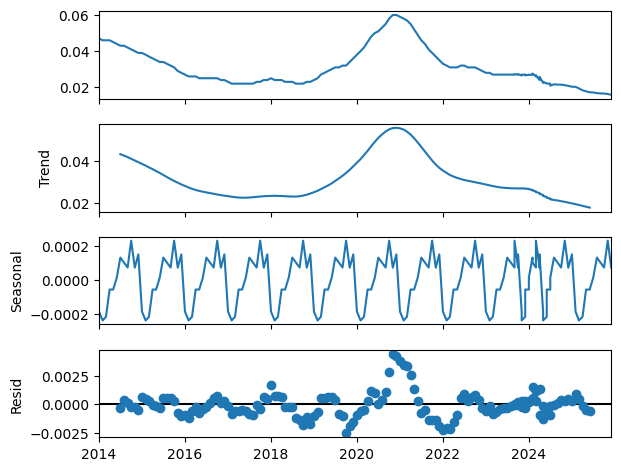

In [133]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [134]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1485.962, Time=0.78 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1301.816, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1471.506, Time=0.36 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1397.369, Time=0.57 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1444.788, Time=0.27 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1473.727, Time=1.09 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1440.788, Time=0.84 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1474.636, Time=0.76 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=3.90 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1482.991, Time=1.28 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1485.675, Time=0.73 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1484.997, Time=0.44 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1340.788, Time=0.20 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1446.620, Time=0.23 sec
 ARIMA(2,1,

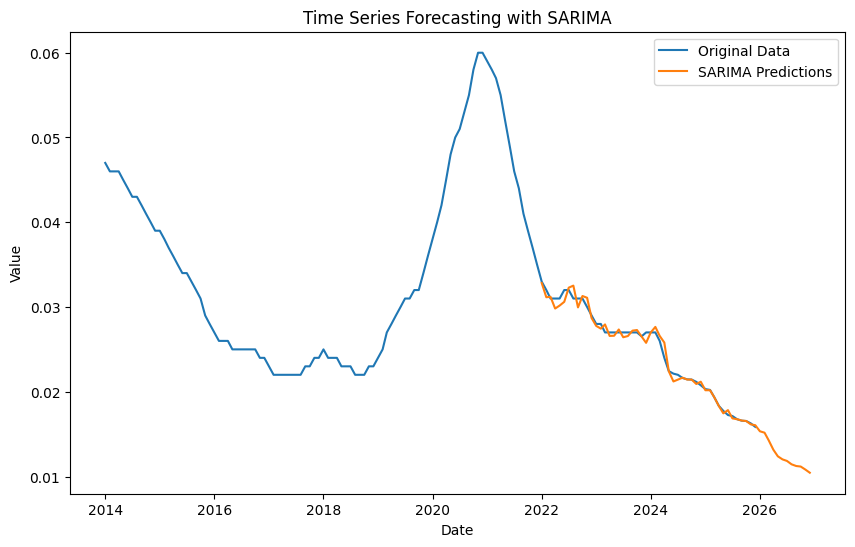

SARIMA - MSE: 4.065313457147384e-07, RMSE: 0.0006375981067371032, MAPE: 1.72%


In [135]:
model_sarima(data_filtered,'Iceland', '25+', 'Total')

## Greece

### 15-24, Female

In [136]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Female')

In [137]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8838
Strong seasonality detected.


(0.8837979679623402, True)

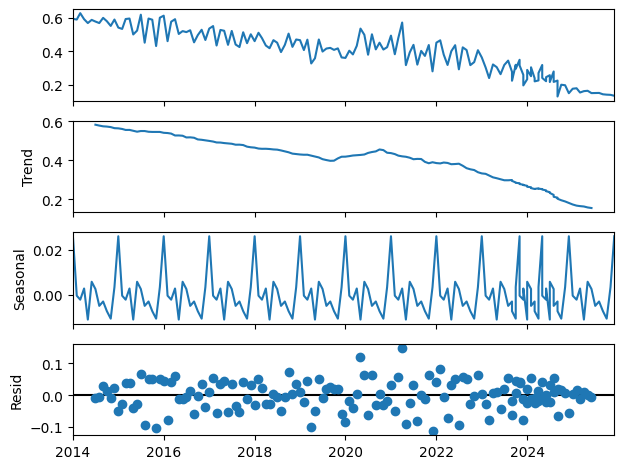

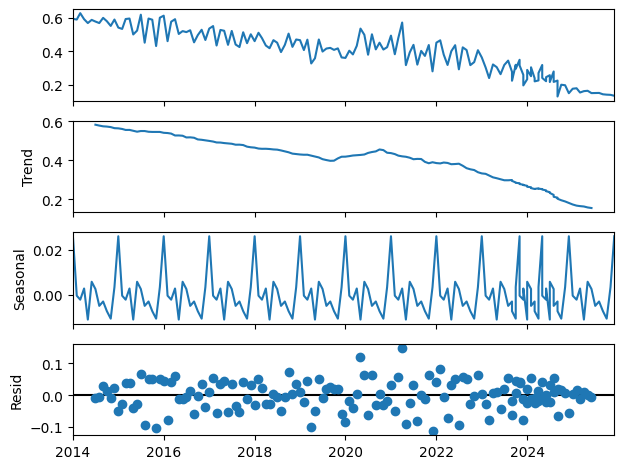

In [138]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [139]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.88 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-198.307, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-284.082, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-230.245, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-304.250, Time=0.57 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-314.867, Time=0.88 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-315.807, Time=0.46 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-315.833, Time=1.30 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-316.820, Time=0.83 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-283.922, Time=0.89 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-365.346, Time=0.99 sec
 ARIMA(1,1,1)(1,1,2)[12]             : 

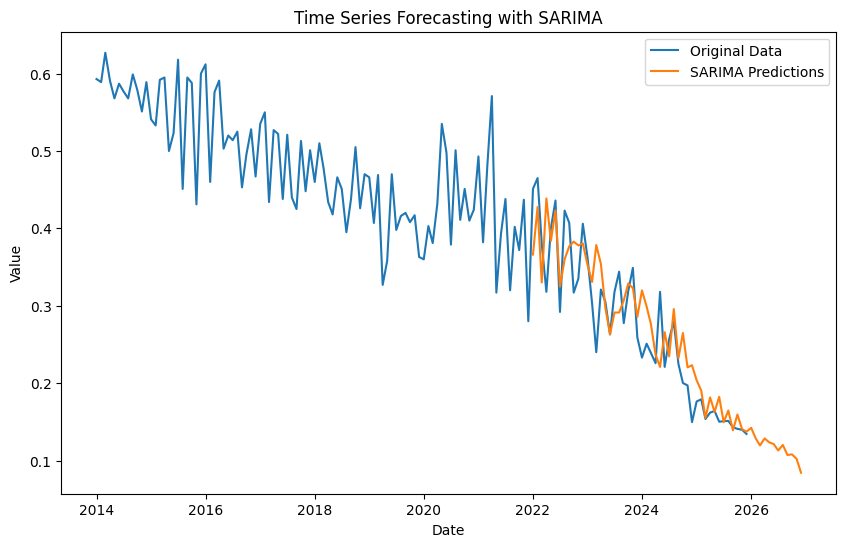

SARIMA - MSE: 0.002135191489435418, RMSE: 0.04620813228681092, MAPE: 12.92%


In [140]:
model_sarima(data_filtered,'Greece', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-190.892, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-245.215, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-192.892, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-362.357, Time=0.11 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-394.295, Time=0.14 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-437.913, Time=0.30 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-442.781, Time=0.31 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-441.985, Time=0.54 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-445.693, Time=0.38 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 s

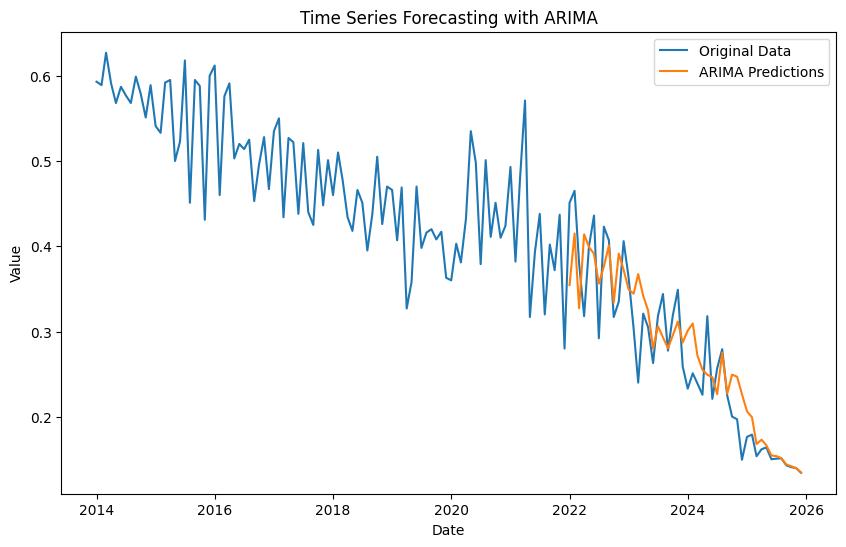

ARIMA - MSE: 0.002559587333761622, RMSE: 0.05059236438200553, MAPE: 13.40%


In [141]:
model_arima(data_filtered,'Greece', '15-24', 'Female')

### 15-24, Male

In [142]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Male')

In [143]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9355
Strong seasonality detected.


(0.9355402435813007, True)

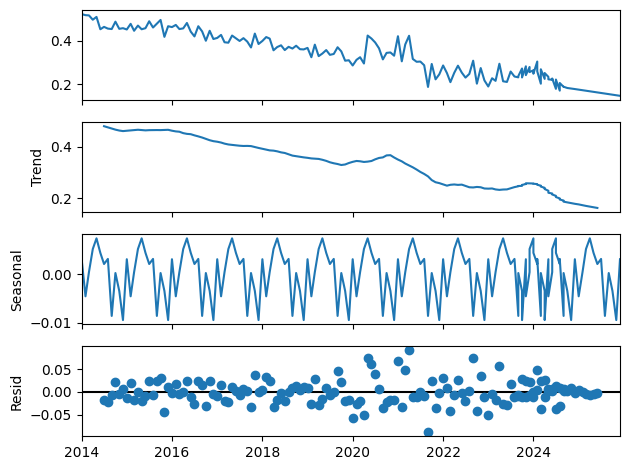

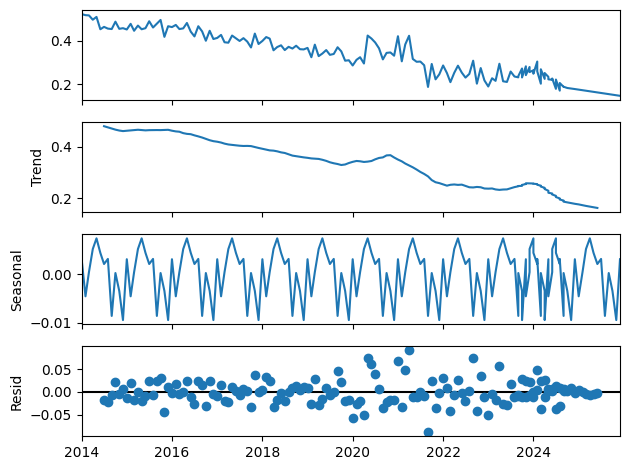

In [144]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [145]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-358.979, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-440.430, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-387.562, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-447.797, Time=0.43 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-413.023, Time=0.30 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-468.870, Time=0.50 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-456.146, Time=0.44 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.88 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-466.999, Time=0.60 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-467.0

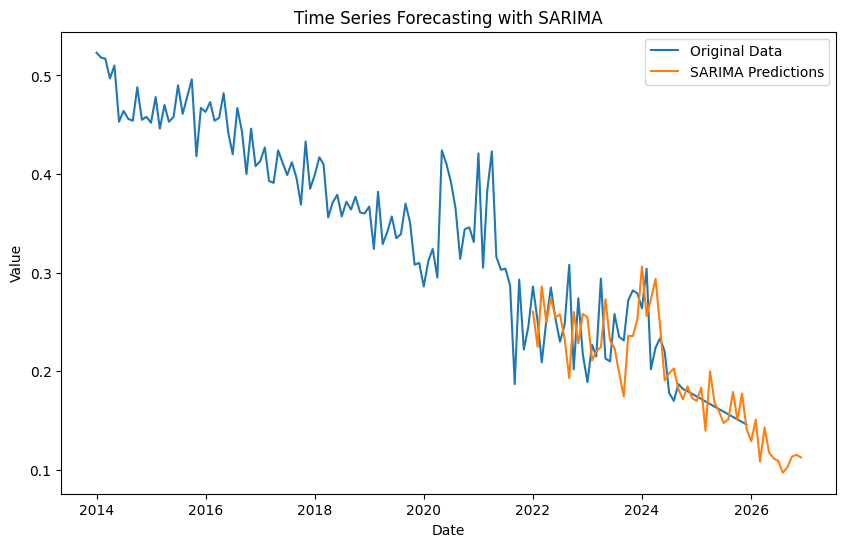

SARIMA - MSE: 0.0015123599152630663, RMSE: 0.038889071925967404, MAPE: 13.35%


In [146]:
model_sarima(data_filtered,'Greece', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-358.075, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-432.838, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-360.075, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-503.307, Time=0.15 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-522.193, Time=0.11 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-559.893, Time=0.28 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-558.846, Time=0.26 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-554.552, Time=0.27 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=inf, Time=0.48 sec

Best model:  ARIMA(3,2,1)(0,0,0)[0] intercept
Total fit time: 2.832 seconds
                               SARIMAX Results                                
Dep. Variable:               

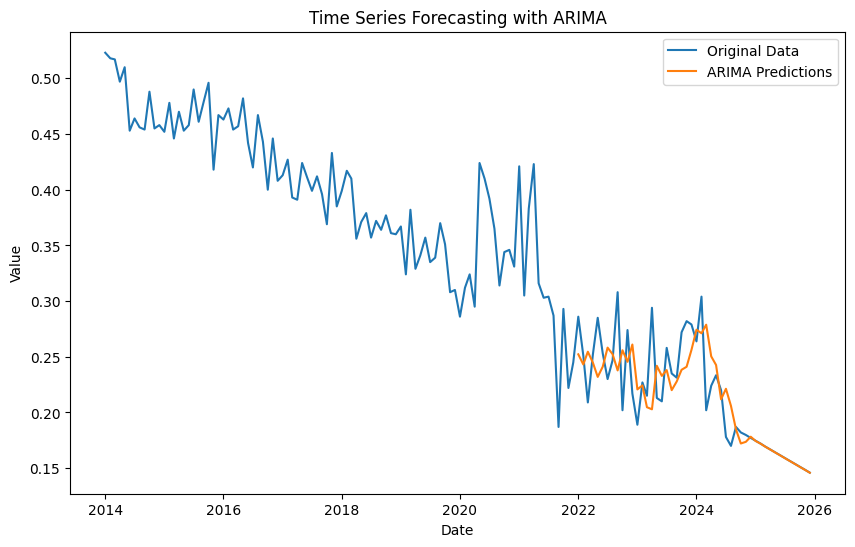

ARIMA - MSE: 0.0013463552139909274, RMSE: 0.0366927133637038, MAPE: 11.95%


In [147]:
model_arima(data_filtered,'Greece', '15-24', 'Male')

### 15-24, Total

In [148]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Total')

In [149]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9356
Strong seasonality detected.


(0.935599814977019, True)

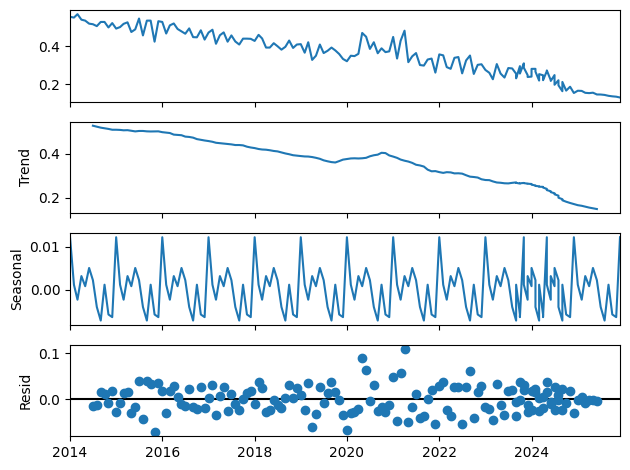

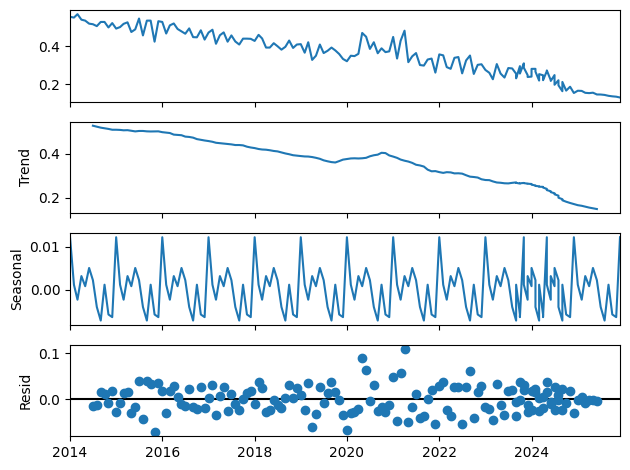

In [150]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [151]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-320.937, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-398.825, Time=0.44 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-341.691, Time=0.10 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-415.791, Time=0.51 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-430.619, Time=1.12 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.28 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-402.904, Time=1.09 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.29 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-467.702, Time=1.16 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-451.848, T

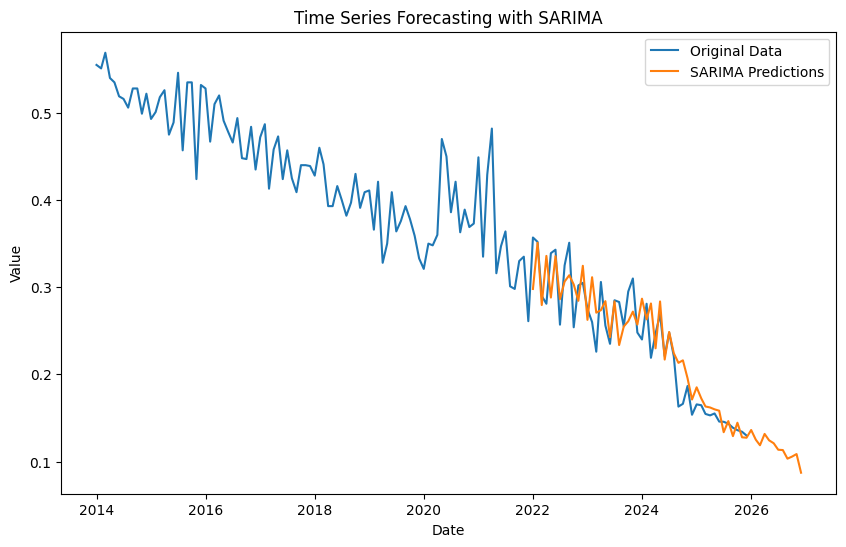

SARIMA - MSE: 0.0008385511532592355, RMSE: 0.02895774772421425, MAPE: 9.33%


In [152]:
model_sarima(data_filtered,'Greece', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-496.214, Time=0.51 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-329.533, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-375.900, Time=0.14 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-331.533, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-562.635, Time=0.47 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-510.372, Time=0.22 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-567.979, Time=0.52 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-526.163, Time=0.22 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-568.977, Time=0.50 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-567.190, Time=0.41 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-577.622, Time=0.37 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-575.595, Time=0.77 sec
 ARIMA(3,2,3)(0,0,0)[0]             : AIC=inf, Time=0.70 sec

Best model:  ARIMA(3,2,3)(0,0,0)[0] interc

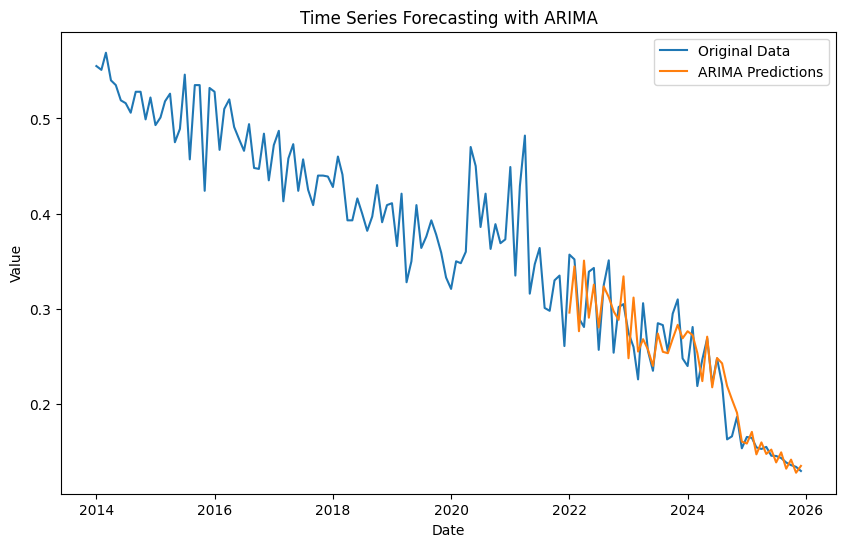

ARIMA - MSE: 0.0009347569659121176, RMSE: 0.03057379541228268, MAPE: 8.78%


In [153]:
model_arima(data_filtered,'Greece', '15-24', 'Total')

### 25+, Female

In [154]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Female')

In [155]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9908
Strong seasonality detected.


(0.9908494493214817, True)

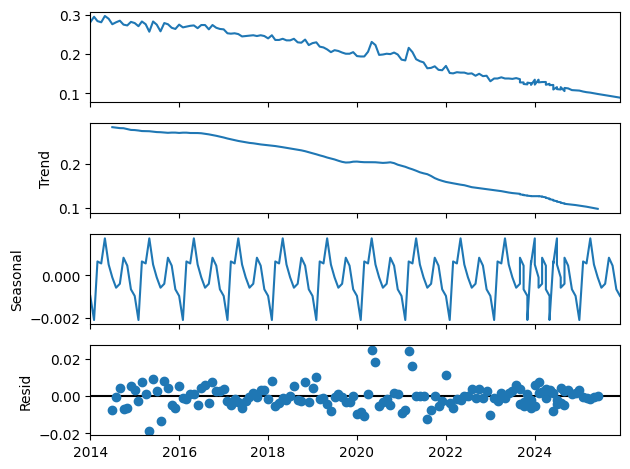

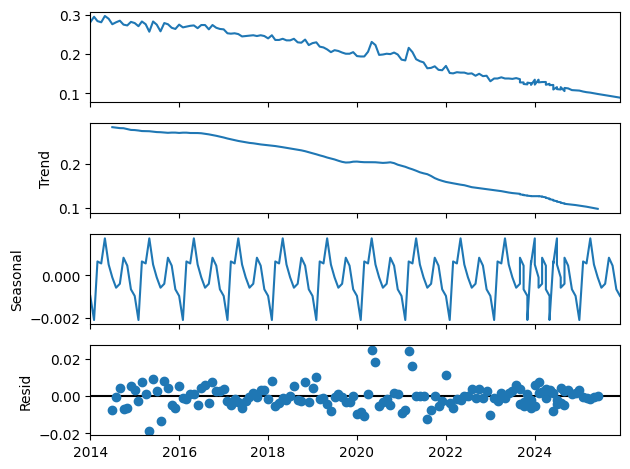

In [156]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [157]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-762.297, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-819.766, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-768.302, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-827.672, Time=0.68 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-849.979, Time=2.26 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-850.170, Time=0.75 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-848.274, Time=0.70 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.66 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.38 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-847.365, Time=2.29 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-882.394, Time=0.78 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-

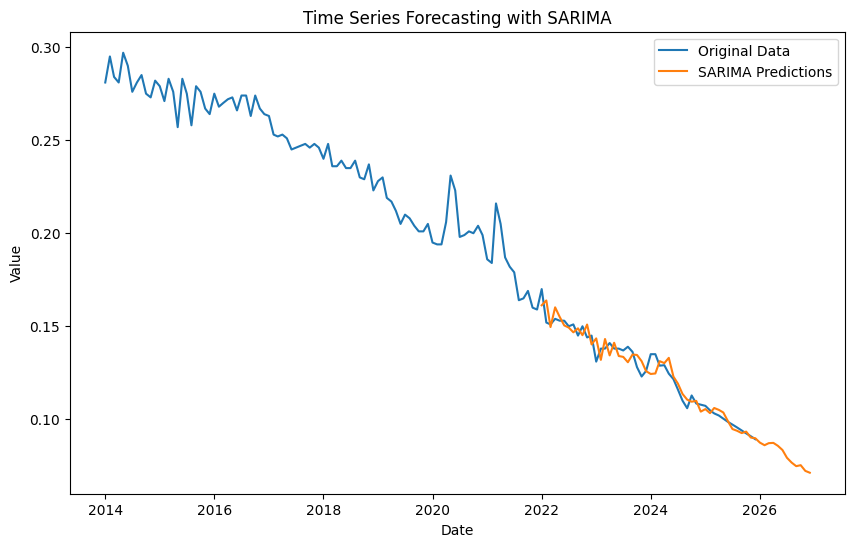

SARIMA - MSE: 2.705825386412689e-05, RMSE: 0.005201754883126164, MAPE: 3.17%


In [158]:
model_sarima(data_filtered,'Greece', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-941.290, Time=0.16 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-830.132, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-856.546, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-832.122, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-976.973, Time=0.51 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-934.934, Time=0.09 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-976.217, Time=0.64 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-980.537, Time=0.14 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-985.141, Time=0.30 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-979.541, Time=0.89 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-980.698, Time=0.43 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-989.547, Time=0.82 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=-

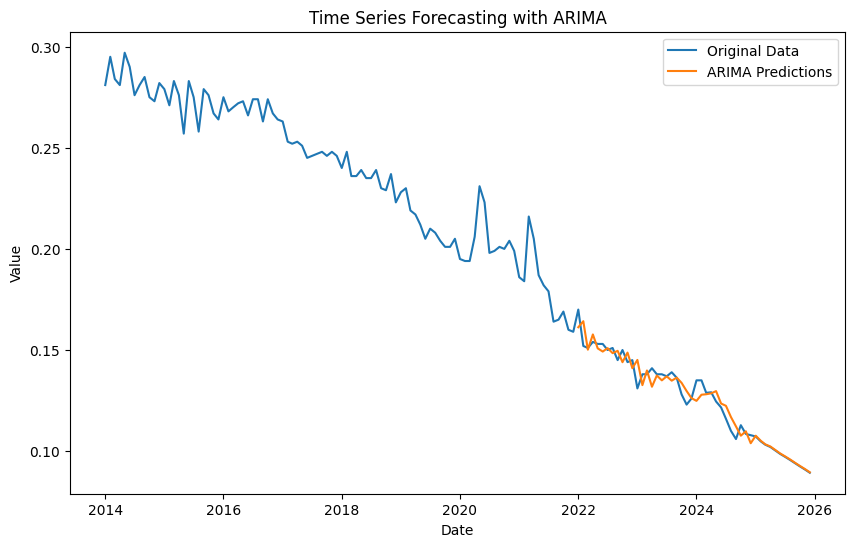

ARIMA - MSE: 3.222898953170743e-05, RMSE: 0.005677058175825525, MAPE: 3.11%


In [159]:
model_arima(data_filtered,'Greece', '25+', 'Female')

### 25+, Male

In [160]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Male')

In [161]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9932
Strong seasonality detected.


(0.9931951184883453, True)

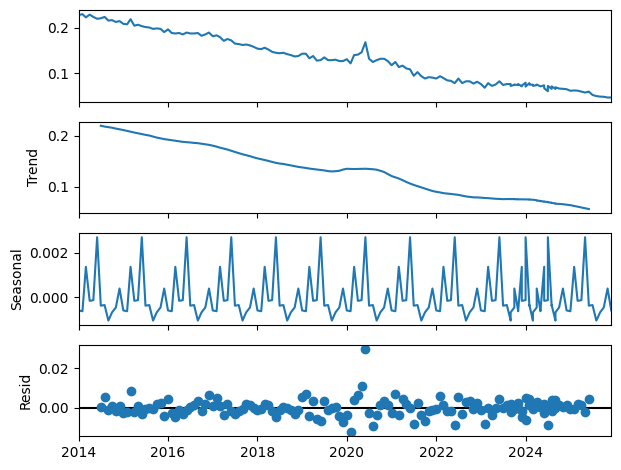

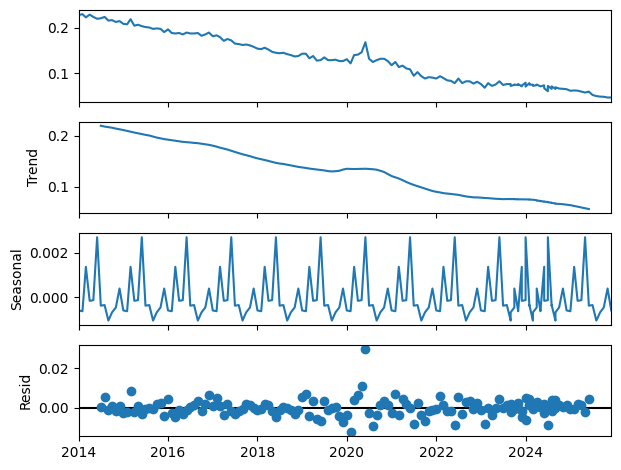

In [162]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [163]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-837.252, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-893.675, Time=0.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-857.572, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-935.827, Time=0.50 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-963.392, Time=2.35 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-951.422, Time=0.88 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-958.678, Time=2.94 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.94 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-945.943, Time=1.34 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-963.835, Time=2.06 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-954.721, Time=0.87 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-937.385, Time=0.84 sec
 ARIMA(2,1,0)(2,1,2)[12]          

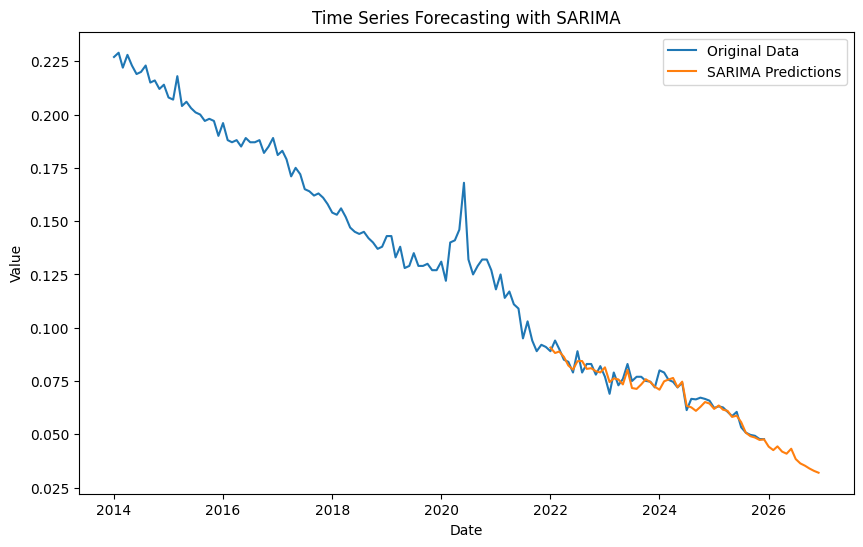

SARIMA - MSE: 9.14228732662833e-06, RMSE: 0.0030236215581035154, MAPE: 3.07%


In [164]:
model_sarima(data_filtered,'Greece', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1037.292, Time=0.29 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-892.010, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-962.733, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-894.010, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1049.741, Time=1.22 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1012.822, Time=0.24 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1036.932, Time=0.76 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1049.643, Time=0.19 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1029.954, Time=0.57 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1015.079, Time=0.08 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1052.359, Time=0.55 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1038.759, Time=0.49 sec
 ARIMA(3,2,2)(0,0,0)[0]           

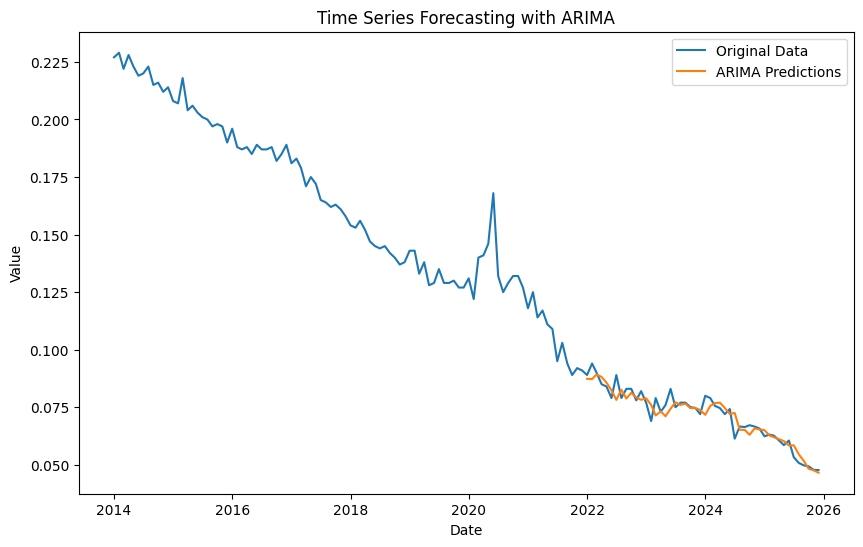

ARIMA - MSE: 1.856216745578915e-05, RMSE: 0.004308383392386192, MAPE: 4.11%


In [165]:
model_arima(data_filtered,'Greece', '25+', 'Male')

### 25+, Total

In [166]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Total')

In [167]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9945
Strong seasonality detected.


(0.9945131147442882, True)

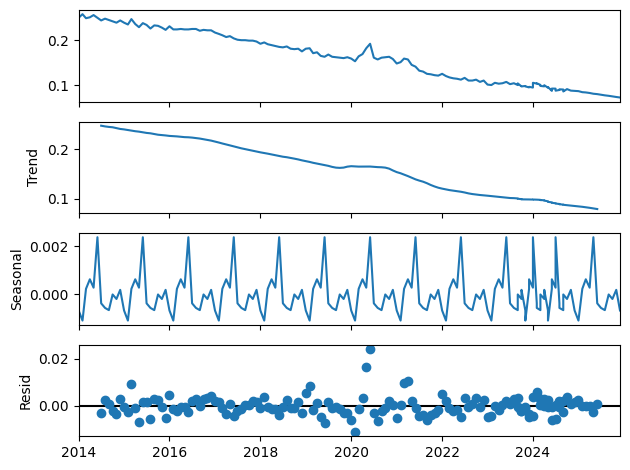

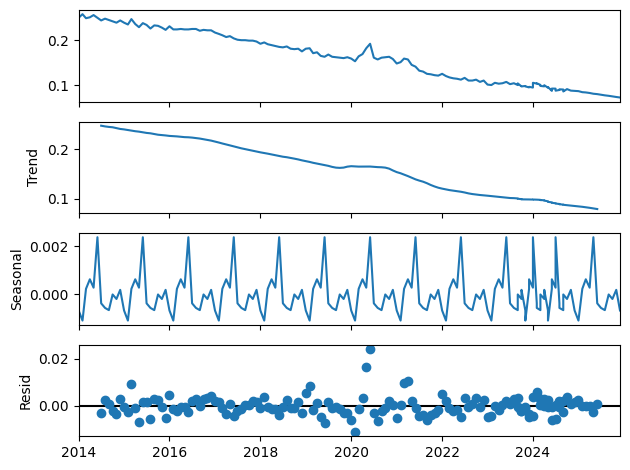

In [168]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [169]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-876.549, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-922.651, Time=0.34 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.27 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-879.853, Time=0.12 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-954.682, Time=0.20 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-954.741, Time=0.99 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.56 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-949.896, Time=0.92 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-959.066, Time=0.68 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-978.665, Time=1.31 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-973.320, Time=0.23 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-

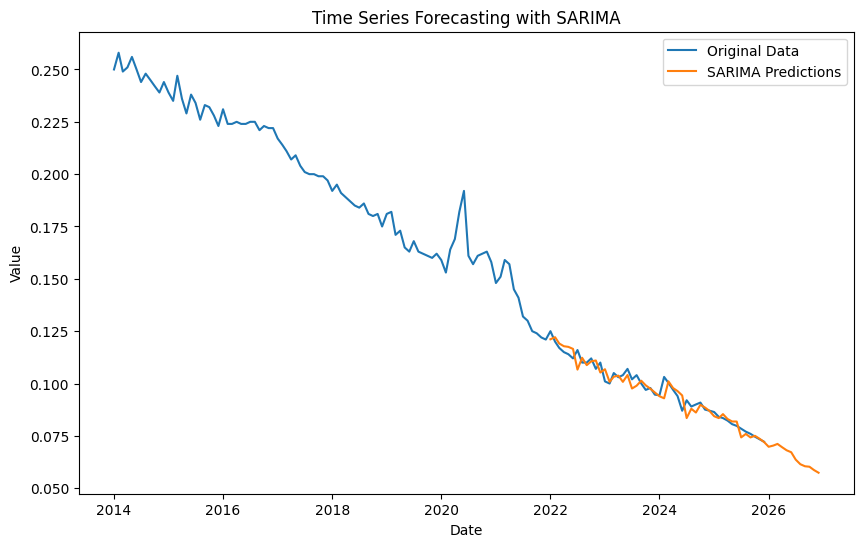

SARIMA - MSE: 1.2504124706484552e-05, RMSE: 0.0035361171794051948, MAPE: 2.63%


In [170]:
model_sarima(data_filtered,'Greece', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1059.118, Time=0.22 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-965.523, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-997.115, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1055.211, Time=0.46 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-967.514, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1078.713, Time=0.63 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1044.472, Time=0.27 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1066.542, Time=0.42 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1068.698, Time=0.68 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1044.910, Time=0.29 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1084.013, Time=0.73 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-1074.715, Time=0.47 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1088.468, Time=0.38 sec
 ARIMA(1,2,3)(0,0,0)[0] inte

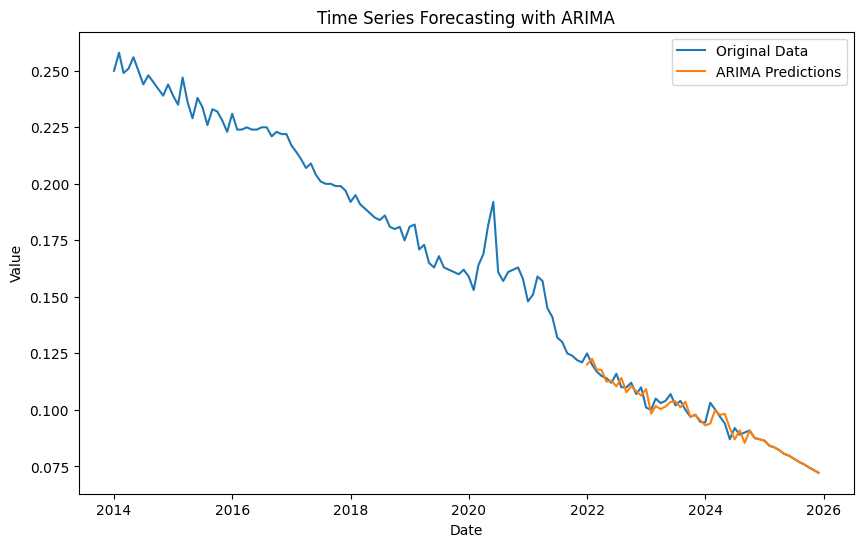

ARIMA - MSE: 1.2495844502635645e-05, RMSE: 0.0035349461810097824, MAPE: 2.66%


In [171]:
model_arima(data_filtered,'Greece', '25+', 'Total')

# Spain

### 15-24, Female

In [172]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Female')

In [173]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9770
Strong seasonality detected.


(0.9769691054278862, True)

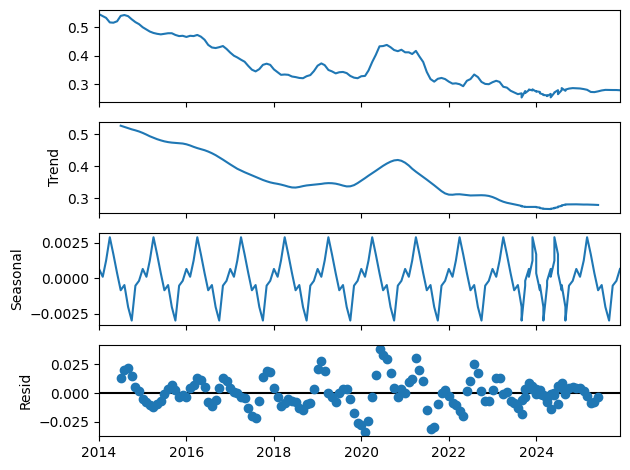

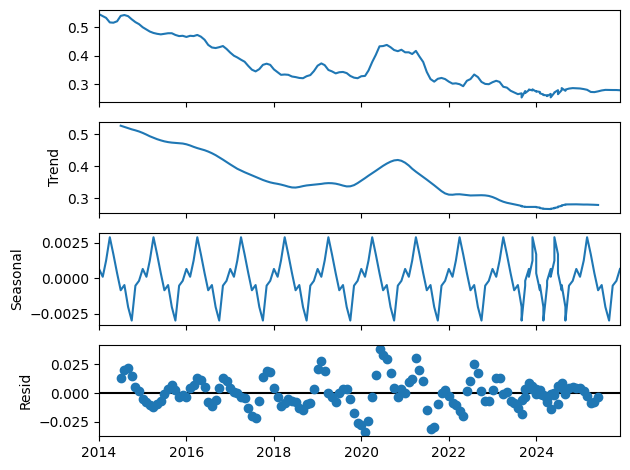

In [174]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [175]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-724.020, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-814.963, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-784.497, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-824.769, Time=0.36 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.23 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-774.979, Time=0.77 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-824.503, Time=0.71 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-823.548, Time=1.00 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-809.643, Time=0.89 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-820.780, Time=1.55 sec
 ARIMA(1,1,0)(2,1,0)[12] intercept   : AIC=-822.854, Time=0.56 sec

Best model:  ARIMA(1,1,0)(2,1,0)[12]  

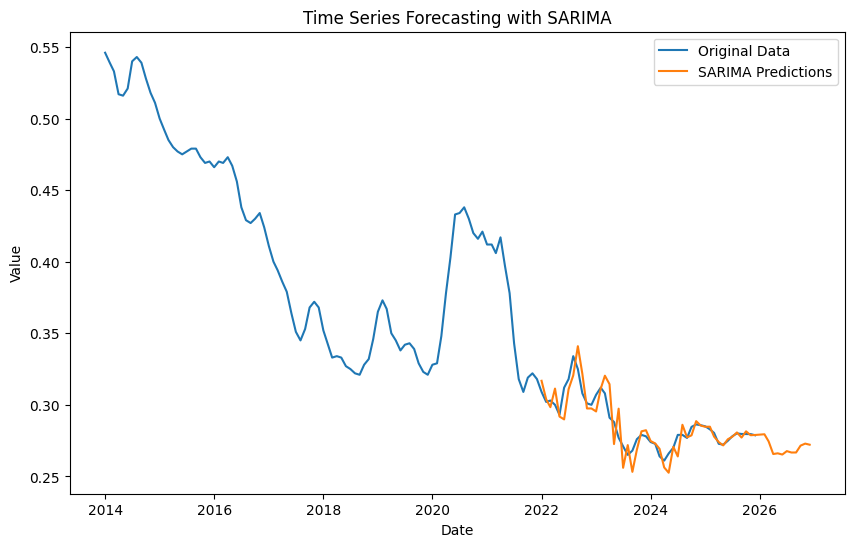

SARIMA - MSE: 8.395331236919753e-05, RMSE: 0.00916260401682827, MAPE: 2.22%


In [176]:
model_sarima(data_filtered,'Spain', '15-24', 'Female')

### 15-24, Male

In [177]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Male')

In [178]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9913
Strong seasonality detected.


(0.991312427144293, True)

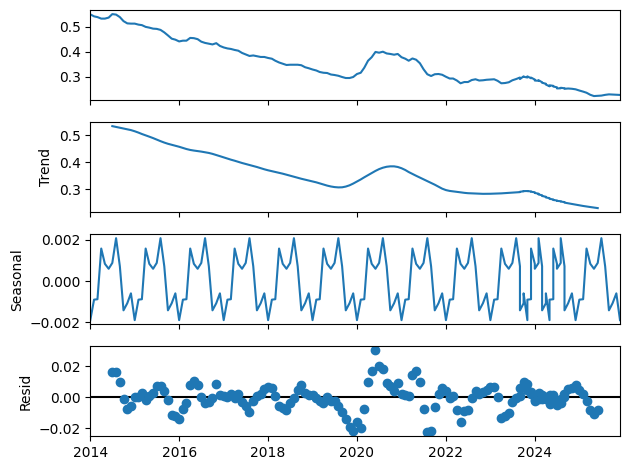

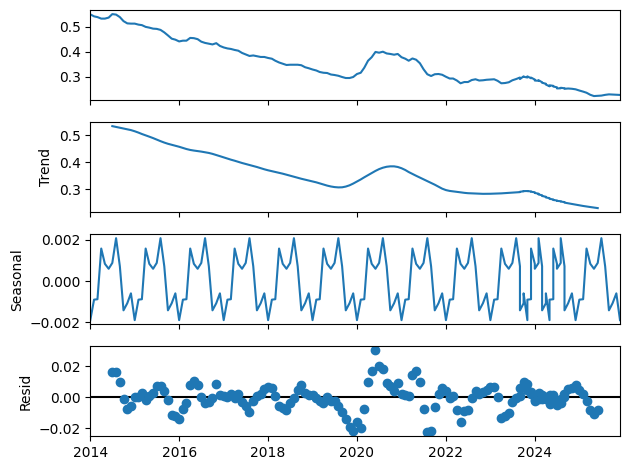

In [179]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [180]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-925.572, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-827.369, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-903.403, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-872.510, Time=0.05 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-928.502, Time=0.44 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-900.429, Time=0.47 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-924.015, Time=1.89 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2.60 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-930.333, Time=1.39 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-928.244, Time=0.36 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-930.349, Time=2.51 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-934.544, Time=1.01 sec
 ARIMA(2,1,1)(0,1,0)[12]          

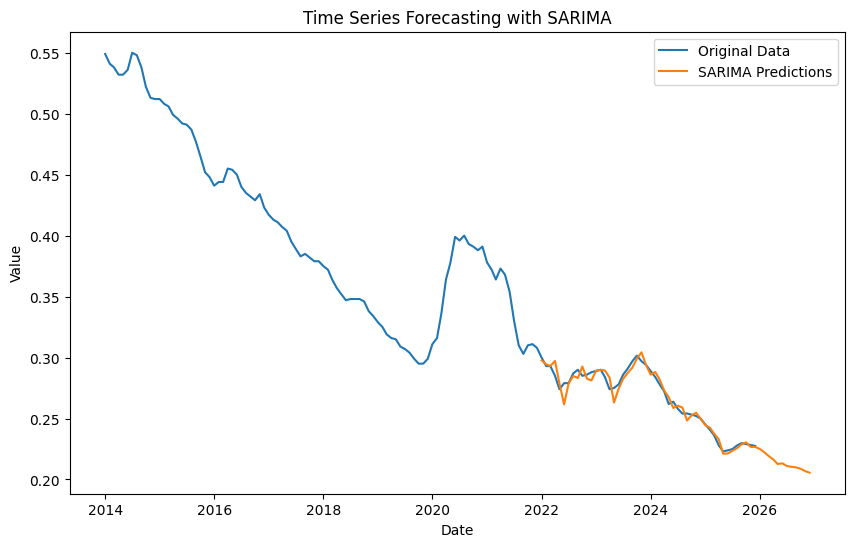

SARIMA - MSE: 2.6272748262399197e-05, RMSE: 0.005125694905317639, MAPE: 1.37%


In [181]:
model_sarima(data_filtered,'Spain', '15-24', 'Male')

### 15-24, Total

In [182]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Total')

In [183]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9886
Strong seasonality detected.


(0.9885697488995149, True)

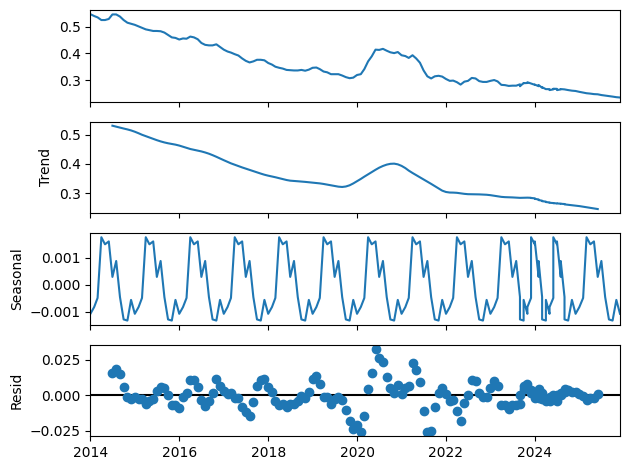

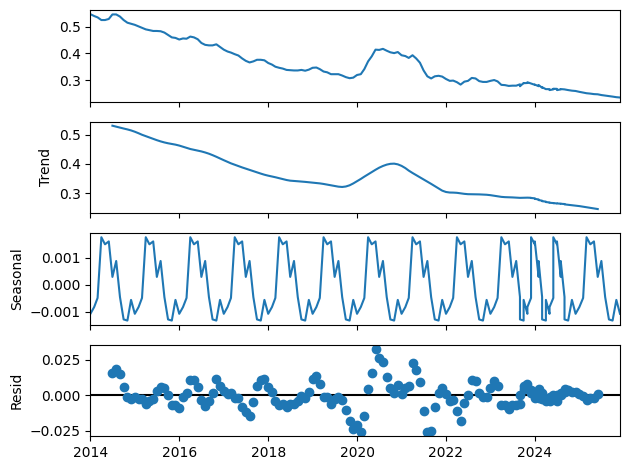

In [184]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [185]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-912.171, Time=1.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-798.260, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-875.934, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-850.791, Time=0.17 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-875.182, Time=1.01 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-907.398, Time=0.88 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-909.984, Time=0.72 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-930.822, Time=1.17 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-870.117, Time=0.50 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=i

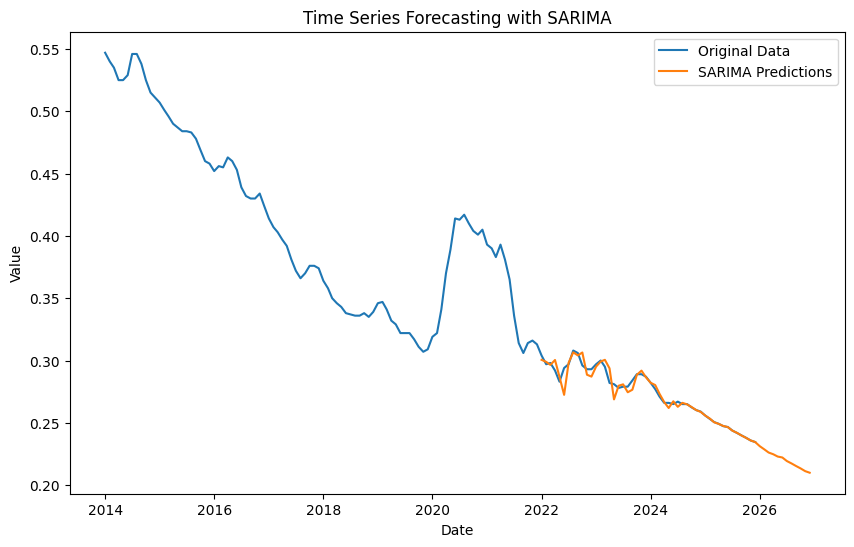

SARIMA - MSE: 2.5160772575388073e-05, RMSE: 0.005016051492497667, MAPE: 1.00%


In [186]:
model_sarima(data_filtered,'Spain', '15-24', 'Total')

### 25+, Male

In [187]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Male')

In [188]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9955
Strong seasonality detected.


(0.9954500708495305, True)

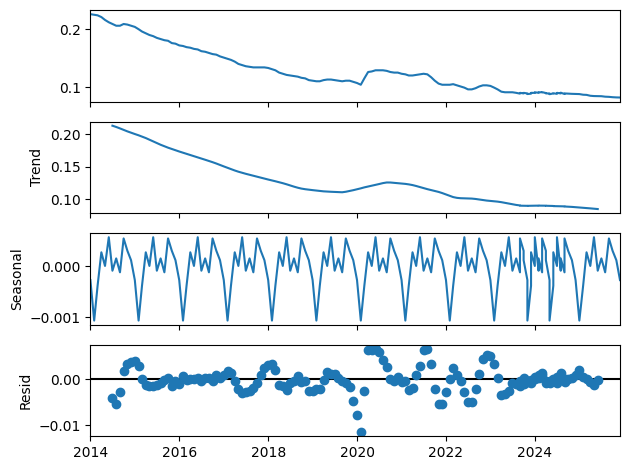

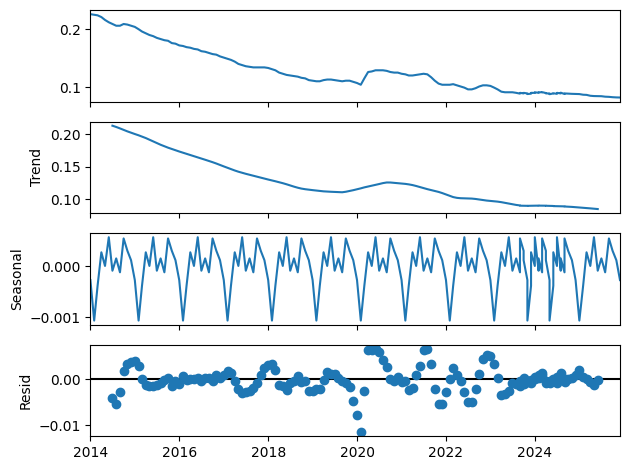

In [189]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [190]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1241.624, Time=0.68 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1152.970, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1219.313, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1238.512, Time=0.27 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1189.208, Time=0.12 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1230.731, Time=0.38 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1185.208, Time=0.45 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1221.251, Time=0.30 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.21 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1240.249, Time=0.17 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1238.416, Time=0.39 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1239.961, Time=0.55 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1196.087, Time=0.20 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1241.286, Time=0.31 sec
 ARIMA(2,1,

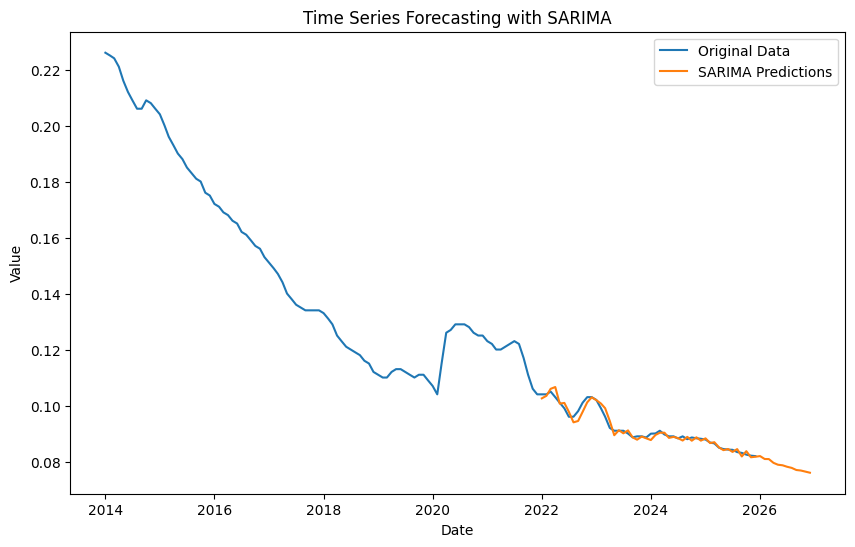

SARIMA - MSE: 1.9947516622632355e-06, RMSE: 0.0014123567758407348, MAPE: 1.12%


In [191]:
model_sarima(data_filtered,'Spain', '25+', 'Male')

### 25+, Female

In [192]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Female')

In [193]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9967
Strong seasonality detected.


(0.996709556332057, True)

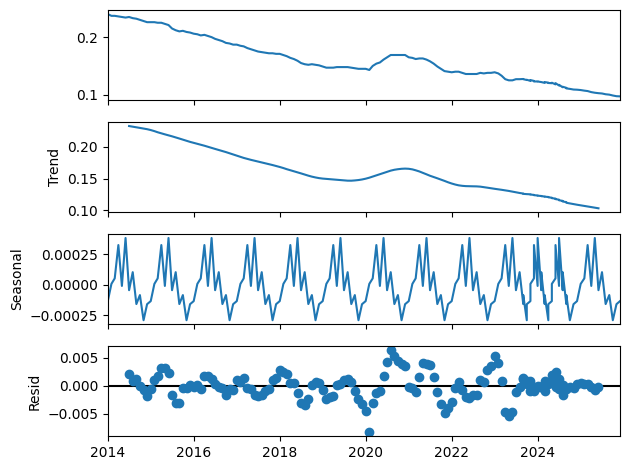

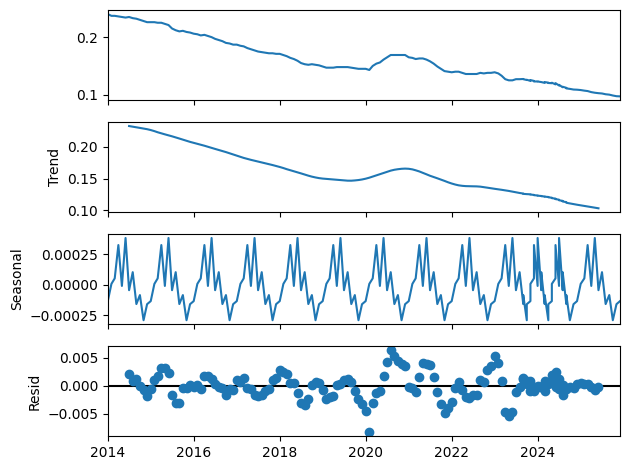

In [194]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [195]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1269.613, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1173.664, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1244.995, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1245.472, Time=0.69 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1216.522, Time=0.29 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1253.019, Time=0.52 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1212.522, Time=0.65 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1245.464, Time=0.76 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1269.027, Time=0.52 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=inf, Time=2.01 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1271.864, Time=0.80 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1220.912, Time=0.21 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1259.580, Time=1.67 sec
 ARIMA(1,1,2)(0,1

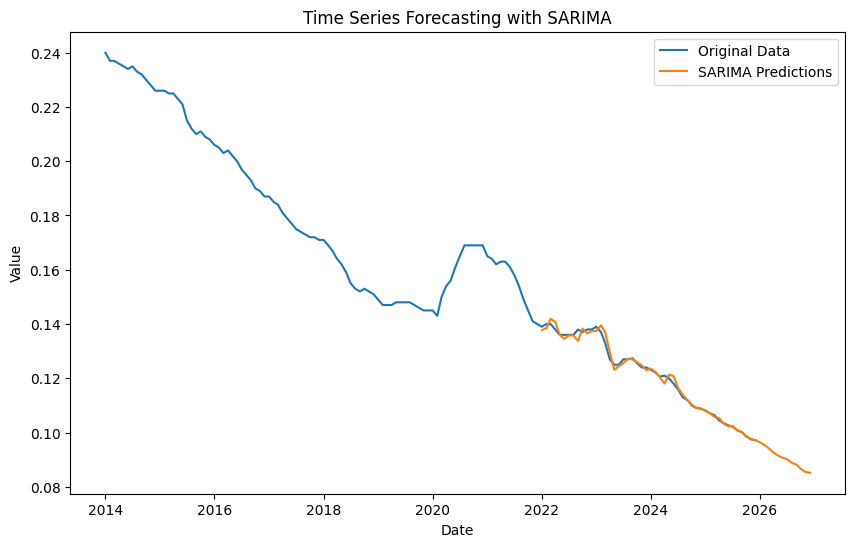

SARIMA - MSE: 2.0704601897727742e-06, RMSE: 0.00143890937510768, MAPE: 0.76%


In [196]:
model_sarima(data_filtered,'Spain', '25+', 'Female')

 ### 25+, Total

In [197]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Total')

In [198]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9968
Strong seasonality detected.


(0.9967821466559696, True)

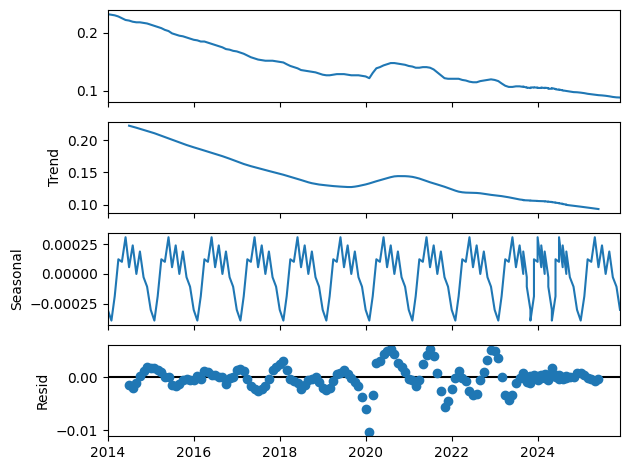

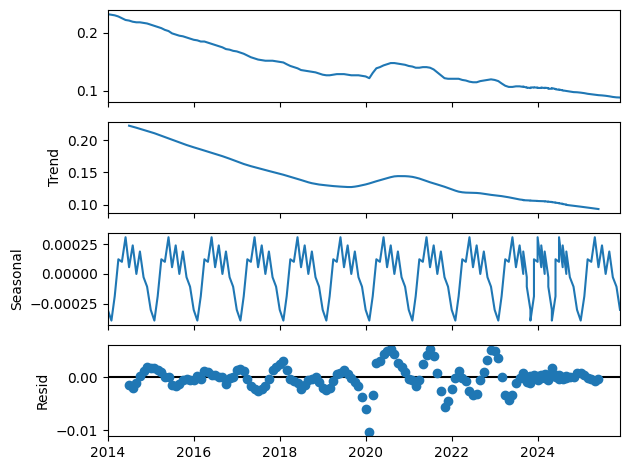

In [199]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [200]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1295.364, Time=1.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1196.031, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1273.411, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1285.316, Time=0.65 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1241.277, Time=0.25 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1283.512, Time=0.82 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1271.740, Time=0.14 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.35 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1297.071, Time=0.26 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1243.198, Time=0.16 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1285.098, Time=0.25 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,1,1)[12]     

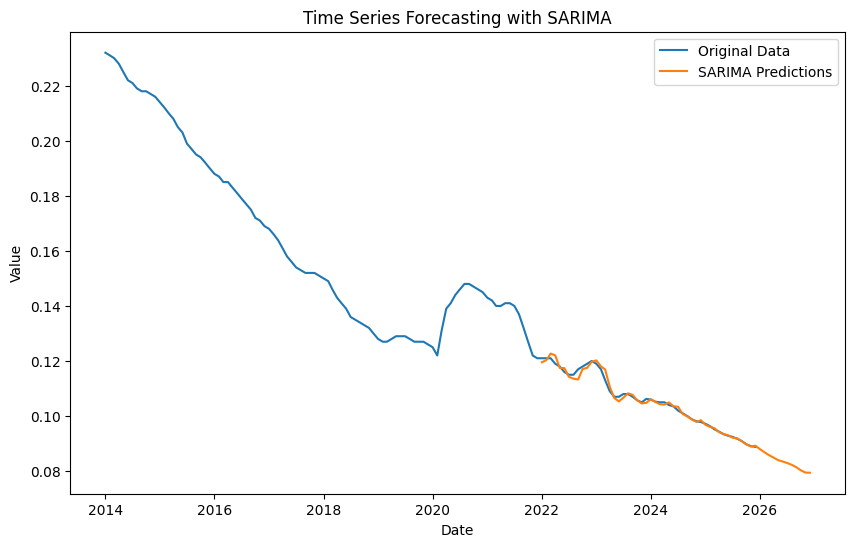

SARIMA - MSE: 1.4580783545123318e-06, RMSE: 0.0012075091529724865, MAPE: 0.74%


In [201]:
model_sarima(data_filtered,'Spain', '25+', 'Total')

# Slovenia

### 15-24, Male

In [202]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Male')

In [203]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9004
Strong seasonality detected.


(0.9003662293475929, True)

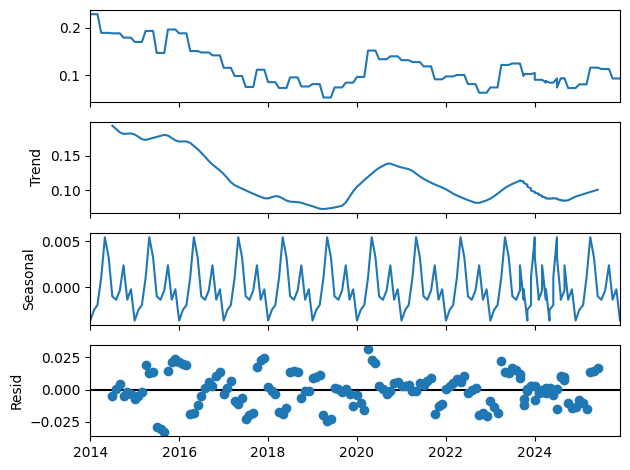

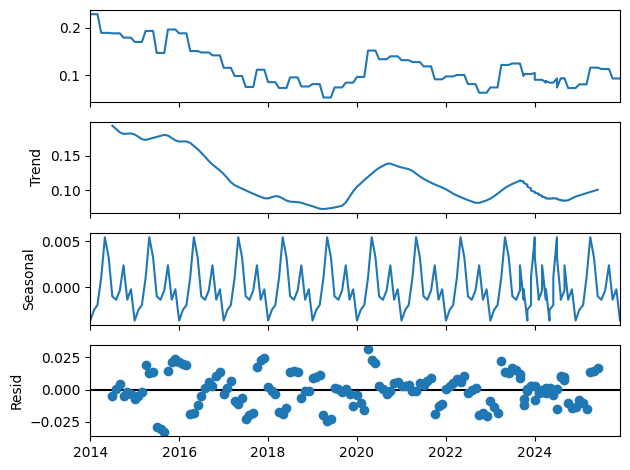

In [204]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [205]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-727.565, Time=0.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-658.876, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-732.451, Time=0.44 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-729.526, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-656.877, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-746.163, Time=0.45 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-751.462, Time=1.50 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-744.377, Time=1.22 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-749.358, Time=1.39 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-742.538, Time=0.94 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-753.365, Time=0.38 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-746.375, Time=0.94 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-748.163, Time=0.28 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-751.631, Time=1.43 sec
 ARIMA(0,1,0)(1,1,0

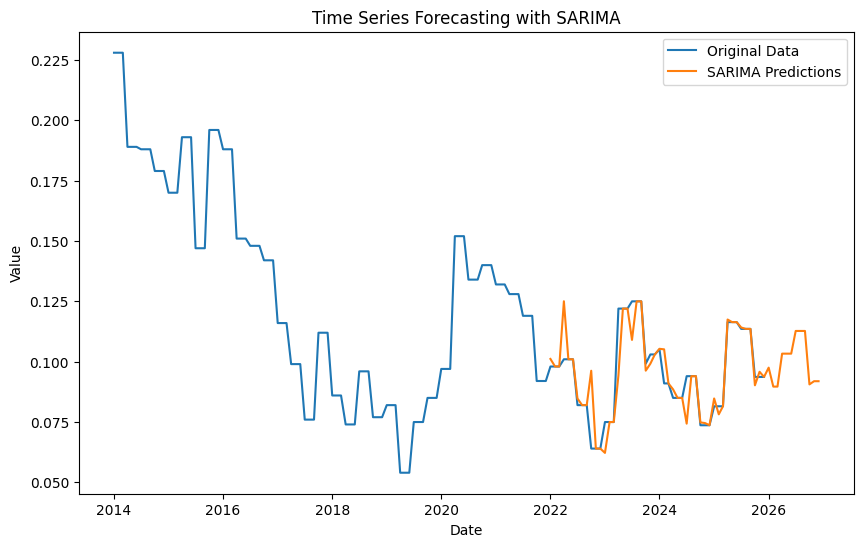

SARIMA - MSE: 7.266164091563892e-05, RMSE: 0.008524179779640909, MAPE: 4.15%


In [206]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Male')

### 15-24, Female

In [207]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Female')

In [208]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8390
Strong seasonality detected.


(0.8389930743669242, True)

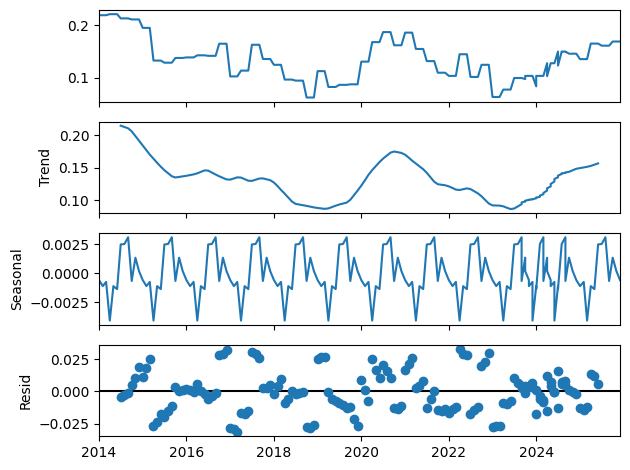

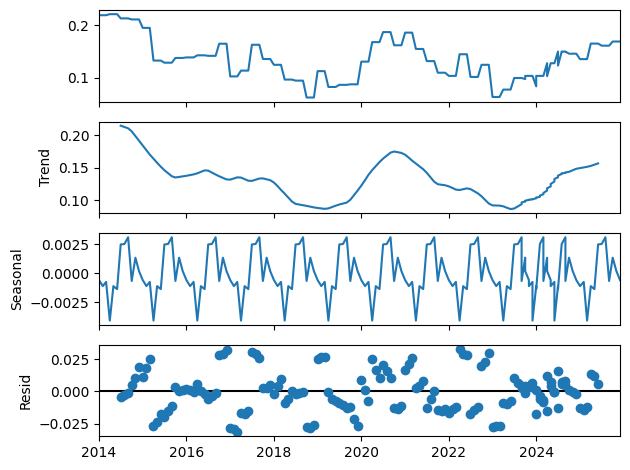

In [209]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [210]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-669.676, Time=1.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-627.883, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-643.611, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-671.289, Time=0.37 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-625.891, Time=0.05 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-672.639, Time=0.59 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.25 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.47 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-670.638, Time=0.70 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-670.692, Time=1.01 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.35 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=inf, Time=1.70 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-671.329, Time=0.98 sec

Best model:  ARIMA(0,1,1)(0,1,2)[12]       

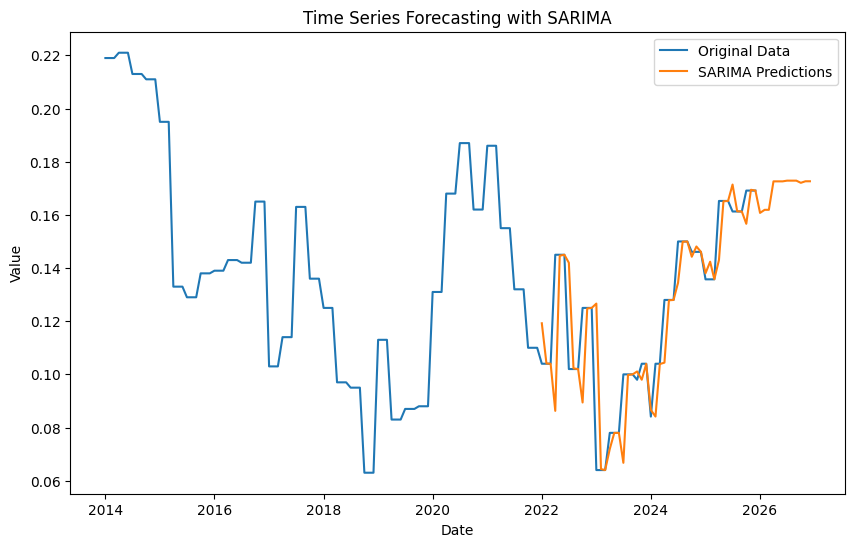

SARIMA - MSE: 0.0002847196832488754, RMSE: 0.016873638708022505, MAPE: 7.50%


In [211]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Female')

### 15-24, Total

In [212]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Total')

In [213]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9190
Strong seasonality detected.


(0.9189832283701574, True)

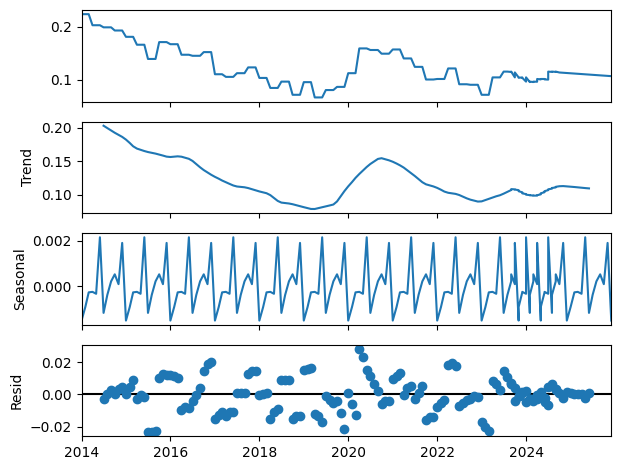

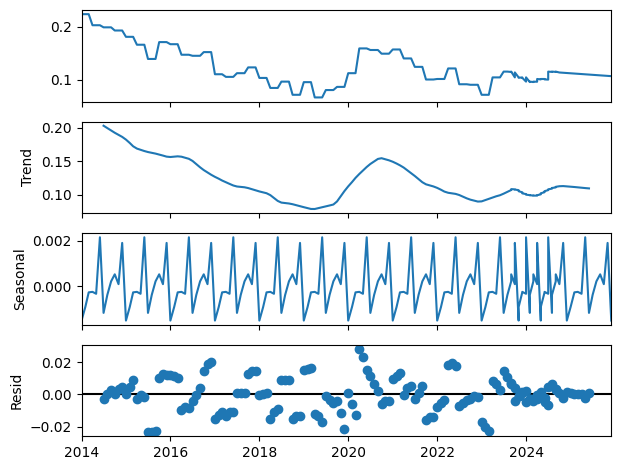

In [214]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [215]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-779.926, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-734.881, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-760.898, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-781.951, Time=1.17 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-732.898, Time=0.33 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-780.676, Time=1.51 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-780.844, Time=2.19 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-760.899, Time=0.12 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-779.136, Time=1.42 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-783.954, Time=0.74 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-782.947, Time=0.92 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-782.828, Time=1.73 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-762.934, Time=1.70 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-781.162, Time=4.20 sec
 ARIMA(1,1,0)(0,1,1

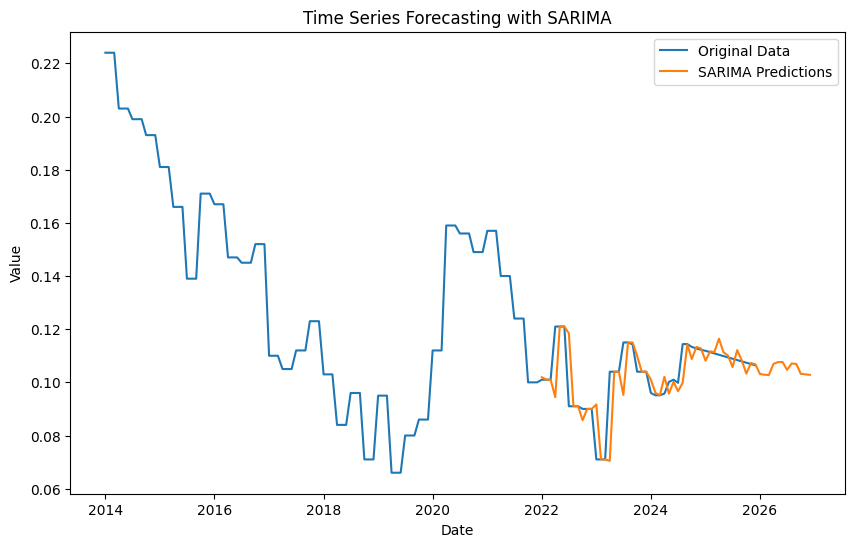

SARIMA - MSE: 8.087629046115502e-05, RMSE: 0.008993124621684891, MAPE: 4.26%


In [216]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-880.129, Time=0.95 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-788.873, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-827.317, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-790.873, Time=0.06 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-861.729, Time=0.33 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-877.545, Time=0.80 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-879.324, Time=0.54 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-837.096, Time=0.19 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-873.738, Time=0.70 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec

Best model:  ARIMA(1,2,1)(0,0,0)[0] intercept
Total fit time: 4.477 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Model:

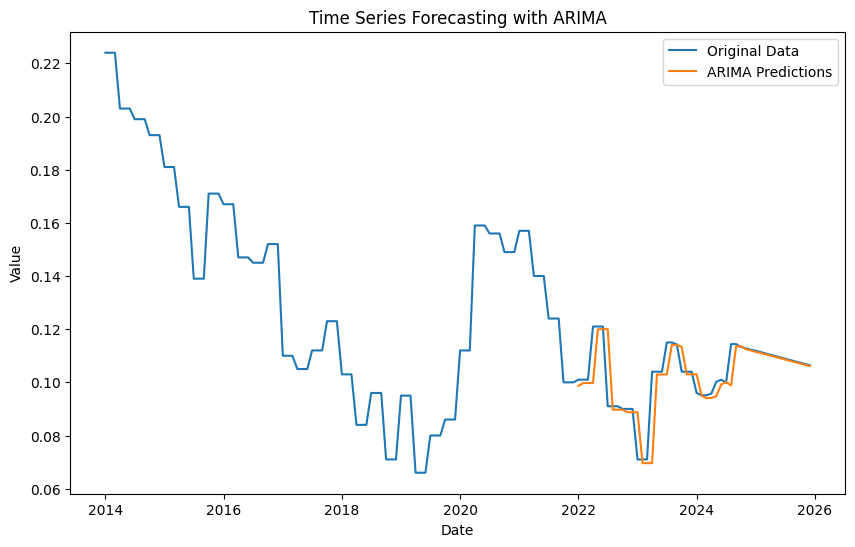

ARIMA - MSE: 0.00010449188824865522, RMSE: 0.01022212738370322, MAPE: 5.52%


In [217]:
model_arima(data_filtered,'Slovenia', '15-24', 'Total')

### 25+, Male

In [218]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Male')

In [219]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9723
Strong seasonality detected.


(0.9722542788642358, True)

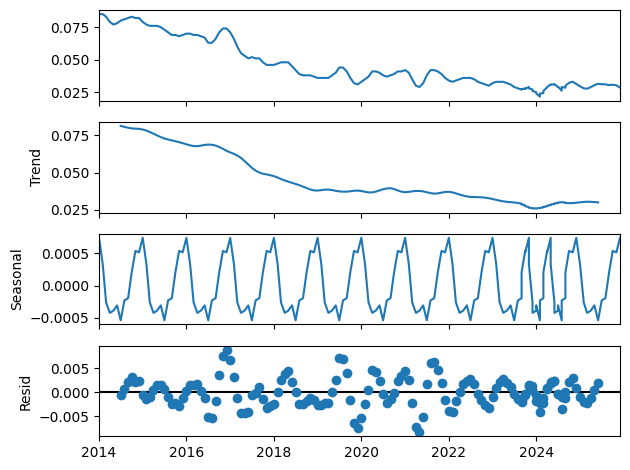

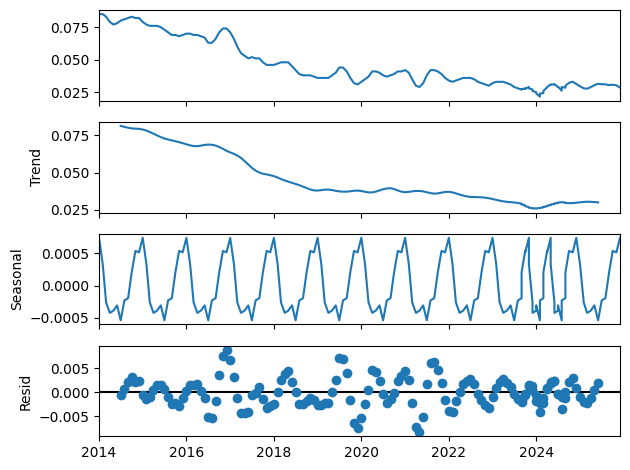

In [220]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [221]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1263.720, Time=1.11 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1117.966, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1253.421, Time=0.45 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1238.182, Time=0.22 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1197.779, Time=0.22 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1260.177, Time=0.50 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1262.319, Time=1.01 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1262.375, Time=0.13 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1246.777, Time=1.79 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1250.774, Time=0.44 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1295.793, Time=0.94 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1245.263, Time=0.26 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1281.909, Time=0.98 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1294.842, Time=0.84 sec
 ARIM

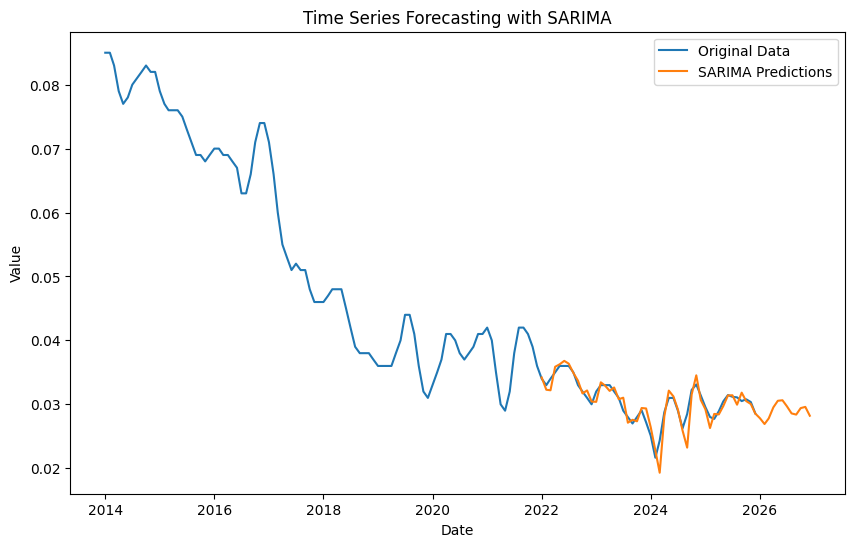

SARIMA - MSE: 1.8951497192896346e-06, RMSE: 0.0013766443692143713, MAPE: 3.15%


In [222]:
model_sarima(data_filtered,'Slovenia', '25+', 'Male')

### 25+, Female

In [223]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Female')

In [224]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9862
Strong seasonality detected.


(0.9862148535102532, True)

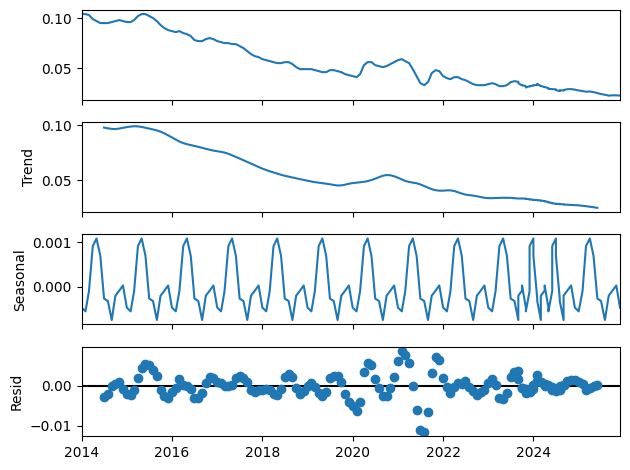

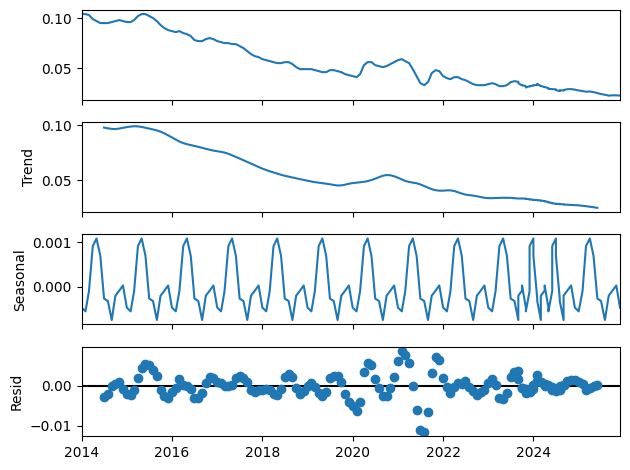

In [225]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [226]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1262.399, Time=0.76 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1123.519, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1217.809, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1213.472, Time=0.96 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1203.989, Time=0.07 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1243.905, Time=0.76 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1199.989, Time=0.58 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1229.255, Time=0.41 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1224.464, Time=0.63 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1252.277, Time=0.65 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1278.988, Time=0.45 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1226.135, Time=0.65 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1260.412, Time=1.06 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1222.135, Time=1.00 sec
 ARIM

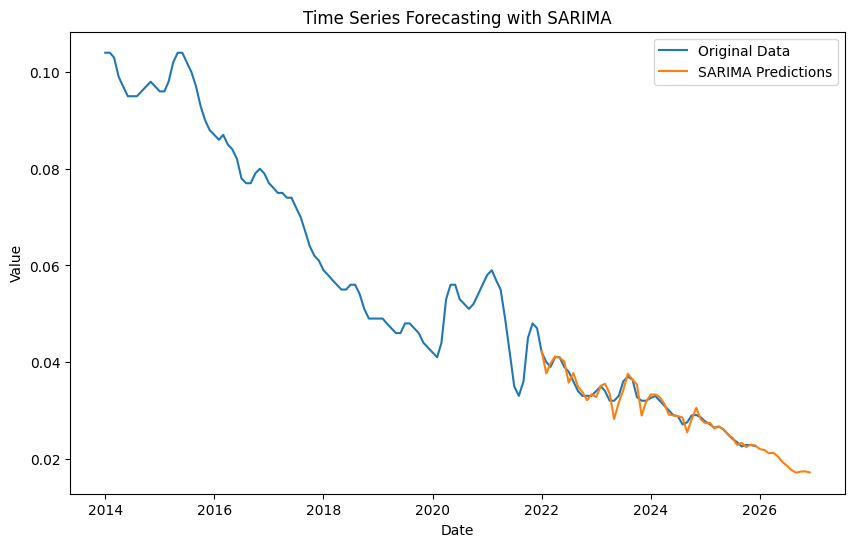

SARIMA - MSE: 1.511629949524435e-06, RMSE: 0.001229483610921445, MAPE: 2.70%


In [227]:
model_sarima(data_filtered,'Slovenia', '25+', 'Female')

### 25+, Total

In [228]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Total')

In [229]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9890
Strong seasonality detected.


(0.988961439666621, True)

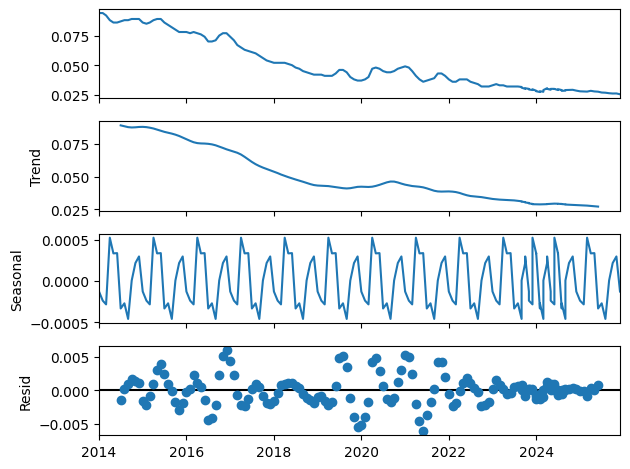

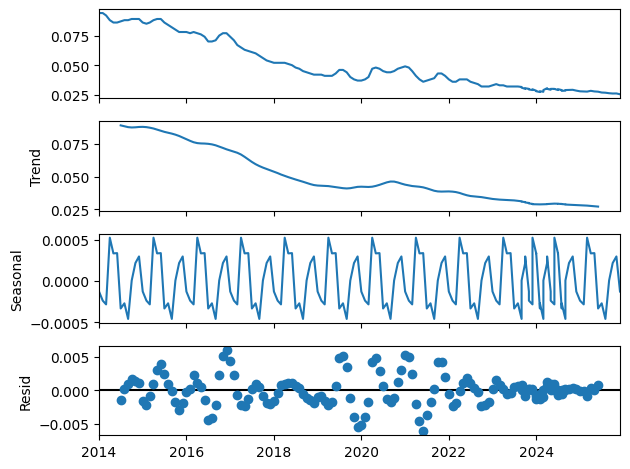

In [230]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [231]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1308.696, Time=0.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1178.264, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1296.626, Time=0.63 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1301.109, Time=0.36 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1233.572, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1299.043, Time=0.58 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1229.571, Time=0.42 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1298.456, Time=0.55 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1294.192, Time=0.96 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1306.242, Time=0.29 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1219.552, Time=0.93 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1298.817, Time=0.48 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1255.595, Time=0.35 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1315.184, Time=0.44 sec
 ARIM

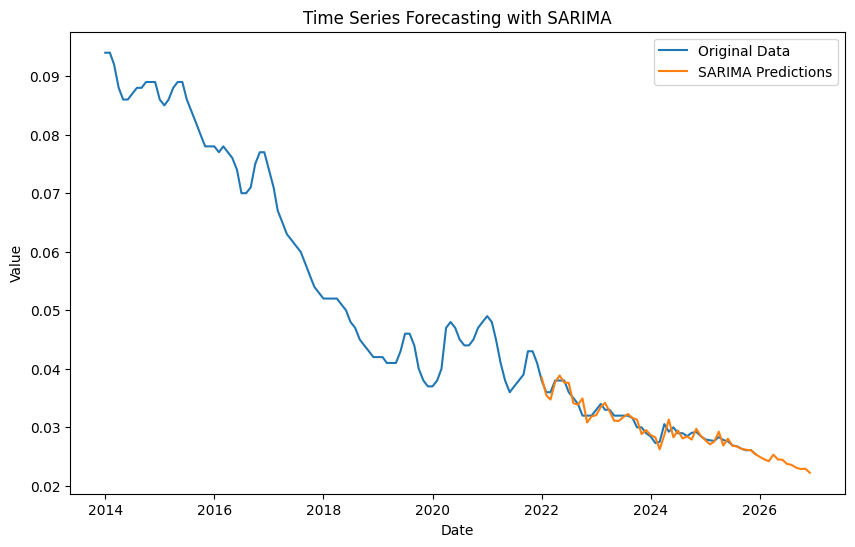

SARIMA - MSE: 8.832125209135096e-07, RMSE: 0.0009397938715024213, MAPE: 2.25%


In [232]:
model_sarima(data_filtered,'Slovenia', '25+', 'Total')

# Norway

## 15-24, Male

In [233]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Male')

In [234]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.5059
Weak or no seasonality detected.


(0.505925610216281, False)

In [235]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-581.170, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-643.698, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-605.419, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-653.690, Time=0.49 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-619.920, Time=0.63 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-692.282, Time=1.39 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-682.662, Time=1.24 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-691.945, Time=2.03 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-694.2

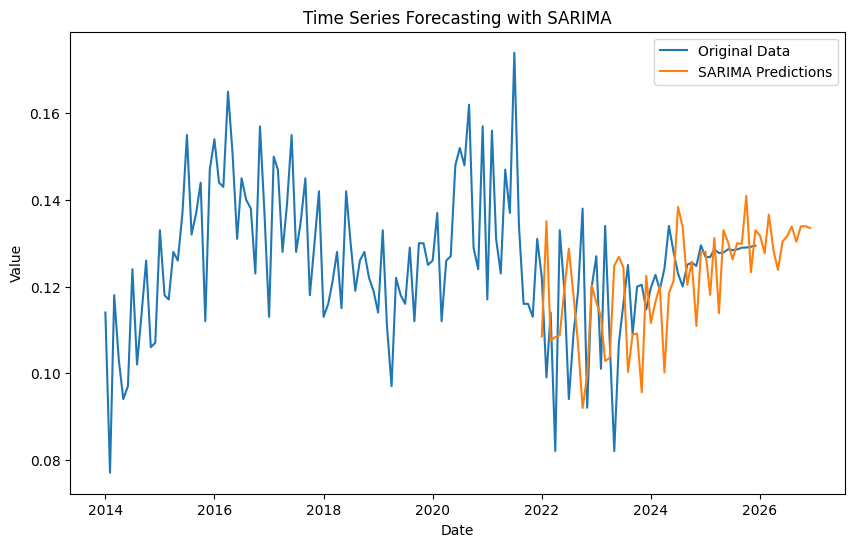

SARIMA - MSE: 0.0002811918341977398, RMSE: 0.016768775572406584, MAPE: 10.78%


In [236]:
model_sarima(data_filtered,'Norway', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-575.978, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-640.233, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-577.968, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-719.404, Time=0.40 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-737.570, Time=0.18 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-781.319, Time=0.45 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-783.814, Time=0.32 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-775.732, Time=0.73 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-713.018, Time=0.41 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-787.280, Time=0.45 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-784.233, Time=0.85 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-794.869, Time=0.42 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-

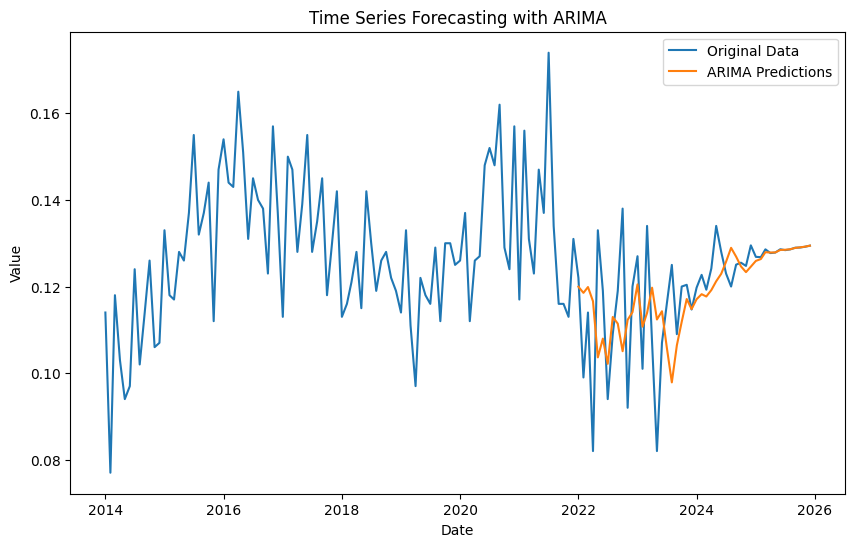

ARIMA - MSE: 0.0002372643748696817, RMSE: 0.015403388421697407, MAPE: 10.74%


In [237]:
model_arima(data_filtered,'Norway', '15-24', 'Male')

## 15-24, Female

In [238]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Female')

In [239]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4606
Weak or no seasonality detected.


(0.4606413697949402, False)

In [240]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-570.281, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-634.705, Time=0.49 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-608.364, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-647.111, Time=0.75 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-614.940, Time=0.82 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-669.158, Time=0.66 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-655.157, Time=0.41 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.61 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-667.806, Time=0.83 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-667.8

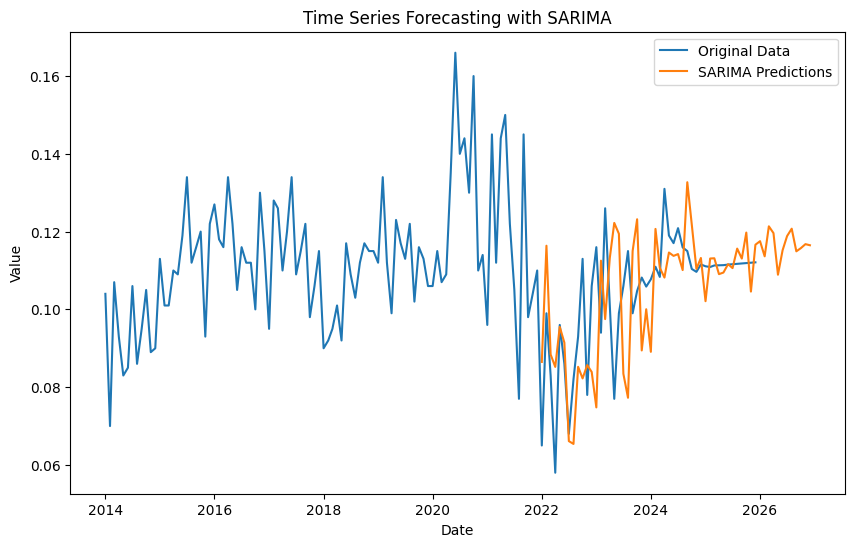

SARIMA - MSE: 0.0002822903374608263, RMSE: 0.016801498071922823, MAPE: 12.70%


In [241]:
model_sarima(data_filtered,'Norway', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-715.691, Time=0.43 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-568.372, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-639.698, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-714.568, Time=0.34 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-570.365, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-776.194, Time=0.20 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-703.525, Time=0.46 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-765.591, Time=0.37 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-762.257, Time=0.17 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-757.158, Time=0.13 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-730.390, Time=0.14 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-769.338, Time=0.49 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.33 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 3.233 seconds
                           

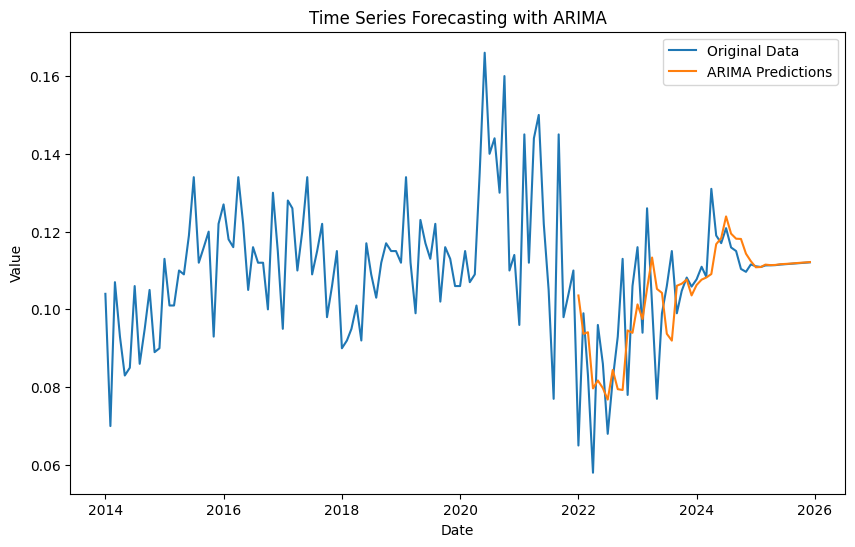

ARIMA - MSE: 0.00023503637704085027, RMSE: 0.015330896159091624, MAPE: 12.83%


In [242]:
model_arima(data_filtered,'Norway', '15-24', 'Female')

## 15-24,Total

In [243]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Total')

In [244]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.5205
Weak or no seasonality detected.


(0.520518021003052, False)

In [245]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-606.131, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-670.372, Time=0.57 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-639.354, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-679.992, Time=0.46 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.72 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-642.325, Time=0.25 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-715.452, Time=0.88 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-705.054, Time=0.20 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.19 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-714.490, Time=0.78 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-714.3

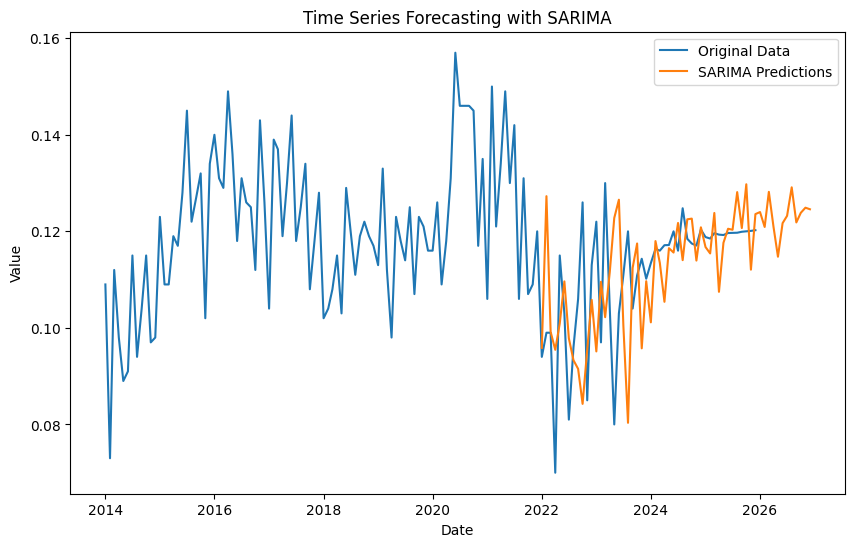

SARIMA - MSE: 0.00023483859535788999, RMSE: 0.01532444437354549, MAPE: 10.14%


In [246]:
model_sarima(data_filtered,'Norway', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-753.683, Time=0.23 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-595.496, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-666.227, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-597.485, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-810.277, Time=0.10 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-747.281, Time=0.42 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-813.827, Time=0.51 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-780.633, Time=0.35 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-815.038, Time=0.74 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-810.860, Time=0.46 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-810.477, Time=0.35 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-819.310, Time=0.40 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-792.863, Time=0.74 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : 

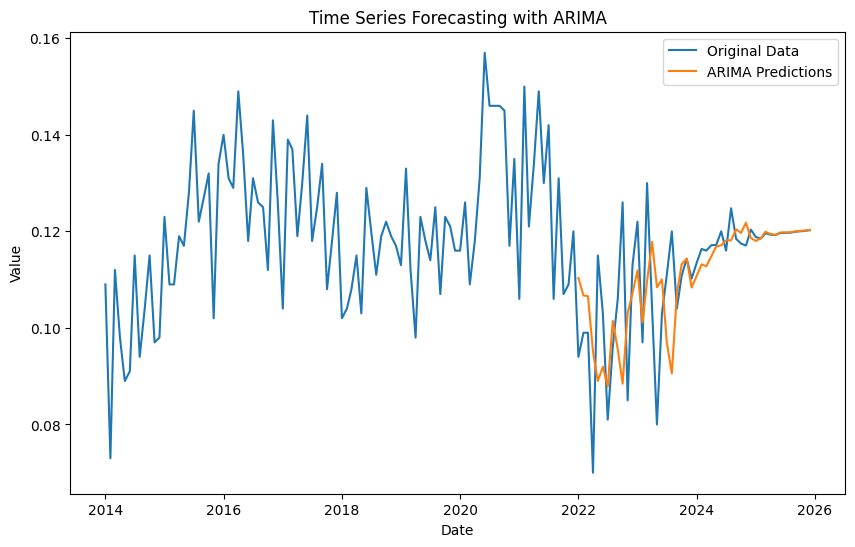

ARIMA - MSE: 0.0002156228809997771, RMSE: 0.01468410300290001, MAPE: 10.75%


In [247]:
model_arima(data_filtered,'Norway', '15-24', 'Total')

## 25+, Female

In [248]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Female')

In [249]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6974
Weak or no seasonality detected.


(0.6974067207939215, False)

In [250]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1086.985, Time=0.88 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-993.019, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1046.294, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.00 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1017.946, Time=0.10 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1090.672, Time=1.30 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1048.362, Time=0.08 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1067.132, Time=0.83 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1072.875, Time=0.25 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1084.272, Time=1.02 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-1068.006, Time=0.81 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=inf, Time=2.81 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1091.581, Time=1.53 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1057.123, Time=0.21 sec
 ARIMA(0,1,1)(2,1,

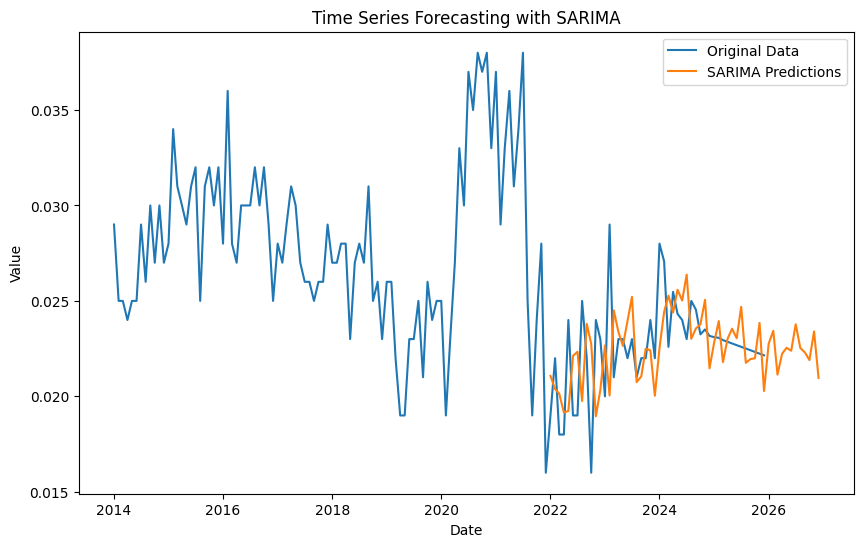

SARIMA - MSE: 7.613746314542225e-06, RMSE: 0.002759301780259315, MAPE: 9.28%


In [251]:
model_sarima(data_filtered,'Norway', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1160.140, Time=0.47 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1039.485, Time=0.10 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1100.348, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1041.482, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1198.239, Time=0.26 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1157.383, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1196.276, Time=0.29 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1202.579, Time=0.48 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1205.756, Time=0.39 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-1208.675, Time=0.38 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1193.626, Time=0.54 sec
 ARIMA(3,2,3)(0,0,0)[0]             : AIC=-1210.966, Time=0.44 sec
 ARIMA(2,2,3)(0,0,0)[0]        

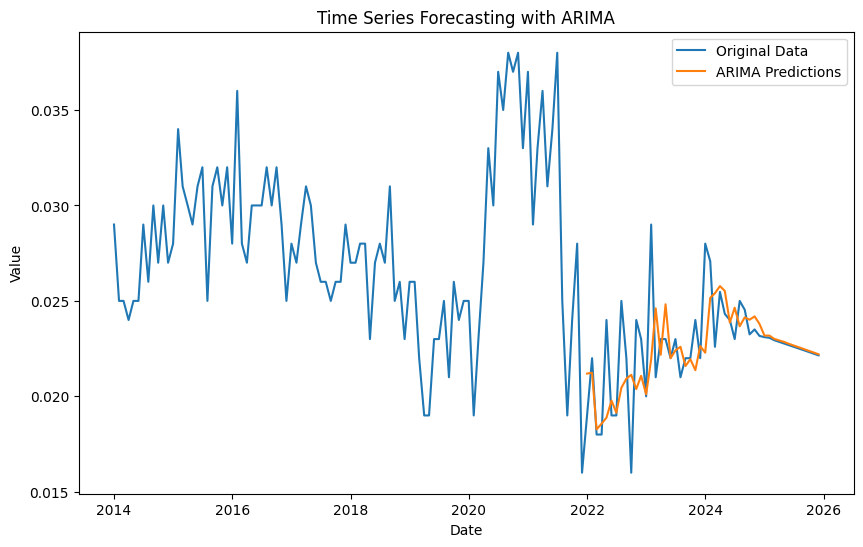

ARIMA - MSE: 7.3535341667001376e-06, RMSE: 0.0027117400625244555, MAPE: 8.36%


In [252]:
model_arima(data_filtered,'Norway', '25+', 'Female')

## 25+, Male

In [253]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Male')

In [254]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7631
Strong seasonality detected.


(0.7630595308149105, True)

In [255]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1016.009, Time=1.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-928.341, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-970.206, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1006.055, Time=0.68 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-962.077, Time=0.15 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-991.364, Time=0.62 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=2.03 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-979.770, Time=0.18 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1014.753, Time=2.03 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1005.714, Time=0.50 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1012.836, Time=0.38 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1008.063, Time=0.54 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-970.788, Time=0.40 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1014.643, Time=0.61 sec
 ARIMA(2,1,0)(0,1

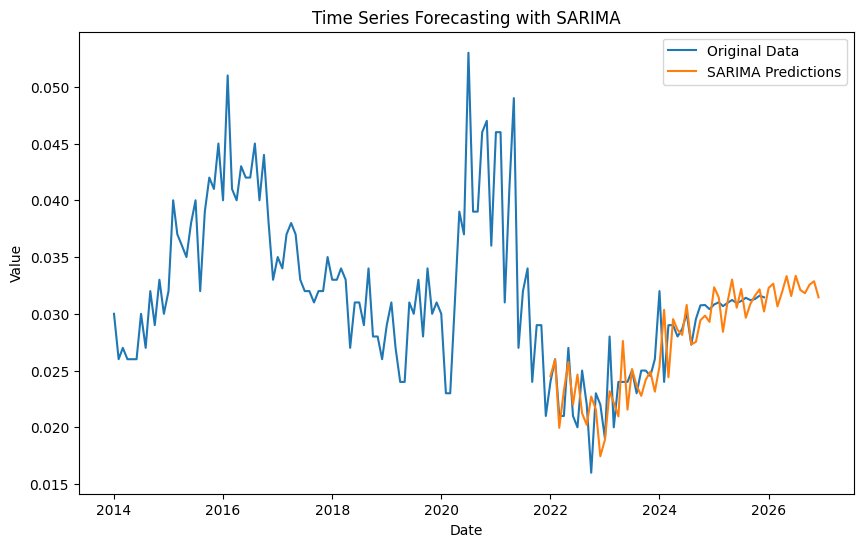

SARIMA - MSE: 6.630795251946645e-06, RMSE: 0.002575033058418211, MAPE: 7.58%


In [256]:
model_sarima(data_filtered,'Norway', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1078.304, Time=0.35 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-946.506, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1004.169, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-948.505, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1137.383, Time=0.58 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1095.332, Time=0.11 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1137.760, Time=0.57 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1119.911, Time=0.41 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1136.200, Time=0.71 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1136.605, Time=0.43 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1140.535, Time=0.67 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1130.570, Time=0.12 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1121.906, Time=0.06 sec
 ARIMA(3,2,2)(0,0,0)[0]    

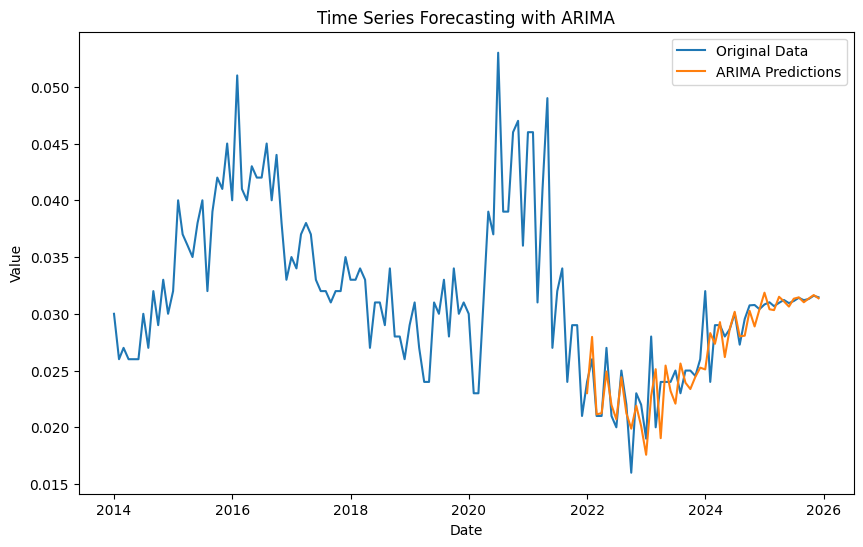

ARIMA - MSE: 6.875469658785734e-06, RMSE: 0.002622111679312255, MAPE: 8.14%


In [257]:
model_arima(data_filtered,'Norway', '25+', 'Male')

## 25+, Total

In [258]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Total')

In [259]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7663
Strong seasonality detected.


(0.7663197528697343, True)

In [260]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1068.335, Time=0.58 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-995.723, Time=0.14 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1037.468, Time=0.31 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1069.204, Time=0.35 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1022.509, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1056.773, Time=0.55 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1066.298, Time=1.31 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1042.852, Time=0.14 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1058.726, Time=0.69 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1040.471, Time=1.22 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1075.588, Time=0.83 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-1024.775, Time=0.09 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1056.695, Time=0.33 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1074.640, Time=2.10 sec
 ARIMA

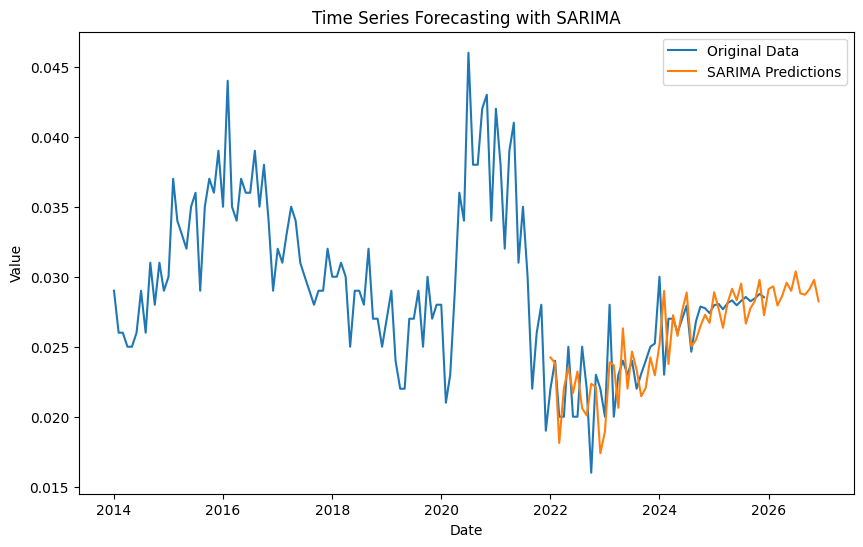

SARIMA - MSE: 5.390753334006742e-06, RMSE: 0.002321799589544012, MAPE: 7.55%


In [261]:
model_sarima(data_filtered,'Norway', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1020.918, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1084.897, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1022.916, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1161.064, Time=0.07 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1179.096, Time=0.05 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1188.781, Time=0.31 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1186.284, Time=0.20 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1186.322, Time=0.75 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1186.119, Time=0.15 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1190.776, Time=0.08 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1188.275, Time=0.11 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1181.086, Time=0.03 sec
 ARIMA(3,2,2)(0,0,0)[0]        

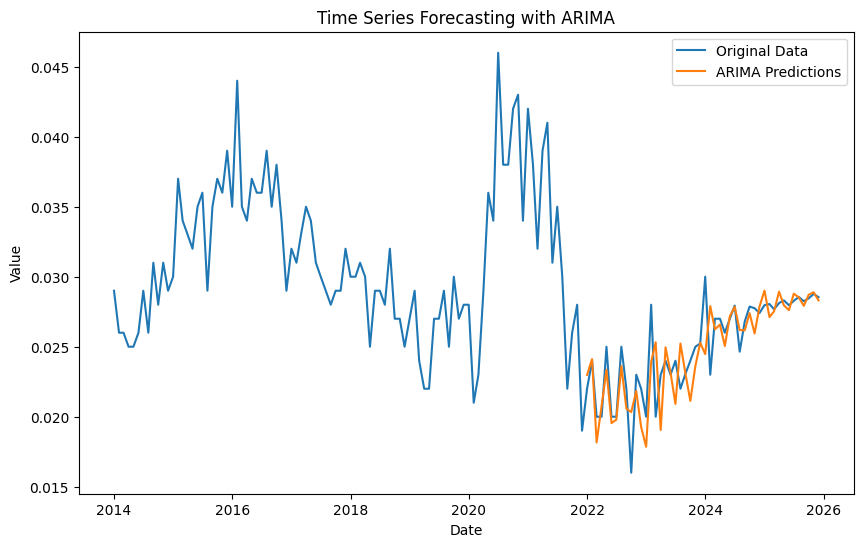

ARIMA - MSE: 6.397480320002171e-06, RMSE: 0.0025293240836243526, MAPE: 8.39%


In [262]:
model_arima(data_filtered,'Norway', '25+', 'Total')

# Latvia

## 15-24, Female

In [263]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Female')

In [264]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7869
Strong seasonality detected.


(0.7869499499578043, True)

In [265]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-604.656, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-710.085, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-662.352, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-745.803, Time=0.86 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.28 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-755.792, Time=0.30 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.92 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-764.549, Time=1.47 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-715.179, Time=0.23 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-805.447, Time=1.79 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=-792.2

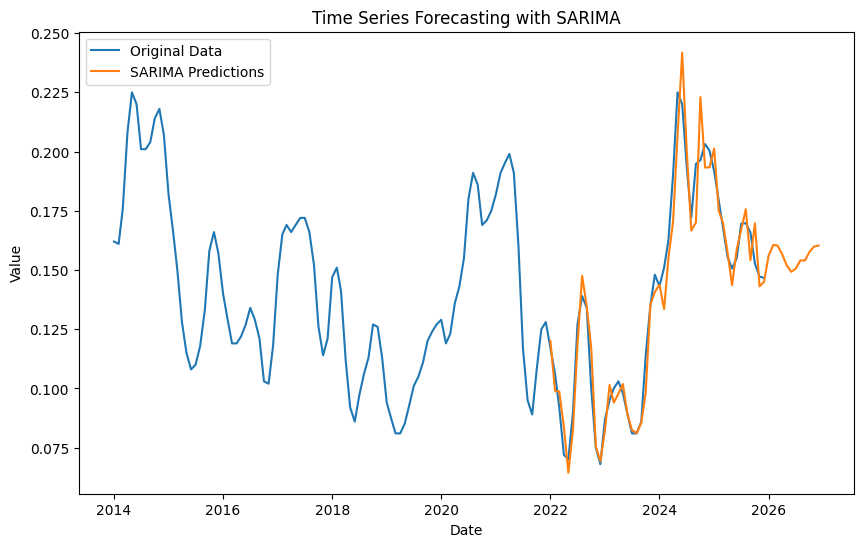

SARIMA - MSE: 0.00010403307917174032, RMSE: 0.01019966073807067, MAPE: 5.43%


In [266]:
model_sarima(data_filtered,'Latvia', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-845.115, Time=0.31 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-827.757, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-832.226, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-834.059, Time=0.35 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-829.757, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-884.257, Time=0.47 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-839.996, Time=0.19 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-884.749, Time=0.62 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-874.522, Time=0.30 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-891.542, Time=0.48 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-875.979, Time=1.50 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-899.990, Time=0.53 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-884.311, Time=0.37 sec
 ARIMA(3,2,3)(0,0,0)[0]             : AIC=-903.108, Time=0.26 sec
 ARIMA(2,2,3)(0,0,0)[0]          

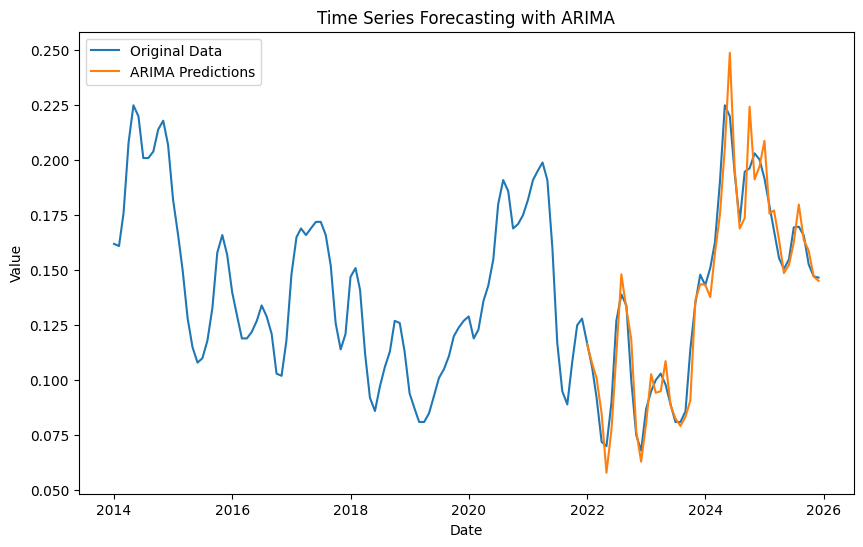

ARIMA - MSE: 0.00012524405759002582, RMSE: 0.011191249152352289, MAPE: 7.40%


In [267]:
model_arima(data_filtered,'Latvia', '15-24', 'Female')

## 15-24, Male

In [268]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Male')

In [269]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.5419
Weak or no seasonality detected.


(0.5419114213803187, False)

In [270]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-770.101, Time=1.75 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-595.925, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-722.264, Time=0.63 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-703.305, Time=0.26 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-755.088, Time=1.08 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-765.171, Time=2.33 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-754.483, Time=0.48 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-769.268, Time=2.20 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-799.612, Time=0.84 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-740.468, Time=0.15 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-785.972, Time=0.79 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-797.086, Time=1.73 sec
 ARIMA(2,1,1)(1,1,0)[12]     

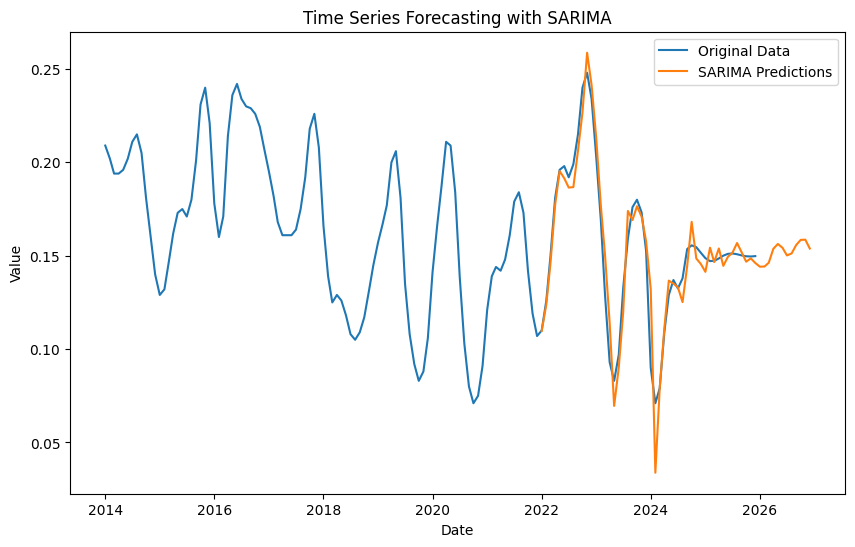

SARIMA - MSE: 0.0001330001577544221, RMSE: 0.011532569434190376, MAPE: 6.40%


In [271]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-831.979, Time=0.34 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-808.093, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-829.882, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-831.547, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-810.091, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-825.420, Time=0.42 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-844.872, Time=0.67 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-882.754, Time=0.63 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-880.147, Time=0.50 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,2,3)(0,0,0)[0] intercept
Total fit time: 3.582 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Model:

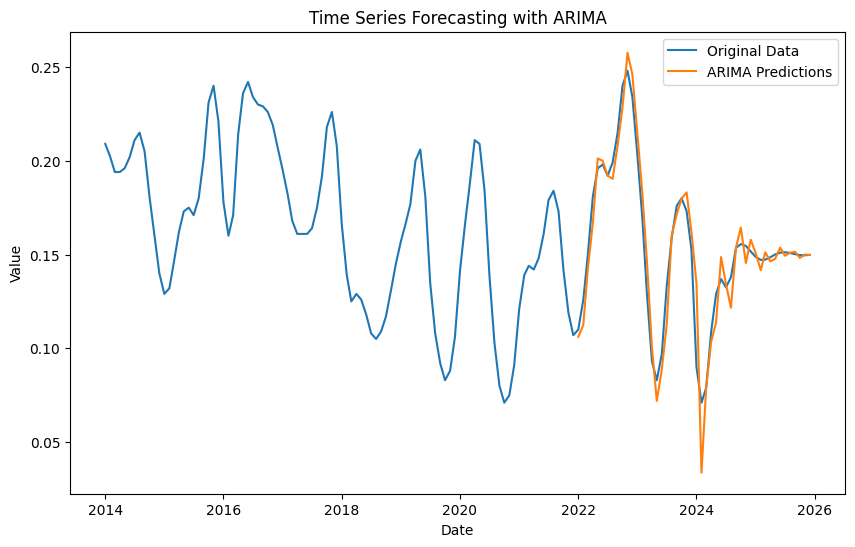

ARIMA - MSE: 0.00020761401267688307, RMSE: 0.014408817185212778, MAPE: 8.90%


In [272]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Total

In [273]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Total')

In [274]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6486
Weak or no seasonality detected.


(0.6485924012943354, False)

In [275]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-729.802, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-832.921, Time=0.41 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-785.924, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-835.994, Time=0.95 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-844.659, Time=2.07 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-846.944, Time=0.69 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-853.506, Time=1.75 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-854.266, Time=1.33 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-874.178, Time=2.05 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-869.764, Time=0.59 sec
 ARIMA(2,1,0)(1,1,2)[12]             : 

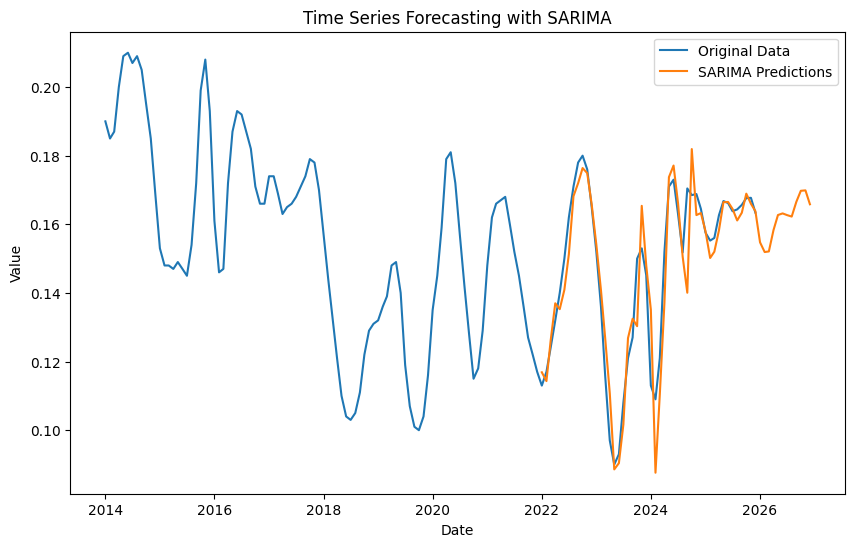

SARIMA - MSE: 8.055244061262218e-05, RMSE: 0.008975101147765532, MAPE: 4.50%


In [276]:
model_sarima(data_filtered,'Latvia', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-945.609, Time=0.68 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-932.113, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-934.579, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-934.891, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-934.113, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-969.110, Time=0.53 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-934.772, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-958.484, Time=0.21 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-943.854, Time=0.22 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-963.007, Time=0.50 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-960.403, Time=0.10 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-970.852, Time=0.42 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-979.285, Time=0.33 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-970.061, Time=0.37 sec
 ARIMA(3,2,3)(0,0,0)[0]          

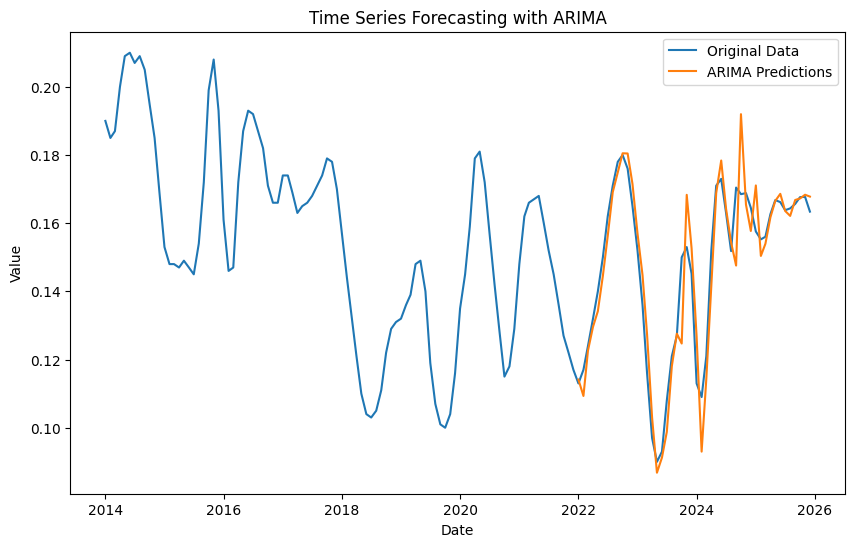

ARIMA - MSE: 7.251535833224003e-05, RMSE: 0.008515595007528248, MAPE: 4.99%


In [277]:
model_arima(data_filtered,'Latvia', '15-24', 'Total')

## 25+, Male

In [278]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Male')

In [279]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9349
Strong seasonality detected.


(0.9349139106344168, True)

In [280]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1183.854, Time=0.73 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1049.207, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1159.170, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1116.865, Time=0.93 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1134.303, Time=0.15 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1173.904, Time=0.71 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1170.308, Time=2.06 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1171.433, Time=0.86 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1179.174, Time=1.11 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1167.846, Time=0.31 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1199.536, Time=0.55 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1152.407, Time=0.35 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1183.145, Time=0.75 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1181.252, Time=1.78 sec
 ARIM

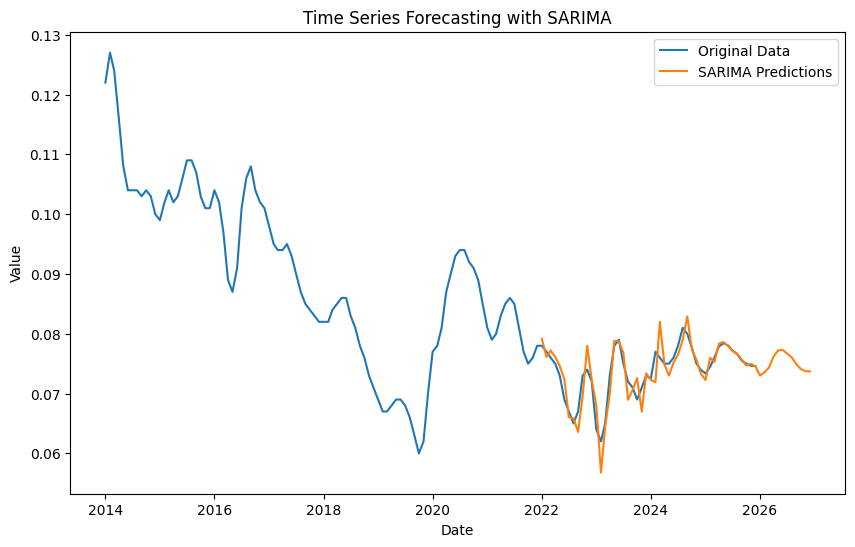

SARIMA - MSE: 5.058890162383474e-06, RMSE: 0.0022491976708114104, MAPE: 2.22%


In [281]:
model_sarima(data_filtered,'Latvia', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1259.299, Time=0.26 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1271.693, Time=0.09 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1274.919, Time=0.16 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1273.805, Time=1.08 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1273.668, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1282.641, Time=0.73 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1308.505, Time=0.82 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1306.280, Time=0.72 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1265.693, Time=0.61 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1310.508, Time=0.31 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-1284.629, Time=0.57 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1308.280, Time=0.45 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1267.669, Time=0.23 sec

Best model:  ARIMA(3,2,0)(0,0,0)[0]          
Total fit time: 6.052 seconds
         

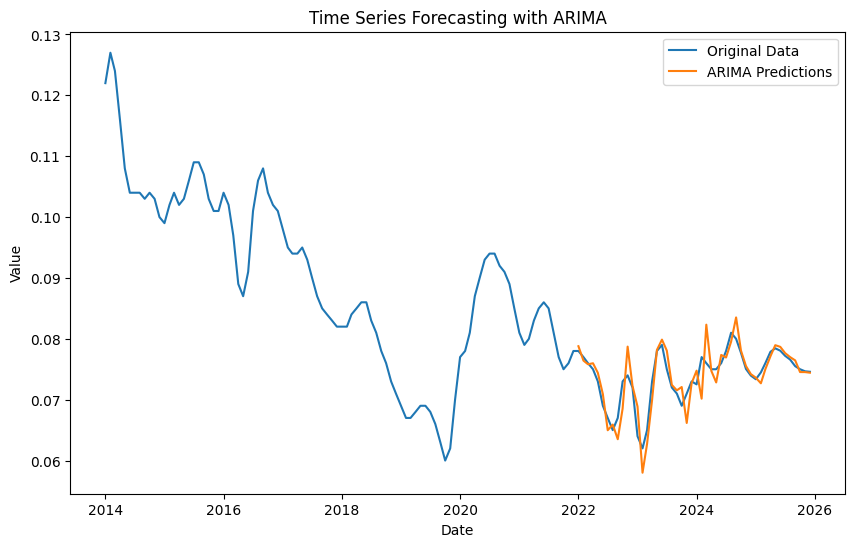

ARIMA - MSE: 8.765736759656837e-06, RMSE: 0.0029606986945072333, MAPE: 3.20%


In [282]:
model_arima(data_filtered,'Latvia', '25+', 'Male')

## 25+, Female

In [283]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Female')

In [284]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9646
Strong seasonality detected.


(0.9646498811395835, True)

In [285]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1173.143, Time=0.96 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1099.338, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1223.555, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1140.369, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1166.145, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1249.649, Time=0.65 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1247.372, Time=0.84 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1245.094, Time=0.30 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-1192.713, Time=0.18 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-1251.593, Time=1.01 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-1240.172, Time=0.52 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-1248.252, Time=0.91 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-1250.092, Time=0.48 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-1259.731, Time=1.21 sec
 ARIM

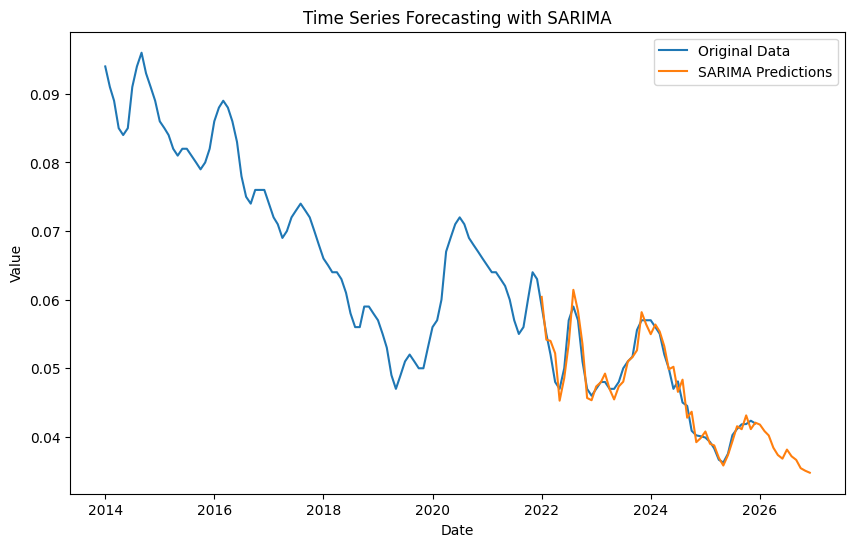

SARIMA - MSE: 2.5667622107959146e-06, RMSE: 0.0016021117972213781, MAPE: 2.53%


In [286]:
model_sarima(data_filtered,'Latvia', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1355.738, Time=0.88 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1359.741, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1357.848, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1357.851, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1361.729, Time=0.09 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 1.269 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 681.864
Date:                Mon, 09 Dec 2024   AIC                          -1361.729
Time:                        12:42:39   BIC                          -1358.773
Sample:                    01-01-2014   HQIC                         -1360.528
                         - 12-01-2025                                  

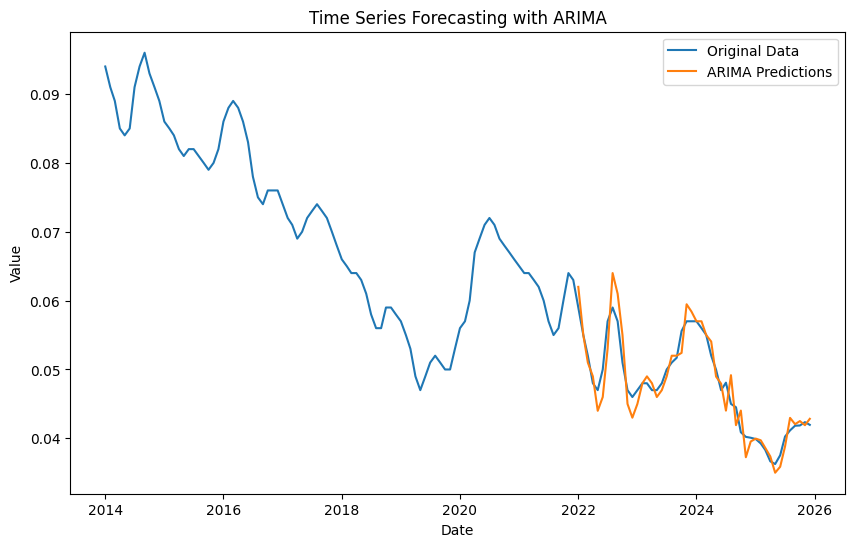

ARIMA - MSE: 5.24632375474834e-06, RMSE: 0.002290485484509417, MAPE: 3.47%


In [287]:
model_arima(data_filtered,'Latvia', '25+', 'Female')

## 25+, Total

In [288]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Total')

In [289]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9769
Strong seasonality detected.


(0.9768654325858291, True)

In [290]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1296.137, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1167.161, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1277.496, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1262.410, Time=0.87 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1238.630, Time=0.25 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1288.125, Time=0.68 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1289.077, Time=1.17 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1278.394, Time=0.64 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1282.262, Time=1.89 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1290.368, Time=0.36 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1300.940, Time=0.64 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1242.591, Time=0.08 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1288.166, Time=0.96 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1291.286, Time=1.55 sec
 ARIM

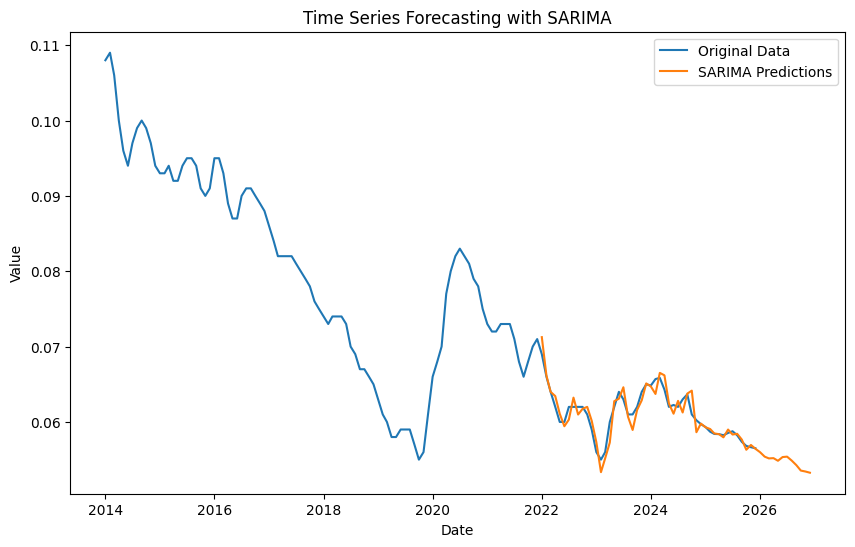

SARIMA - MSE: 1.3695381714789159e-06, RMSE: 0.0011702726910762789, MAPE: 1.44%


In [291]:
model_sarima(data_filtered,'Latvia', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1399.886, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1403.889, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1402.269, Time=0.13 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1401.434, Time=0.37 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1405.884, Time=0.07 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 0.753 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 703.942
Date:                Mon, 09 Dec 2024   AIC                          -1405.884
Time:                        12:43:06   BIC                          -1402.928
Sample:                    01-01-2014   HQIC                         -1404.683
                         - 12-01-2025                                  

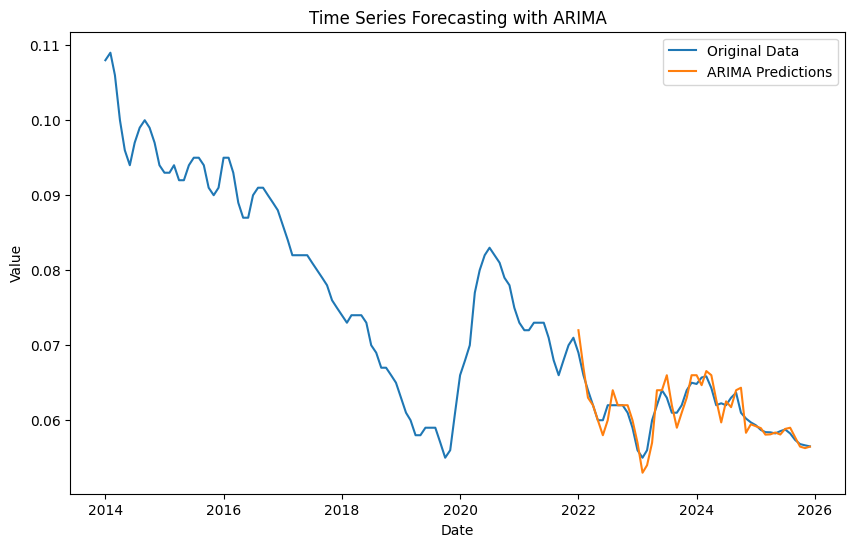

ARIMA - MSE: 2.5626871110653443e-06, RMSE: 0.0016008395019693087, MAPE: 2.15%


In [292]:
model_arima(data_filtered,'Latvia', '25+', 'Total')

# Lithuania

## 15-24,Male

In [293]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Male')

In [294]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7065
Strong seasonality detected.


(0.7065319097842284, True)

In [295]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2024-09-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-570.881, Time=1.07 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-523.132, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-546.641, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-531.068, Time=0.13 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-569.265, Time=0.94 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-545.909, Time=0.48 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-567.165, Time=1.62 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-571.828, Time=0.91 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-531.643, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-569.817, Time=0.45 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-570.568, Time=1.02 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.36 sec
 ARIMA(0,1,0)(0,1,1)[12]          

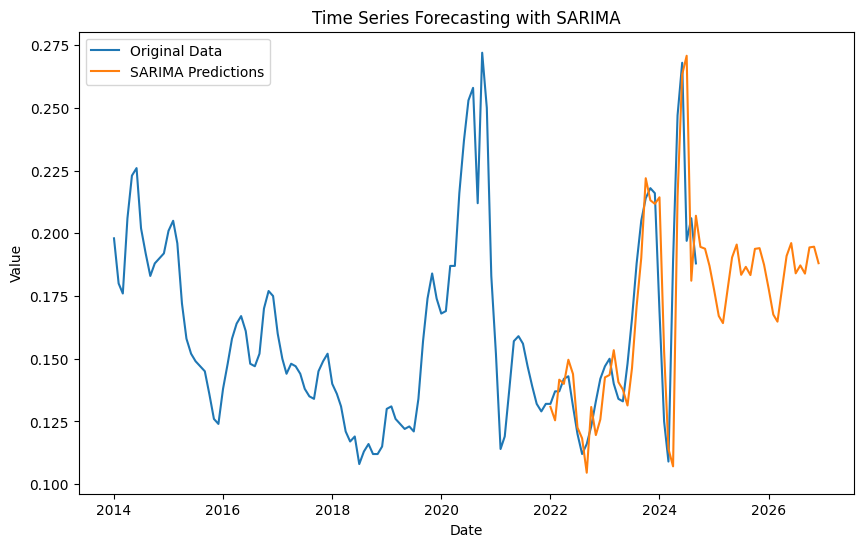

SARIMA - MSE: 0.0005973513543003243, RMSE: 0.02444077237528152, MAPE: 9.65%


In [296]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-596.131, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-602.000, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-598.131, Time=0.05 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-603.908, Time=0.04 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-616.765, Time=0.03 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-654.484, Time=0.29 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-644.511, Time=0.19 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-650.542, Time=0.45 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-657.800, Time=0.20 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-618.759, Time=0.10 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-655.169, T

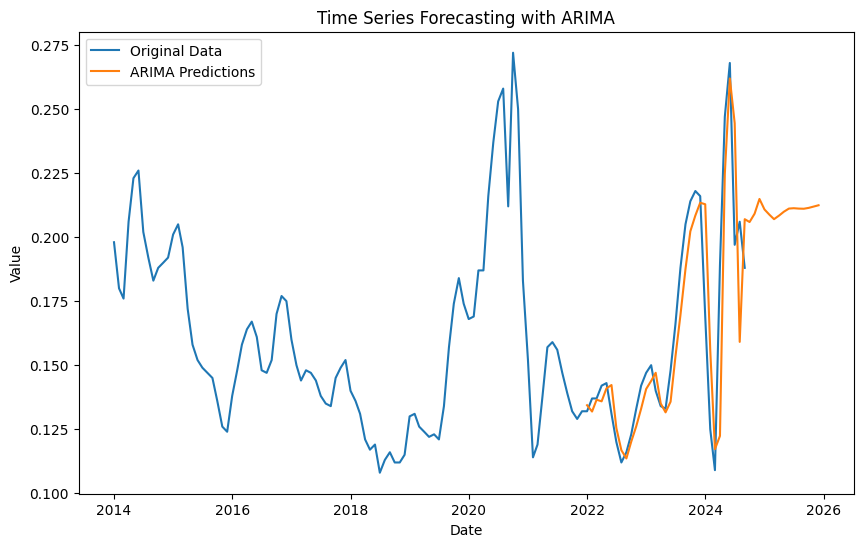

ARIMA - MSE: 0.00032109063652637453, RMSE: 0.017919002107438197, MAPE: 7.01%


In [297]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Female

In [298]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Female')

In [299]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9405
Strong seasonality detected.


(0.9405499916955844, True)

In [300]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-766.130, Time=1.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-685.187, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-737.323, Time=0.51 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-698.144, Time=0.16 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-767.497, Time=1.59 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-740.206, Time=0.84 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-763.664, Time=1.15 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-765.182, Time=0.97 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-746.027, Time=1.43 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-762.842, Time=2.00 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-760.906, Time=0.50 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-763.256, Time=0.83 sec
 ARIMA(2,1,1)(1,1,1)[12]     

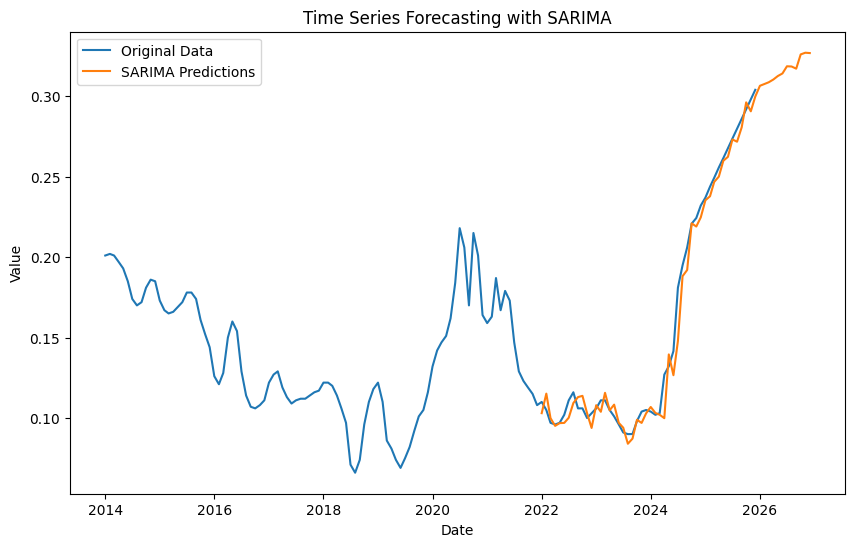

SARIMA - MSE: 7.343290968868346e-05, RMSE: 0.008569300420027497, MAPE: 4.29%


In [301]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-807.925, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-818.970, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-809.924, Time=0.05 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-841.829, Time=0.13 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-841.387, Time=0.05 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-861.137, Time=0.43 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-867.090, Time=0.42 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-867.723, Time=0.47 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-867.457, Time=0.41 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-861.151, Time=0.61 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-867.743, Time=0.62 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-864.8

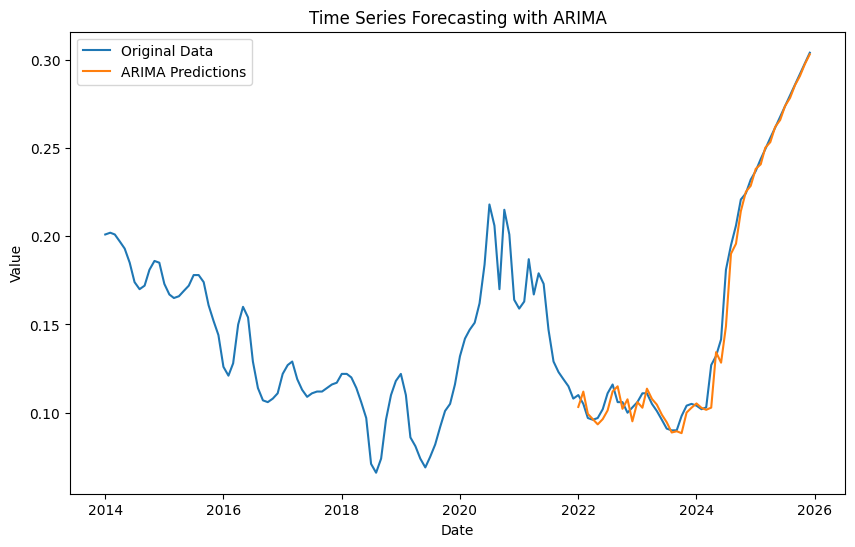

ARIMA - MSE: 4.886360005486134e-05, RMSE: 0.006990250357094611, MAPE: 4.60%


In [302]:
model_arima(data_filtered,'Lithuania', '15-24', 'Female')

## 15-24, Total

In [303]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Total')

In [304]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8322
Strong seasonality detected.


(0.8321917608270604, True)

In [305]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-666.426, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-705.268, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-736.692, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-667.503, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-737.803, Time=0.78 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-705.187, Time=0.23 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-736.606, Time=1.07 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.45 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-718.735, Time=1.12 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-733.673, Time=1.45 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=i

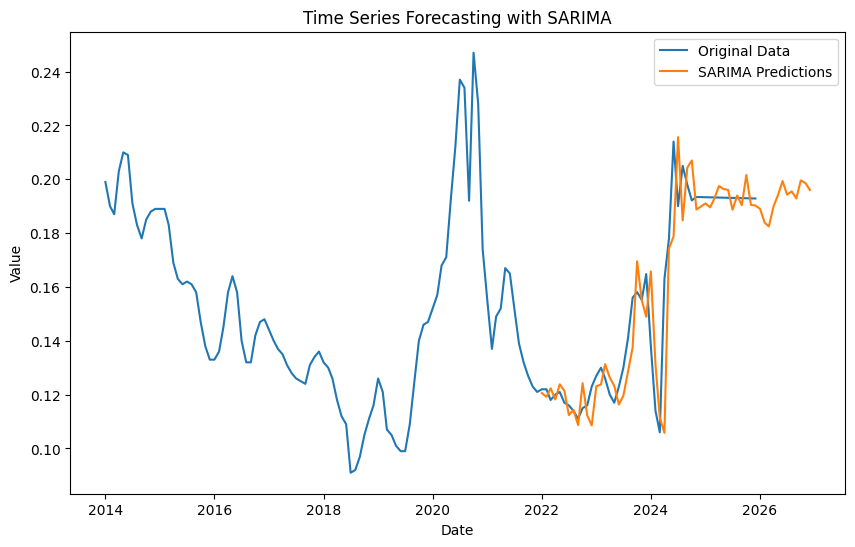

SARIMA - MSE: 0.00018202399045121707, RMSE: 0.013491626679211706, MAPE: 5.61%


In [306]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-754.594, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-780.210, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-756.592, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-785.205, Time=0.07 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-791.789, Time=0.21 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-818.816, Time=0.68 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-822.662, Time=0.53 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-822.974, Time=0.77 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-814.973, Time=0.81 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-818.178, Time=0.46 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0

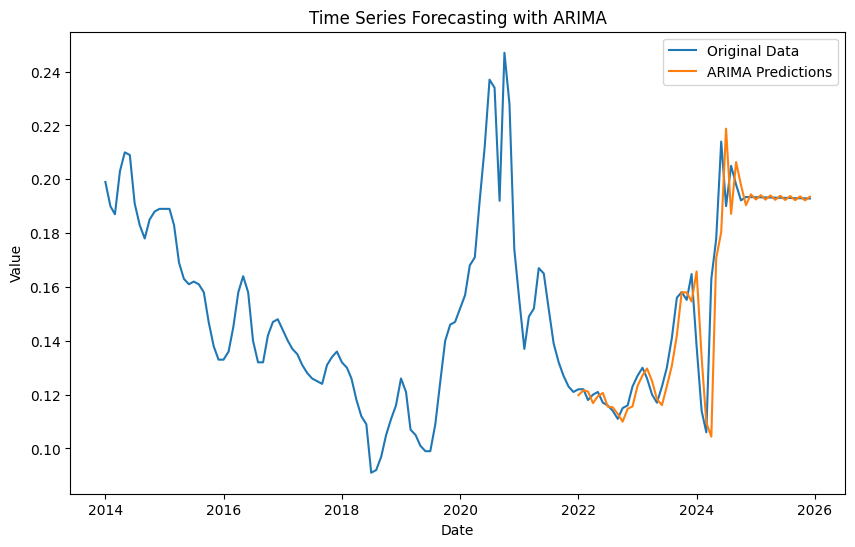

ARIMA - MSE: 0.0002164874160498722, RMSE: 0.014713511343315442, MAPE: 5.72%


In [307]:
model_arima(data_filtered,'Lithuania', '15-24', 'Total')

## 25+, Female

In [308]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Female')

In [309]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9153
Strong seasonality detected.


(0.9153177280043763, True)

In [310]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1159.165, Time=1.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1096.971, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1151.547, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1161.054, Time=0.55 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1103.223, Time=0.28 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1160.076, Time=0.24 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.42 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1150.279, Time=0.16 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1129.062, Time=1.60 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1153.284, Time=0.27 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1159.256, Time=0.35 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1160.812, Time=0.52 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1157.489, Time=0.60 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-1161.371, Time=0.24 sec
 ARIMA(0,1,

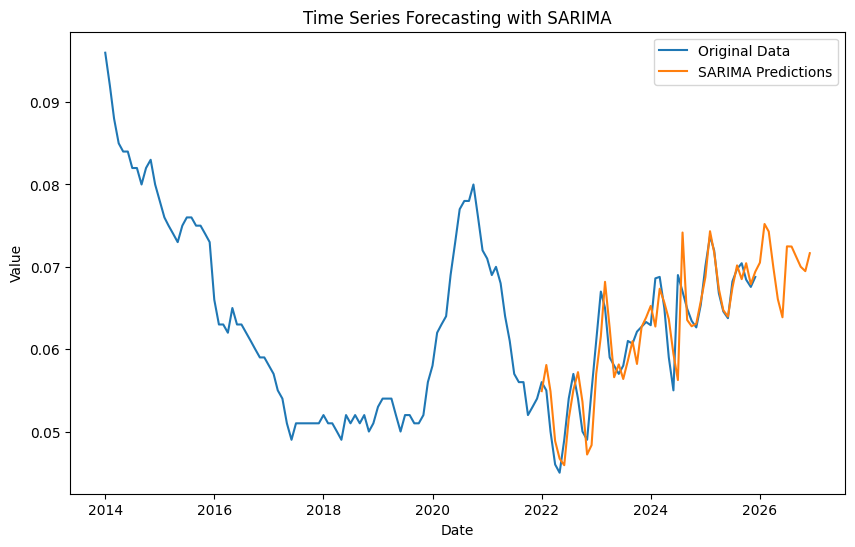

SARIMA - MSE: 1.1323411076224104e-05, RMSE: 0.0033650276486567095, MAPE: 4.03%


In [311]:
model_sarima(data_filtered,'Lithuania', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1267.874, Time=0.74 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1214.262, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1220.850, Time=0.10 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1229.169, Time=0.13 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1216.244, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1208.262, Time=0.17 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1266.677, Time=0.43 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-1266.407, Time=0.24 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1224.246, Time=0.23 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1242.569, Time=0.82 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-1111.971, Time=0.23 sec

Best model:  ARIMA(1,2,1)(0,0,0)[0] intercept
Total fit time: 3.164 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:       

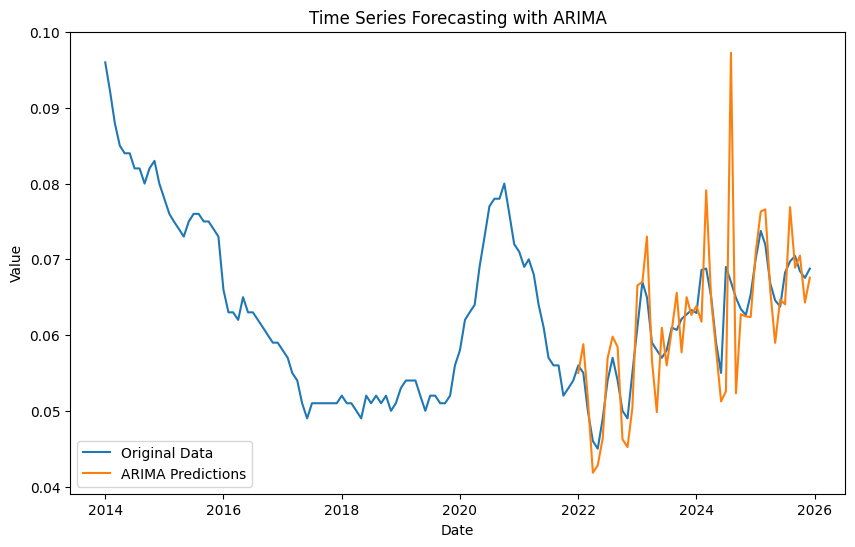

ARIMA - MSE: 1.7954721351168466e-05, RMSE: 0.004237301187214389, MAPE: 5.98%


In [312]:
model_arima(data_filtered,'Lithuania',  '25+', 'Female')

## 25+, Male

In [313]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Male')

In [314]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9518
Strong seasonality detected.


(0.9517913353801197, True)

In [315]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1100.578, Time=1.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1056.537, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1074.910, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1108.303, Time=1.53 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1055.250, Time=0.21 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1103.018, Time=1.47 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1107.659, Time=1.99 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1074.791, Time=0.10 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1098.035, Time=0.29 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1102.843, Time=0.83 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1099.405, Time=0.26 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1100.525, Time=1.10 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-1098.204, Time=0.83 sec

Best model

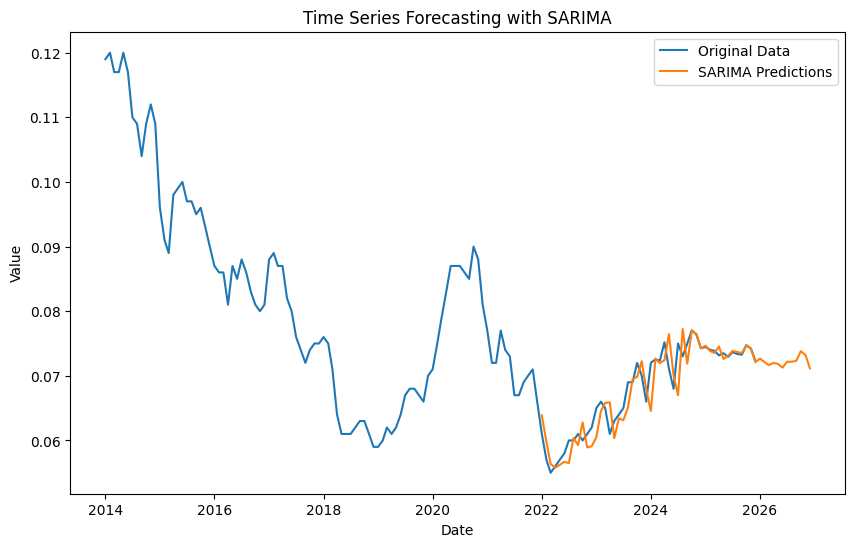

SARIMA - MSE: 6.953234048675134e-06, RMSE: 0.0026368985662469334, MAPE: 2.74%


In [316]:
model_sarima(data_filtered,'Lithuania', '25+', 'Male')

## 25+, Total

In [317]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Total')

In [318]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9498
Strong seasonality detected.


(0.9498201715656097, True)

In [319]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1155.090, Time=1.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1099.200, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1131.755, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1159.425, Time=0.40 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1098.049, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1157.725, Time=0.74 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1154.391, Time=0.79 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1131.197, Time=0.31 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1124.828, Time=0.74 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1156.442, Time=0.12 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1157.102, Time=0.25 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1159.898, Time=0.65 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1098.152, Time=0.06 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1155.890, Time=0.41 sec
 ARIM

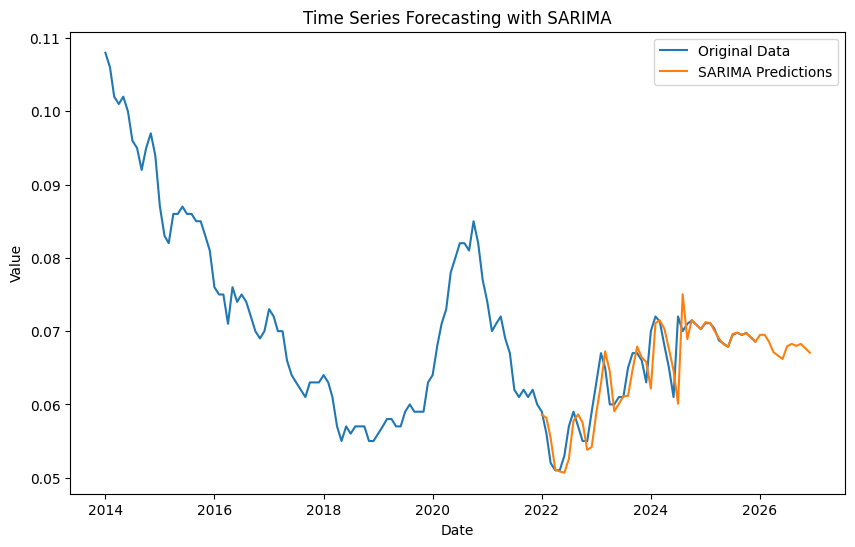

SARIMA - MSE: 8.877529864511982e-06, RMSE: 0.002979518394726232, MAPE: 2.93%


In [320]:
model_sarima(data_filtered,'Lithuania', '25+', 'Total')

# Slovakia

## 15-24, Female

In [321]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Female')

In [322]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9264
Strong seasonality detected.


(0.9263537925495487, True)

In [323]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-849.745, Time=0.80 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-699.456, Time=0.15 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-812.737, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-836.799, Time=0.55 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-773.501, Time=0.04 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-848.755, Time=2.03 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=2.23 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-816.141, Time=0.35 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2.65 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-845.686, Time=0.21 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-854.366, Time=1.24 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-779.419, Time=0.43 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-856.351, Time=1.79 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-821.311, Time=0.80 sec
 ARIMA(2,1,1)(2,1,1)[12]     

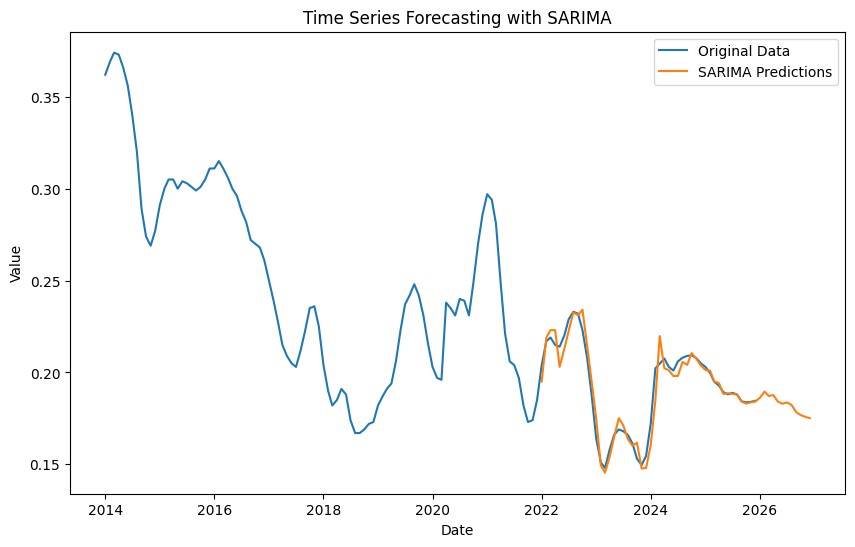

SARIMA - MSE: 3.603813386965638e-05, RMSE: 0.0060031769813704795, MAPE: 2.22%


In [324]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Female')

## 15-24, Male

In [325]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Male')

In [326]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9557
Strong seasonality detected.


(0.9557141509185084, True)

In [327]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-942.465, Time=2.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-823.413, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-911.947, Time=0.47 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-933.966, Time=0.63 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-888.456, Time=0.13 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-934.944, Time=0.86 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-935.854, Time=1.63 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-913.328, Time=0.41 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-933.177, Time=1.35 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-932.978, Time=0.42 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-938.053, Time=0.59 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-931.744, Time=0.74 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-885.255, Time=0.22 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-942.863, Time=1.40 sec
 ARIMA(0,1,2)(0,1,0

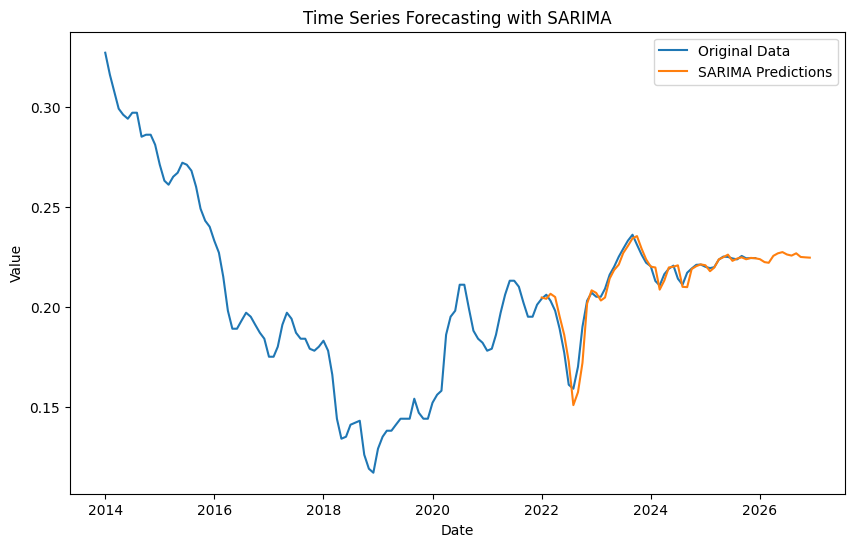

SARIMA - MSE: 2.3620645116023502e-05, RMSE: 0.00486010752103526, MAPE: 1.59%


In [328]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Male')

## 15-24, Total

In [329]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Total')

In [330]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9702
Strong seasonality detected.


(0.9702478161898167, True)

In [331]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-959.261, Time=1.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-870.083, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-924.950, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-959.578, Time=0.87 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-896.542, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-956.498, Time=1.08 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.66 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-924.958, Time=0.74 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-956.980, Time=2.47 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-933.287, Time=0.20 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-959.034, Time=1.51 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-960.585, Time=0.66 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-896.623, Time=0.05 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-959.184, Time=1.15 sec
 ARIMA(1,1,0)(0,1,2)[12]

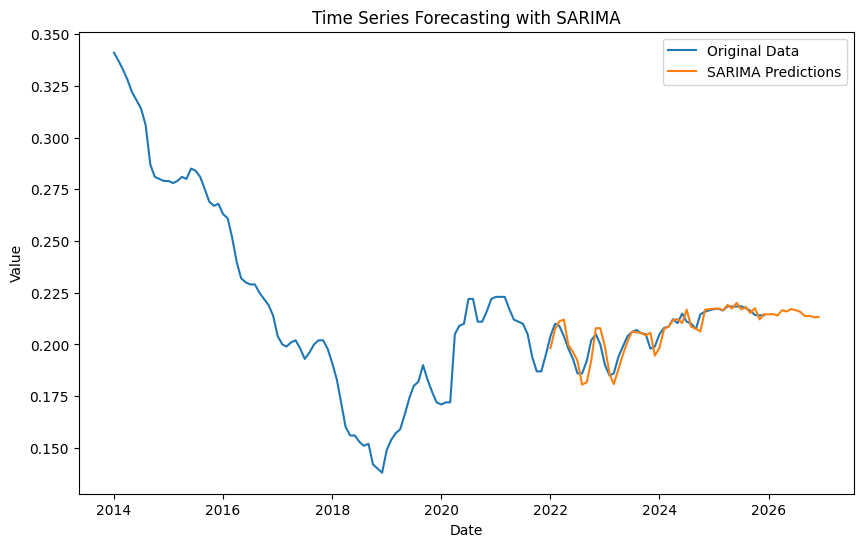

SARIMA - MSE: 1.8833777996884317e-05, RMSE: 0.0043397900867305, MAPE: 1.57%


In [332]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Total')

## 25+, Female

In [333]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Female')

In [334]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9969
Strong seasonality detected.


(0.9968558155462416, True)

In [335]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1349.898, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1276.747, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1337.471, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1345.758, Time=0.16 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1320.014, Time=0.36 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1338.085, Time=0.83 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1335.201, Time=0.13 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1357.499, Time=0.89 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1344.307, Time=1.56 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1342.600, Time=1.31 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1354.874, Time=0.50 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1360.329, Time=0.63 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(1,1,0)(1,1

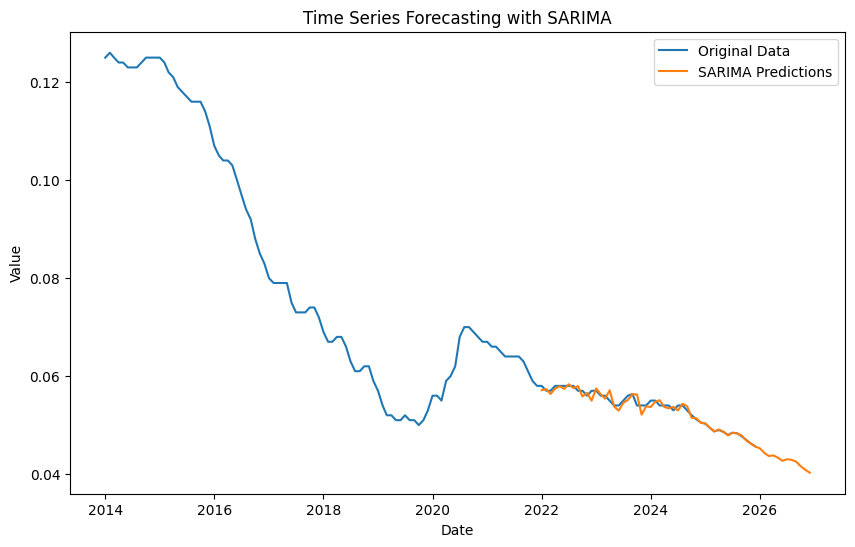

SARIMA - MSE: 6.441711929128387e-07, RMSE: 0.0008026027615905884, MAPE: 1.02%


In [336]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Female')

## 25+, Male

In [337]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Male')

In [338]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9984
Strong seasonality detected.


(0.9984418552570243, True)

In [339]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1426.221, Time=0.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1362.119, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1411.320, Time=0.72 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1410.258, Time=0.59 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1376.477, Time=0.25 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1421.767, Time=0.46 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1420.084, Time=0.26 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1432.253, Time=0.72 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1430.568, Time=1.48 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1418.793, Time=0.52 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1410.914, Time=0.54 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1421.014, Time=0.71 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1429.733, Time=2.10 sec
 ARIMA(1,1,

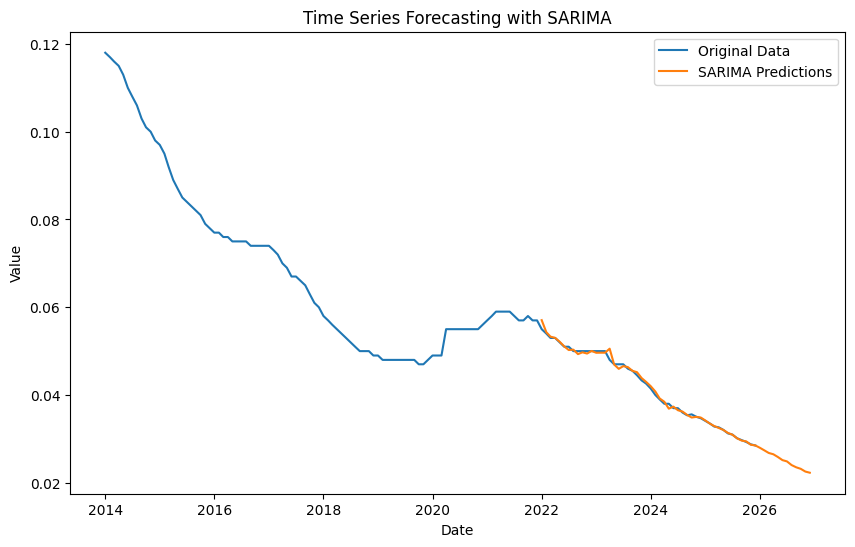

SARIMA - MSE: 3.878078586916994e-07, RMSE: 0.000622742208856682, MAPE: 0.87%


In [340]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Male')

## 25+, Total

In [341]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Total')

In [342]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9987
Strong seasonality detected.


(0.9986779646057866, True)

In [343]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1433.859, Time=0.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1383.869, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1411.751, Time=0.73 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1418.662, Time=0.20 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1397.377, Time=0.32 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1427.303, Time=0.24 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1420.585, Time=0.44 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1435.182, Time=1.02 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1430.657, Time=0.84 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1431.492, Time=0.96 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1417.796, Time=1.00 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1422.917, Time=1.03 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1432.002, Time=0.95 sec
 ARIMA(1,1,

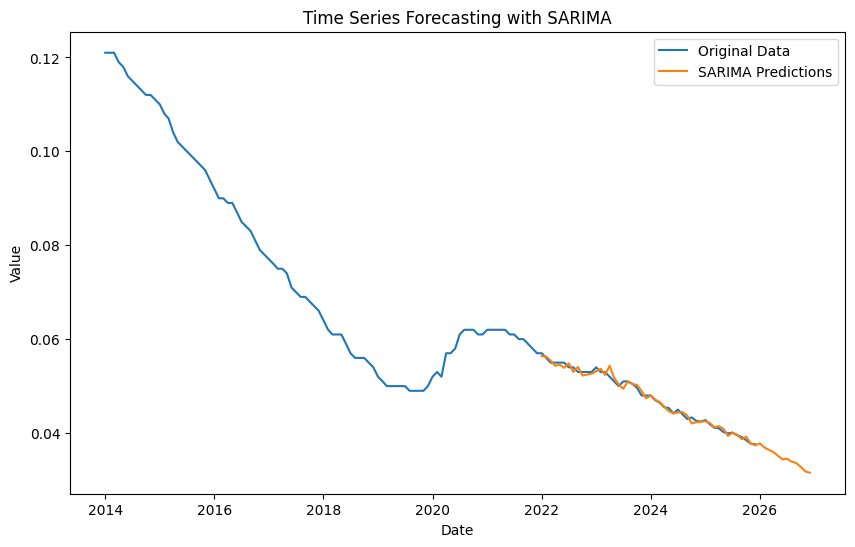

SARIMA - MSE: 4.824233795584043e-07, RMSE: 0.0006945670446820842, MAPE: 1.10%


In [344]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Total')

# Hungary

## 15-24, Female

In [345]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Female')

In [346]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9304
Strong seasonality detected.


(0.9303956684376221, True)

In [347]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-909.915, Time=1.59 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-831.692, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-873.727, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-907.434, Time=0.49 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-836.398, Time=0.30 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-905.928, Time=2.26 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.89 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-872.242, Time=0.84 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.86 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-911.450, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-838.094, Time=0.06 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-908.307, Time=0.98 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-911.542, Time=2.87 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,1,2)[12]          

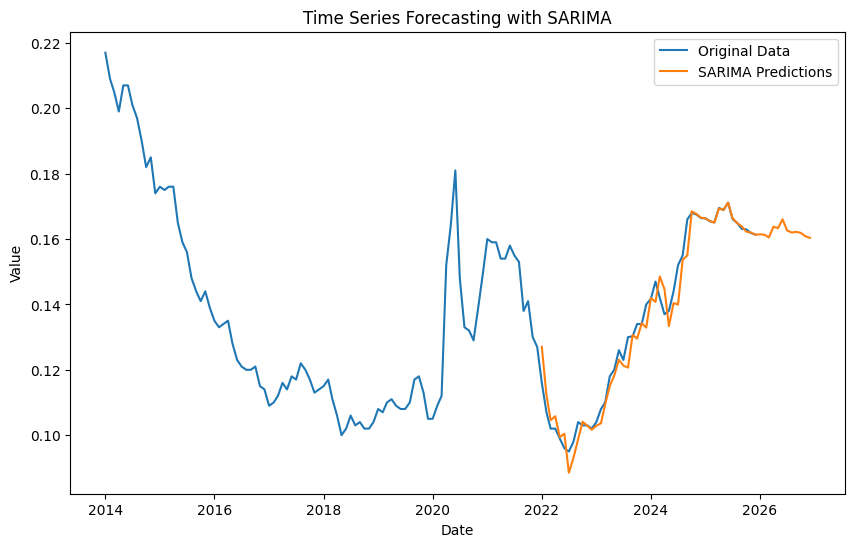

SARIMA - MSE: 1.9413585013870472e-05, RMSE: 0.004406084998484536, MAPE: 2.32%


In [348]:
model_sarima(data_filtered,'Hungary', '15-24', 'Female')

## 15-24, Male

In [349]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Male')

In [350]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9670
Strong seasonality detected.


(0.966950409421351, True)

In [351]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-947.460, Time=1.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-882.248, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-913.867, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-942.908, Time=0.69 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-885.623, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-945.116, Time=1.20 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-944.200, Time=1.17 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-914.051, Time=0.50 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.41 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-946.702, Time=0.69 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-945.084, Time=0.80 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-945.291, Time=1.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-941.895, Time=0.96 sec
 ARIMA(2,1,0)(0,1,1)[12]     

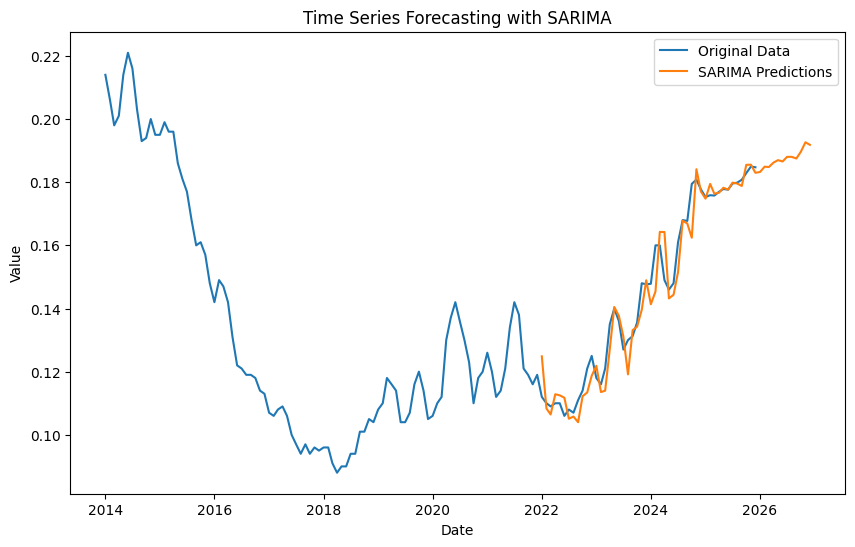

SARIMA - MSE: 3.4937068797681976e-05, RMSE: 0.005910758732826267, MAPE: 3.00%


In [352]:
model_sarima(data_filtered,'Hungary', '15-24', 'Male')

## 15-24, Total

In [353]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Total')

In [354]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9618
Strong seasonality detected.


(0.9617986191992375, True)

In [355]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-876.484, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-909.369, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-942.192, Time=0.23 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-879.060, Time=0.27 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-926.856, Time=0.51 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.73 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-907.789, Time=0.10 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-936.033, Time=0.20 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-950.305, Time=0.97 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-887.232, Time=0.13 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-945.962, Time=1.20 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-944.004, Time=1.60 sec
 ARIMA(0,1,2)(1,1,0)[12]          

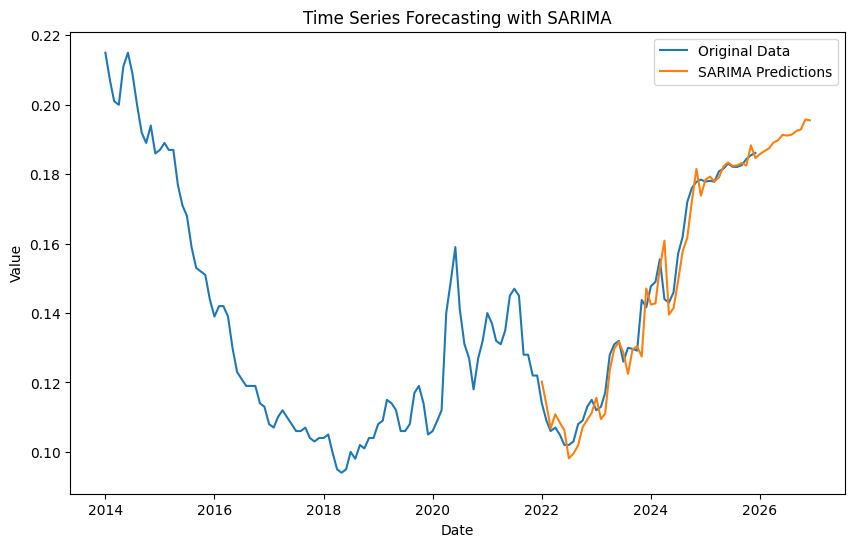

SARIMA - MSE: 2.6838287956131663e-05, RMSE: 0.005180568304359249, MAPE: 2.84%


In [356]:
model_sarima(data_filtered,'Hungary', '15-24', 'Total')

## 25+, Female

In [357]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Female')

In [358]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9895
Strong seasonality detected.


(0.989492505793542, True)

In [359]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1335.231, Time=0.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1282.794, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1313.435, Time=1.36 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1338.041, Time=0.78 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1281.300, Time=0.13 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1332.413, Time=0.45 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1313.452, Time=0.41 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.02 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1339.236, Time=0.49 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1333.789, Time=4.55 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=2.78 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1315.088, Time=0.91 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=4.90 sec
 ARIMA(1,1,0)(0,1,1)[12]     

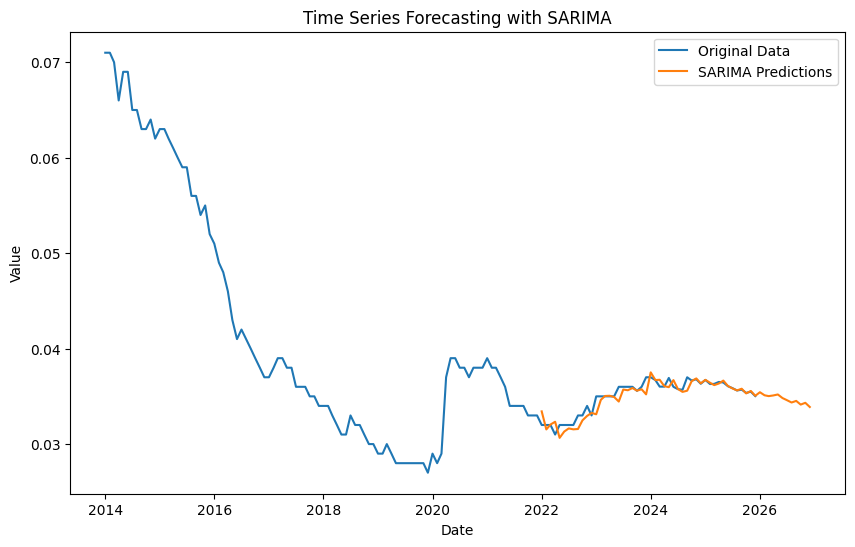

SARIMA - MSE: 5.00888261323007e-07, RMSE: 0.0007077345980825065, MAPE: 1.33%


In [360]:
model_sarima(data_filtered,'Hungary', '25+', 'Female')

## 25+, Male

In [361]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Male')

In [362]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9929
Strong seasonality detected.


(0.9929159757006695, True)

In [363]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1382.890, Time=0.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1342.196, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1368.262, Time=0.46 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1384.062, Time=0.88 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1340.444, Time=0.12 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1377.884, Time=0.75 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.51 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1367.782, Time=0.52 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1381.966, Time=1.98 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1385.425, Time=0.31 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1379.524, Time=0.56 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1369.884, Time=0.35 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1381.699, Time=2.91 sec
 ARIMA(1,1,0)(0,1

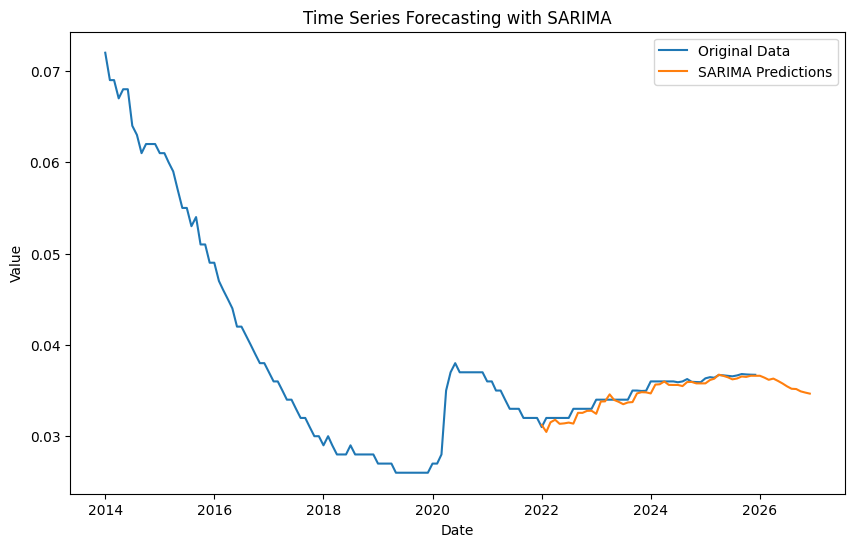

SARIMA - MSE: 3.1959512993609416e-07, RMSE: 0.0005653274537257979, MAPE: 1.18%


In [364]:
model_sarima(data_filtered,'Hungary', '25+', 'Male')

## 25+, Total

In [365]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Total')

In [366]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9929
Strong seasonality detected.


(0.9929248167754028, True)

In [367]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1383.688, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1337.240, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1365.303, Time=0.55 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1385.178, Time=0.93 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1335.566, Time=0.34 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1378.849, Time=1.01 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.55 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1365.161, Time=0.57 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1383.484, Time=3.60 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1386.271, Time=1.00 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1380.108, Time=0.35 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1366.754, Time=0.13 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1384.143, Time=1.16 sec
 ARIMA(1,1,0)(0,1

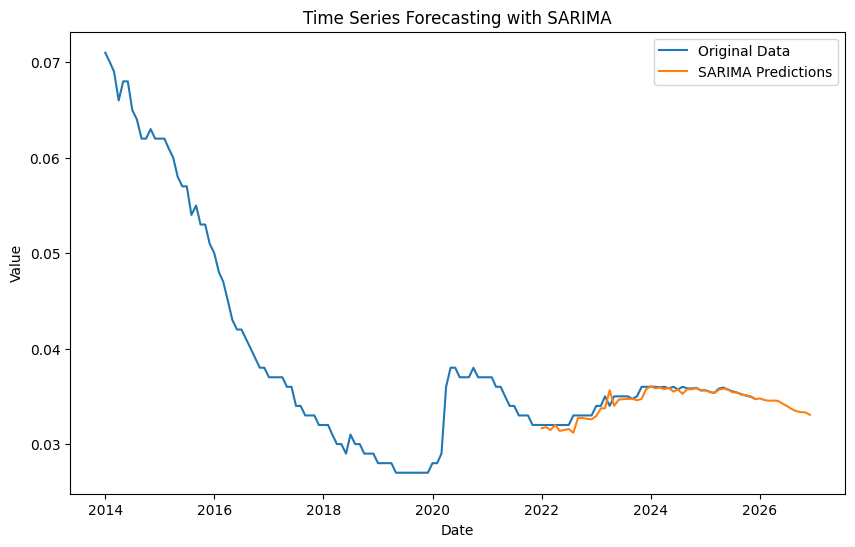

SARIMA - MSE: 3.014976122171166e-07, RMSE: 0.000549087982218803, MAPE: 1.00%


In [368]:
model_sarima(data_filtered,'Hungary', '25+', 'Total')

# USA

## 15-24, Male

In [369]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Male')

In [370]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6630
Weak or no seasonality detected.


(0.6629832496600796, False)

In [371]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-628.618, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-657.323, Time=0.36 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-628.087, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-665.641, Time=0.45 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-665.760, Time=0.46 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-658.114, Time=0.07 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.39 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-667.144, Time=0.97 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-658.186, Time=0.31 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, T

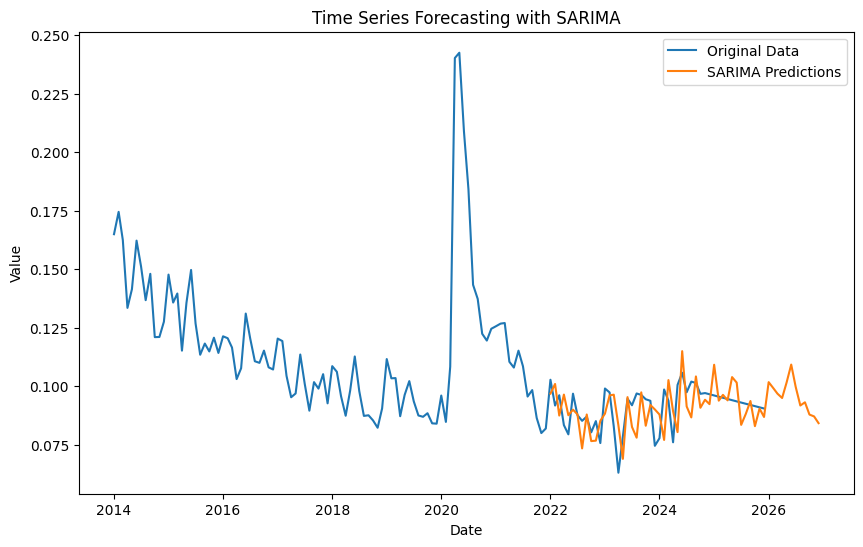

SARIMA - MSE: 9.586189967188175e-05, RMSE: 0.009790909031948042, MAPE: 9.04%


In [372]:
model_sarima(data_filtered,'United States of America', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-674.688, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-688.151, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-676.687, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-714.747, Time=0.04 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-720.512, Time=0.03 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-753.954, Time=0.28 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-757.225, Time=0.21 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-754.471, Time=0.58 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-752.058, Time=0.29 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-754.126, Time=0.29 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=inf, Time=0.56 sec

Best model:  ARIMA(3,2,2)(0,0,0)[0] intercept
Total 

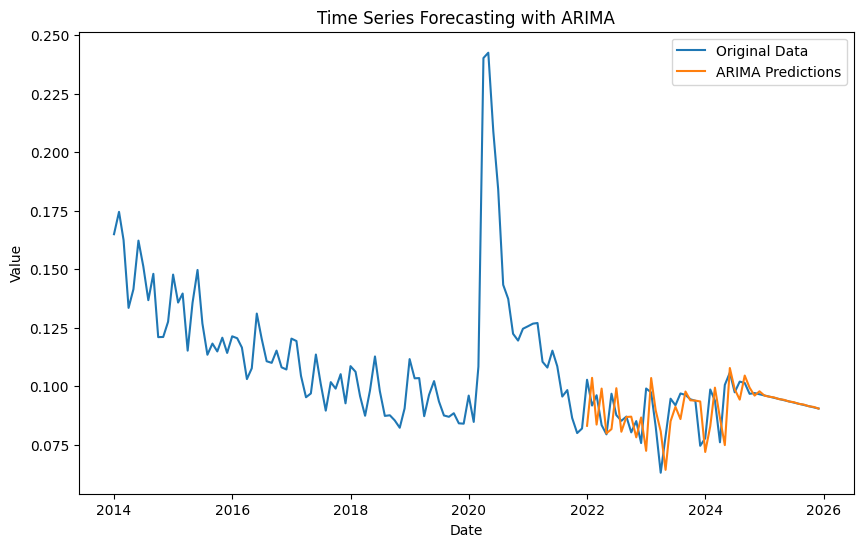

ARIMA - MSE: 0.00014983894716736576, RMSE: 0.012240871993749701, MAPE: 11.26%


In [373]:
model_arima(data_filtered,'United States of America', '15-24', 'Male')

## 15-24, Female

In [374]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Female')

In [375]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6323
Weak or no seasonality detected.


(0.6323019411740913, False)

In [376]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-547.265, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-576.387, Time=0.75 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-545.271, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-585.019, Time=1.32 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.80 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-587.017, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-578.381, Time=0.23 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.84 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-585.022, Time=1.17 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-589.754, Time=1.44 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=inf, T

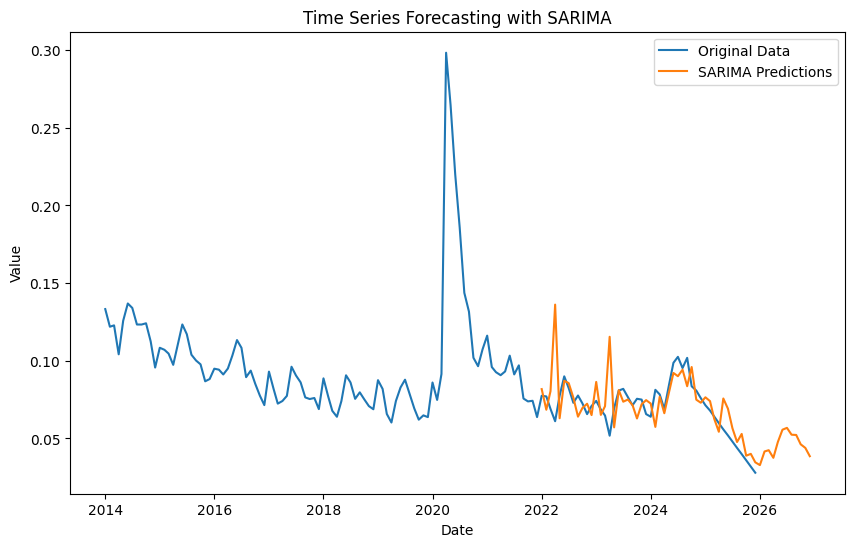

SARIMA - MSE: 0.00028489573131291736, RMSE: 0.016878854561637686, MAPE: 16.19%


In [377]:
model_sarima(data_filtered,'United States of America', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-594.623, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-617.864, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-596.622, Time=0.09 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-639.663, Time=0.04 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-643.534, Time=0.37 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-680.713, Time=0.87 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-680.777, Time=0.17 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-679.104, Time=0.15 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-676.885, Time=0.41 s

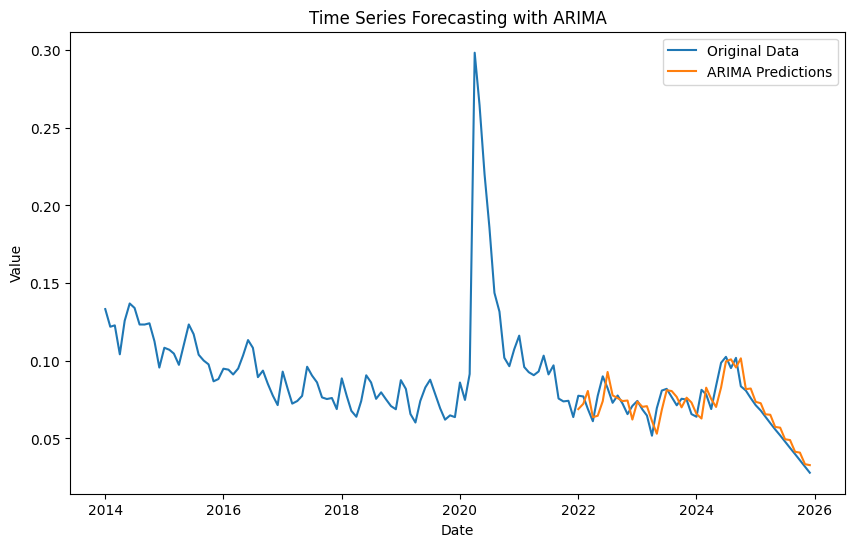

ARIMA - MSE: 8.252364904810128e-05, RMSE: 0.009084252806263226, MAPE: 9.95%


In [378]:
model_arima(data_filtered,'United States of America', '15-24', 'Female')

## 15-24, Total

In [379]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Total')

In [380]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6273
Weak or no seasonality detected.


(0.6273078549196838, False)

In [381]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-595.332, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-625.071, Time=0.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-594.153, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-633.015, Time=0.38 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.63 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.39 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-634.043, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-626.251, Time=0.36 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-633.660, Time=0.36 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-635.981, Time=1.60 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-627.6

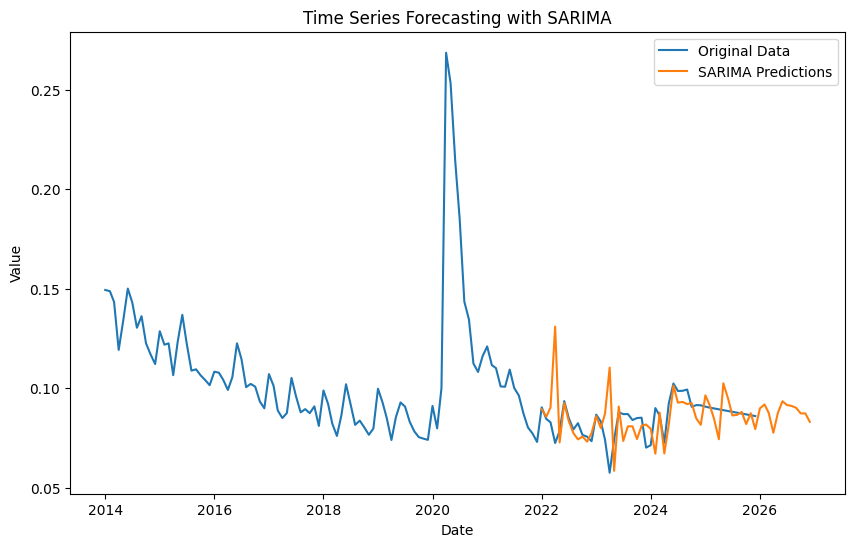

SARIMA - MSE: 0.00018602507625930422, RMSE: 0.013639101006272525, MAPE: 10.26%


In [382]:
model_sarima(data_filtered,'United States of America', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-649.792, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-665.318, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-651.792, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-689.542, Time=0.11 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-693.552, Time=0.18 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-729.724, Time=0.52 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-734.103, Time=0.32 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-726.771, Time=0.84 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-728.646, Time=0.14 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-727.733, Time=0.29 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.26 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 4.123 seconds
                               SARIMA

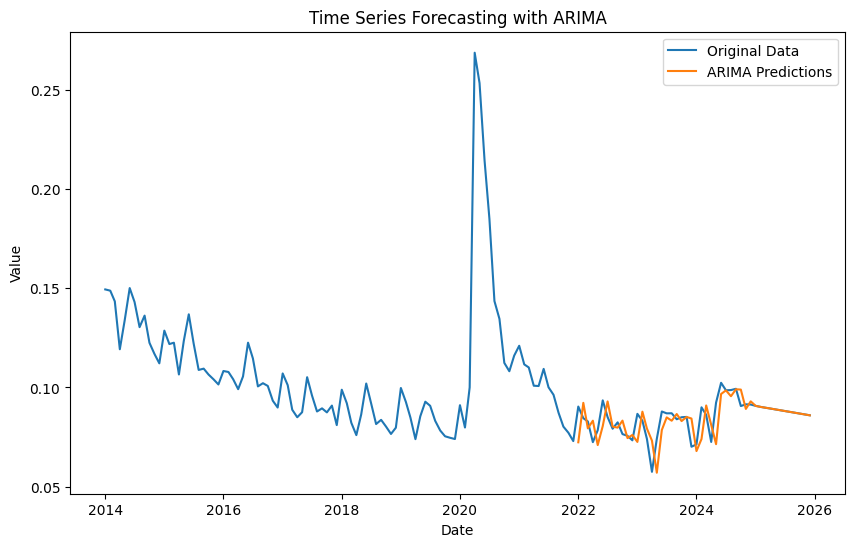

ARIMA - MSE: 9.345936961454229e-05, RMSE: 0.009667438627399829, MAPE: 9.67%


In [383]:
model_arima(data_filtered,'United States of America', '15-24', 'Total')

## 25+, Male

In [384]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Male')

In [385]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7139
Strong seasonality detected.


(0.7139088934604778, True)

In [386]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-806.167, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-836.261, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-863.858, Time=1.02 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-804.291, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-835.965, Time=0.18 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.45 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-867.637, Time=1.48 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-802.023, Time=0.11 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-863.168, T

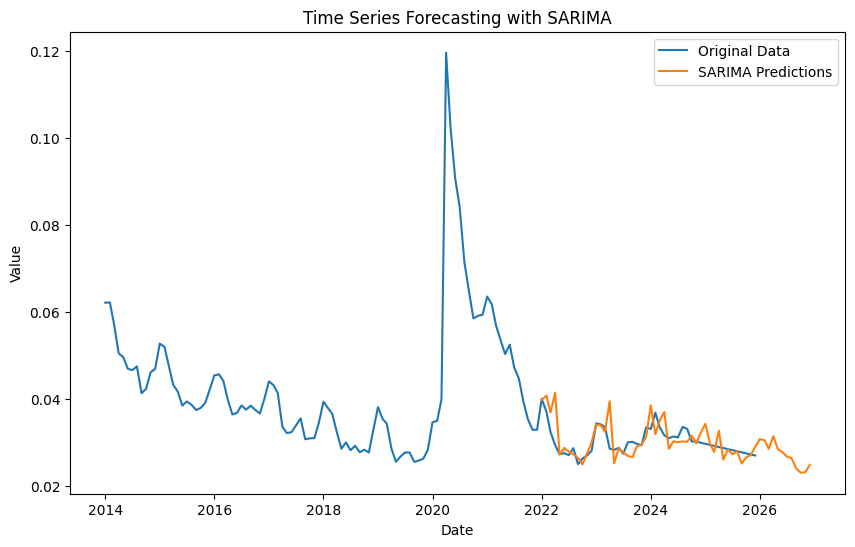

SARIMA - MSE: 1.0936540048541965e-05, RMSE: 0.00330704400462739, MAPE: 7.29%


In [387]:
model_sarima(data_filtered,'United States of America', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-877.213, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-912.459, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-972.005, Time=0.43 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-879.213, Time=0.02 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-959.892, Time=0.06 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-955.871, Time=0.67 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,2,1)(0,0,0)[0] intercept
Total fit time: 2.628 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Model:               SARIMAX(0, 2, 1)   Log Likelihood                 489.003
Date:                Mon, 09 Dec 2024   AIC                           -972.005
Time:                        12:56:21   BIC   

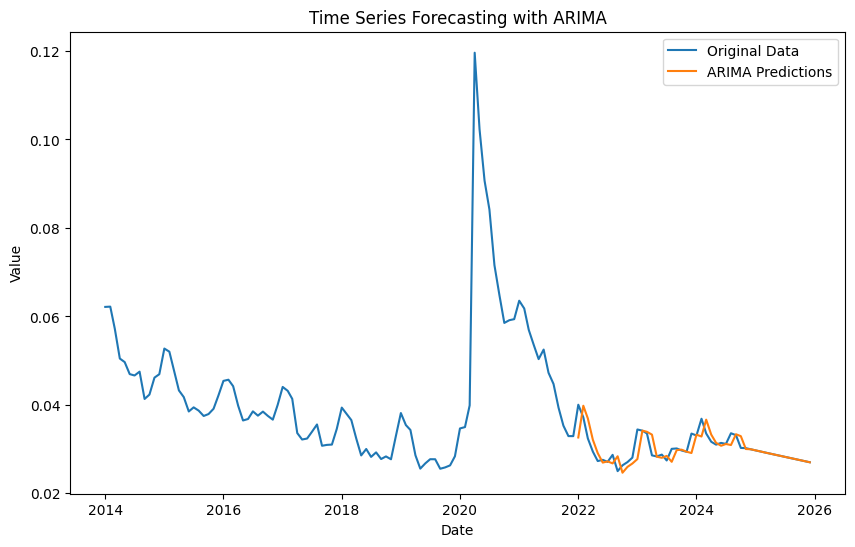

ARIMA - MSE: 7.98606247391882e-06, RMSE: 0.0028259622208937647, MAPE: 6.36%


In [388]:
model_arima(data_filtered,'United States of America', '25+', 'Male')

## 25+, Female

In [389]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Female')

In [390]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6585
Weak or no seasonality detected.


(0.658474585284812, False)

In [391]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-738.900, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-768.607, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-736.902, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-782.347, Time=0.62 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-784.319, Time=0.54 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-770.900, Time=0.20 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-793.318, Time=0.66 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=1.38 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-792.819, T

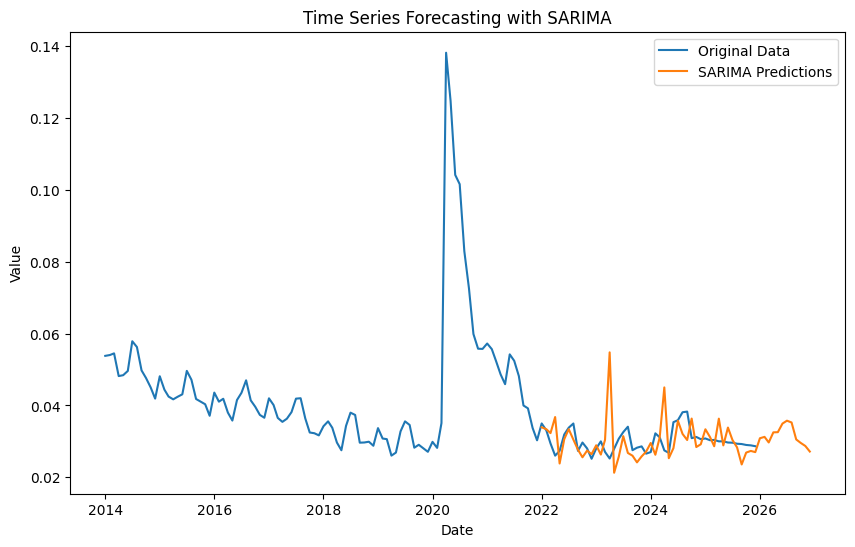

SARIMA - MSE: 3.9223537189695274e-05, RMSE: 0.0062628697247903275, MAPE: 13.24%


In [392]:
model_sarima(data_filtered,'United States of America', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-881.143, Time=0.52 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-811.249, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-836.719, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-872.170, Time=0.06 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-813.249, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-899.047, Time=0.16 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-859.798, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-894.231, Time=0.63 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-887.434, Time=0.38 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-897.854, Time=0.35 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-861.698, Time=0.21 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-891.266, Time=0.13 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.17 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 2.838 seconds
                           

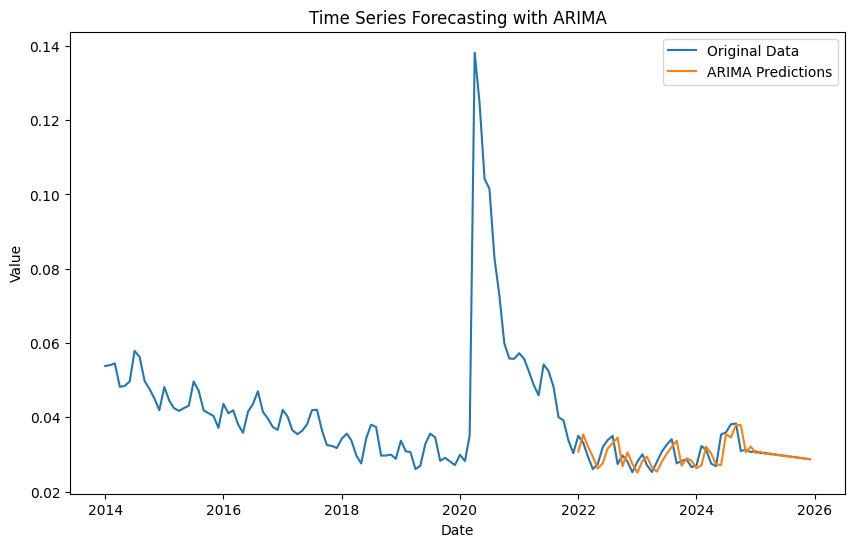

ARIMA - MSE: 1.1052667780769134e-05, RMSE: 0.0033245552756375, MAPE: 9.27%


In [393]:
model_arima(data_filtered,'United States of America', '25+', 'Female')

## 25+, Total

In [394]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Total')

In [395]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6836
Weak or no seasonality detected.


(0.6835889785204996, False)

In [396]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-774.797, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-804.876, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-772.801, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-815.405, Time=0.94 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-835.644, Time=1.47 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.39 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.27 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-832.124, Time=1.81 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-835.877, Time=1.60 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-835.180, Time=1.22 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-815.377, Time=0.98 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=i

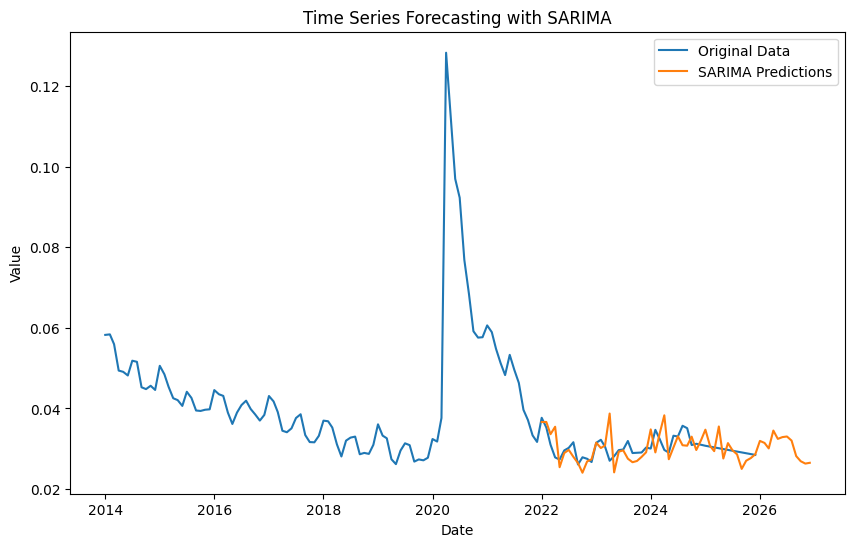

SARIMA - MSE: 1.1595981076624237e-05, RMSE: 0.0034052872238071546, MAPE: 7.99%


In [397]:
model_sarima(data_filtered,'United States of America', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-916.938, Time=0.08 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-848.236, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-878.093, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-850.236, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-931.331, Time=0.64 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-899.398, Time=0.15 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-937.124, Time=0.43 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-901.731, Time=0.09 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-926.507, Time=0.11 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-936.828, Time=0.49 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-937.737, Time=0.43 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-903.729, Time=0.17 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-

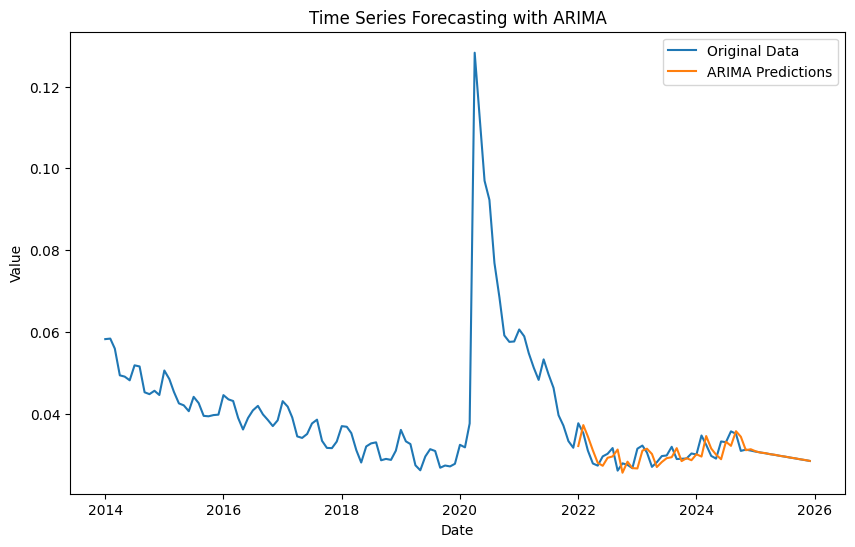

ARIMA - MSE: 7.022068096800068e-06, RMSE: 0.0026499185075771797, MAPE: 6.93%


In [398]:
model_arima(data_filtered,'United States of America', '25+', 'Total')

# Germany

## 15-24 Male

In [399]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Male')


In [400]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9841
Strong seasonality detected.


(0.9841353491633935, True)

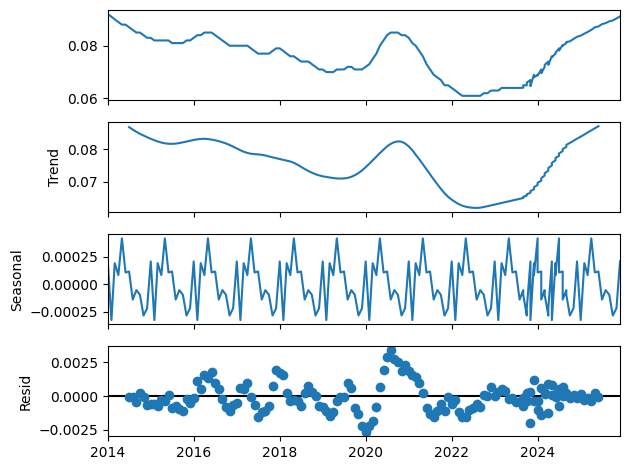

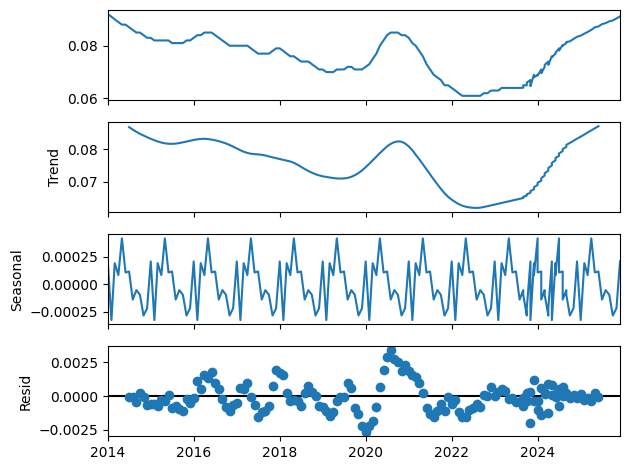

In [401]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [402]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1504.723, Time=1.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1339.591, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1490.810, Time=0.29 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1442.940, Time=0.71 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1469.108, Time=0.45 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1493.301, Time=0.89 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1465.108, Time=1.38 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1494.146, Time=0.33 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1493.373, Time=1.44 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1499.748, Time=0.31 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1503.538, Time=0.94 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1505.573, Time=1.38 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1470.624, Time=0.18 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1494.380, Time=1.20 sec
 ARIM

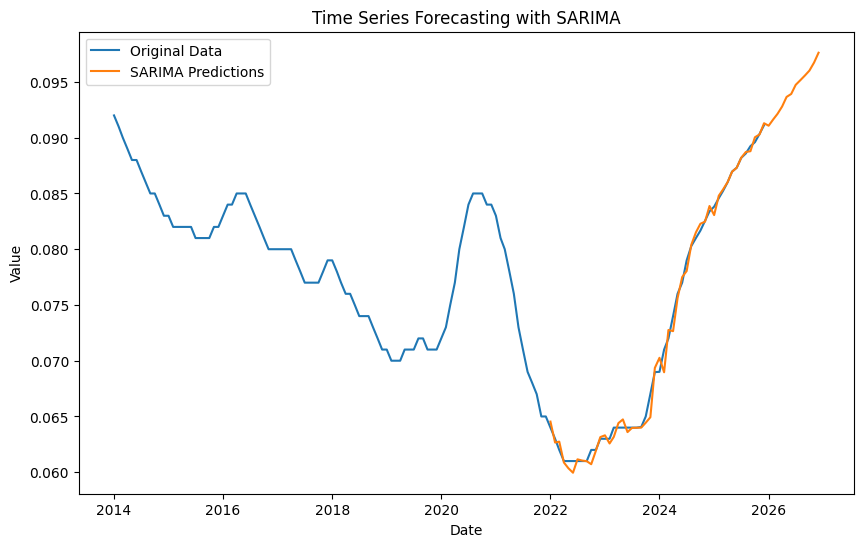

SARIMA - MSE: 4.619914386858551e-07, RMSE: 0.0006796995208809958, MAPE: 0.68%


In [403]:
model_sarima(data_filtered,'Germany', '15-24', 'Male')


## 15-24 Female

In [404]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Female')


In [405]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9671
Strong seasonality detected.


(0.9670847612234973, True)

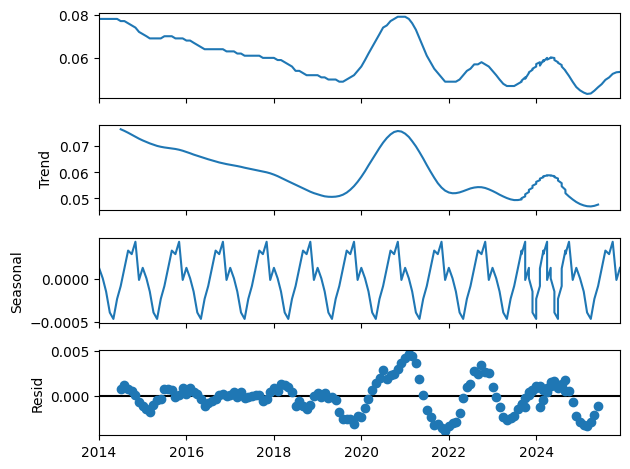

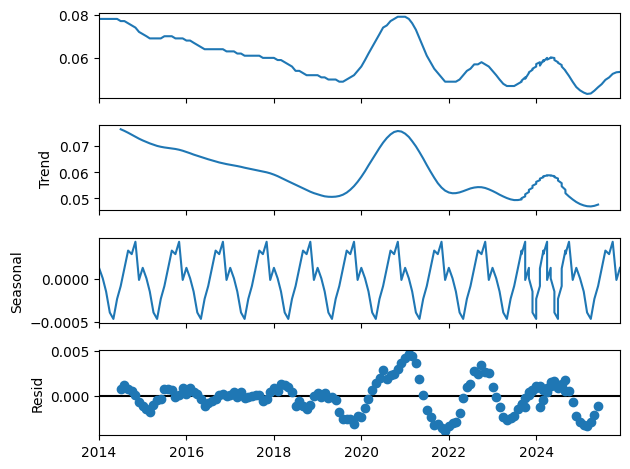

In [406]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [407]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1188.788, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1424.365, Time=0.30 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1399.584, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1425.827, Time=0.52 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1431.287, Time=1.46 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1425.764, Time=0.15 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-1420.758, Time=1.49 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-1288.043, Time=0.56 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-1434.746, Time=1.77 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-1428.989, Time=0.46 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-1430.032, Time=0.45 sec
 ARIMA(2,1,0)(2,1,2)[12

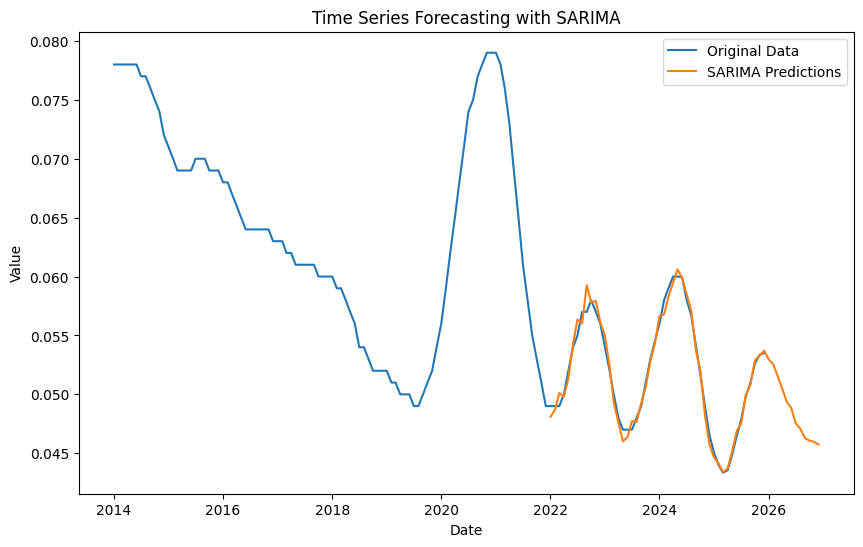

SARIMA - MSE: 4.410354092321839e-07, RMSE: 0.0006641049685344809, MAPE: 0.99%


In [408]:
model_sarima(data_filtered,'Germany', '15-24', 'Female')


## 15-24 Total

In [409]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Total')


In [410]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9791
Strong seasonality detected.


(0.9791030760174735, True)

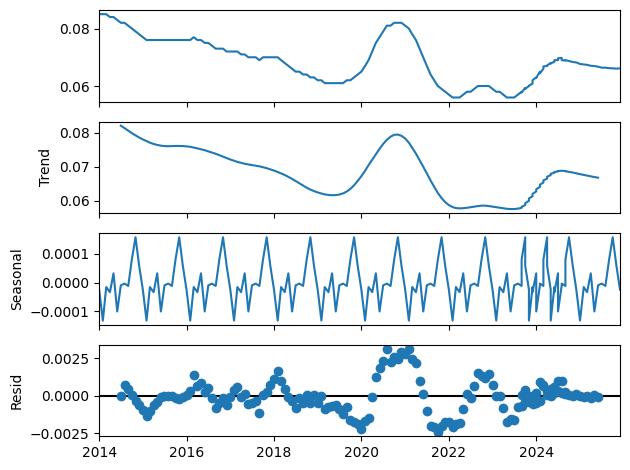

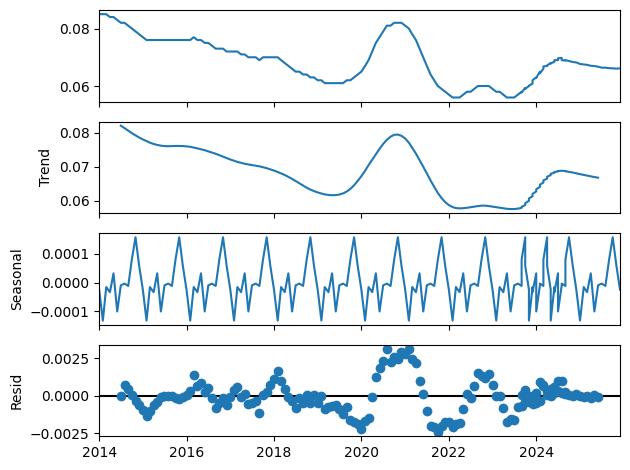

In [411]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [412]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1516.943, Time=0.70 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1285.150, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1467.679, Time=0.52 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1430.091, Time=0.89 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1442.905, Time=0.23 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1482.605, Time=0.84 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1438.902, Time=0.97 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1481.045, Time=0.53 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1473.798, Time=1.39 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1504.678, Time=0.29 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1517.474, Time=0.65 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1446.385, Time=0.19 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1479.688, Time=1.03 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1442.386, Time=1.80 sec
 ARIM

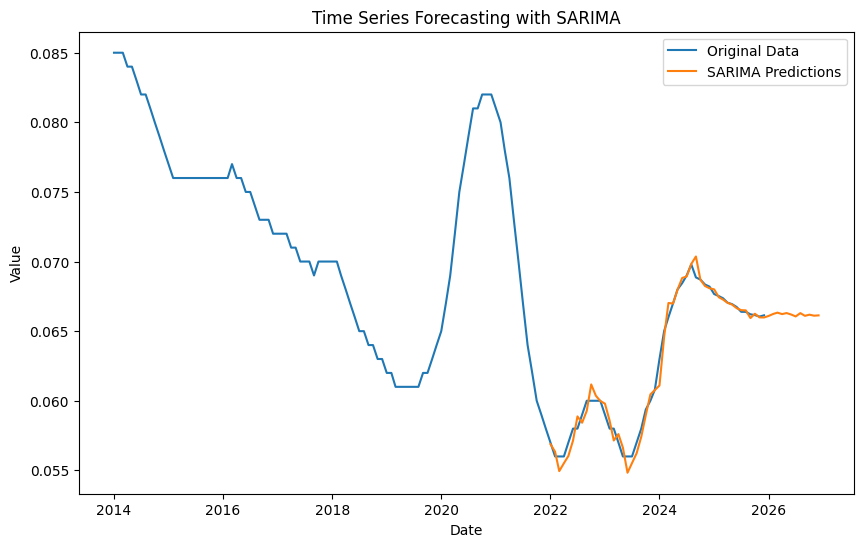

SARIMA - MSE: 4.003529488898098e-07, RMSE: 0.0006327345011059613, MAPE: 0.76%


In [413]:
model_sarima(data_filtered,'Germany', '15-24', 'Total')


## 25+ Male

In [414]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Male')


In [415]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9904
Strong seasonality detected.


(0.9903516515627208, True)

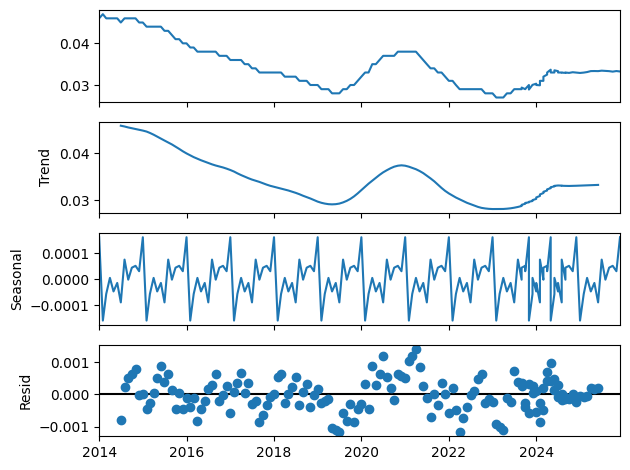

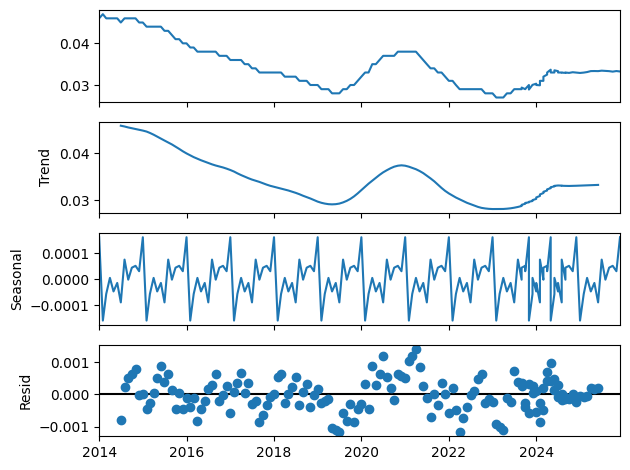

In [416]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [417]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1527.994, Time=6.47 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1469.559, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1493.029, Time=2.63 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1517.007, Time=6.87 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1480.471, Time=3.08 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1513.932, Time=9.39 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1476.461, Time=7.01 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1502.182, Time=13.89 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=11.35 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1518.738, Time=10.14 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1535.727, Time=8.94 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1487.815, Time=1.97 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1522.100, Time=10.14 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1483.826, Time=11.23 sec
 ARIMA

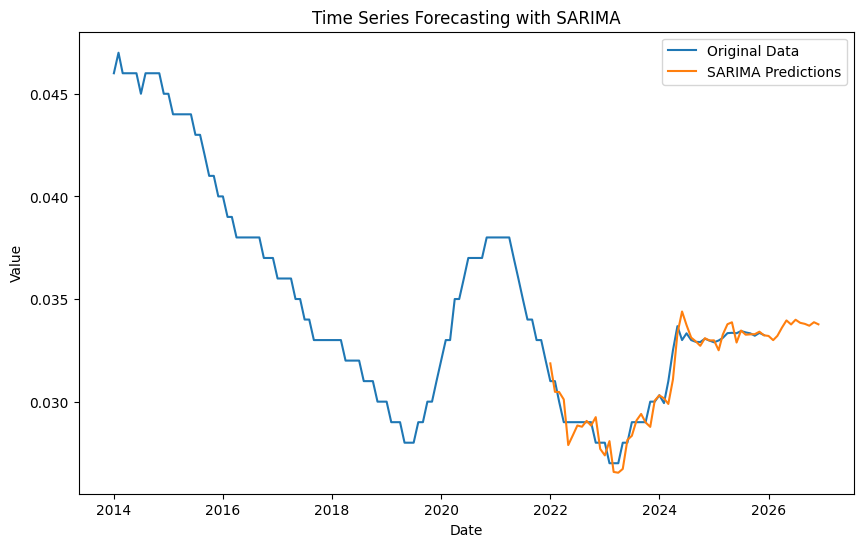

SARIMA - MSE: 3.769876386984907e-07, RMSE: 0.0006139931910847958, MAPE: 1.46%


In [418]:
model_sarima(data_filtered,'Germany', '25+', 'Male')


## 25+ Female

In [419]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Female')


In [420]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9864
Strong seasonality detected.


(0.9864263117678655, True)

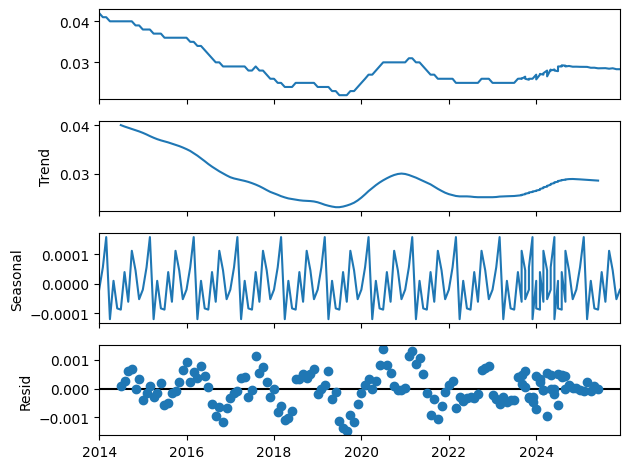

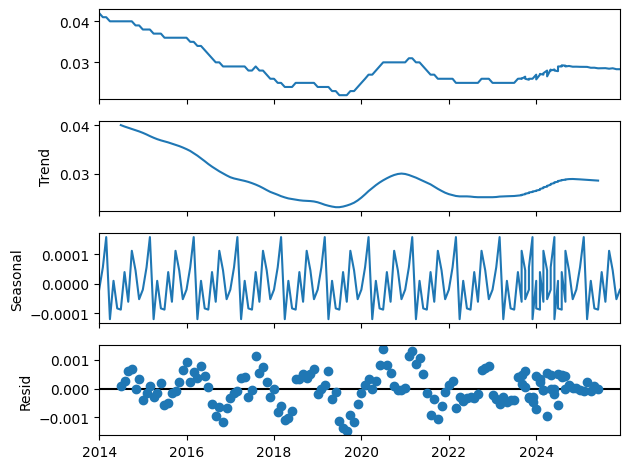

In [421]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [422]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1565.169, Time=3.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1485.175, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1530.962, Time=2.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1555.859, Time=2.70 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1495.635, Time=0.60 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1557.578, Time=3.69 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.83 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1536.078, Time=0.72 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1521.514, Time=7.80 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1558.993, Time=1.09 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1565.505, Time=3.24 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1496.979, Time=1.92 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1557.252, Time=8.45 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=4.06 sec
 ARIMA(2,1,1)(1,1

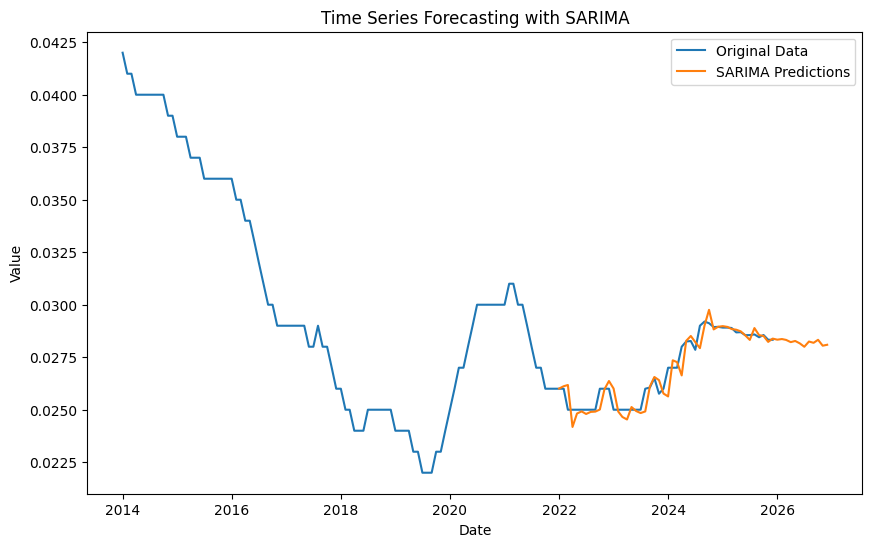

SARIMA - MSE: 2.5529965961087063e-07, RMSE: 0.0005052718670289002, MAPE: 1.23%


In [423]:
model_sarima(data_filtered,'Germany', '25+', 'Female')


## 25+ Total

In [424]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Total')

In [425]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9904
Strong seasonality detected.


(0.9904410866087575, True)

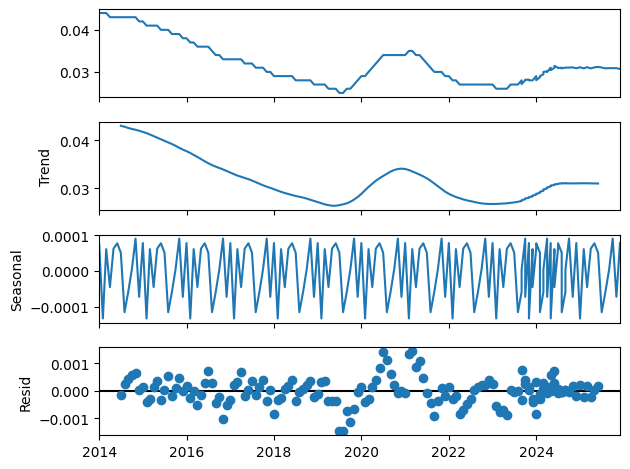

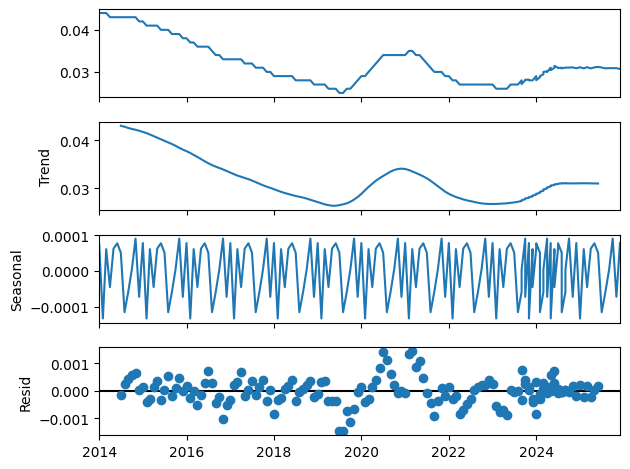

In [426]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [427]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1580.340, Time=3.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1499.773, Time=0.21 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1531.419, Time=2.83 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1566.562, Time=2.18 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1444.799, Time=2.24 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1522.623, Time=2.53 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1578.433, Time=8.24 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1541.497, Time=3.65 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1581.073, Time=9.52 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1554.364, Time=6.86 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1576.852, Time=8.88 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1562.472, Time=1.48 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1566.705, Time=2.24 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1549.553, Time=3.02 sec
 ARIM

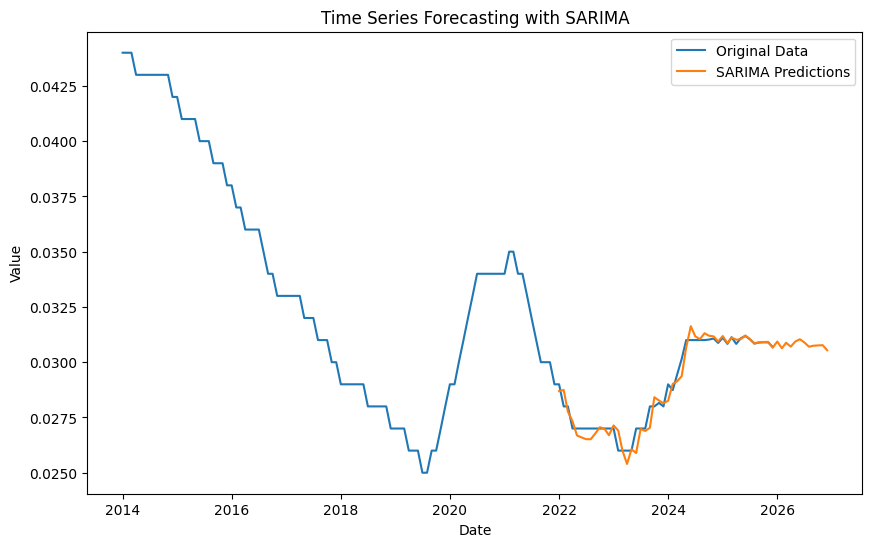

SARIMA - MSE: 1.5266512560354703e-07, RMSE: 0.00039072384826568626, MAPE: 0.95%


In [428]:
model_sarima(data_filtered,'Germany', '25+', 'Total')


# Ireland

## 15-24 Male

In [429]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Male')


In [430]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9340
Strong seasonality detected.


(0.9340029731825666, True)

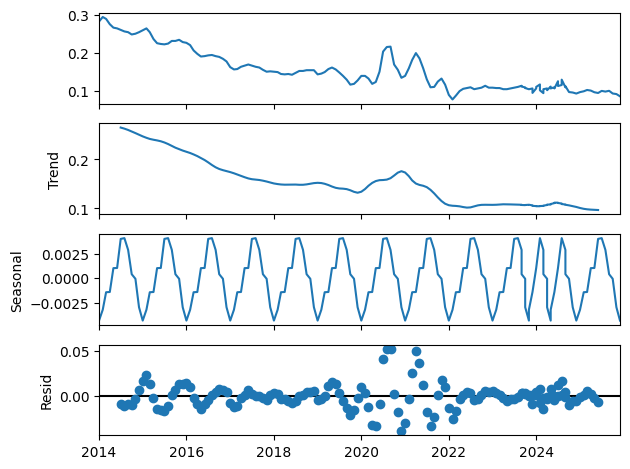

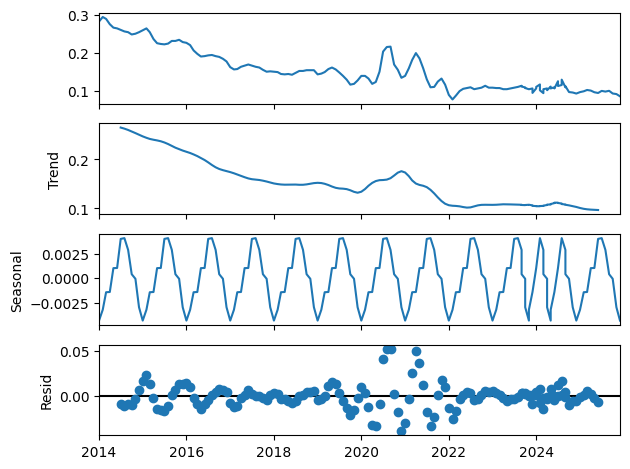

In [431]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [432]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=3.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-690.854, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-772.464, Time=1.38 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.63 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-727.135, Time=0.11 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-786.111, Time=2.35 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-802.731, Time=10.95 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-808.972, Time=4.77 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=5.79 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=4.30 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-805.652, Time=11.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=3.20 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-817.715, Time=3.76 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf,

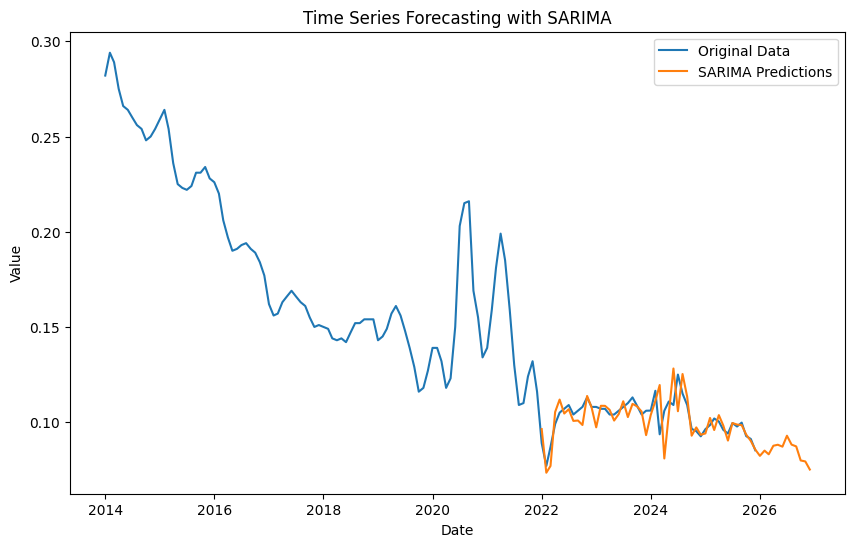

SARIMA - MSE: 6.498138453127379e-05, RMSE: 0.008061103183266779, MAPE: 5.18%


In [433]:
model_sarima(data_filtered,'Ireland', '15-24', 'Male')


## 15-24 Female

In [434]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Female')

In [435]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.8803
Strong seasonality detected.


(0.880255984895202, True)

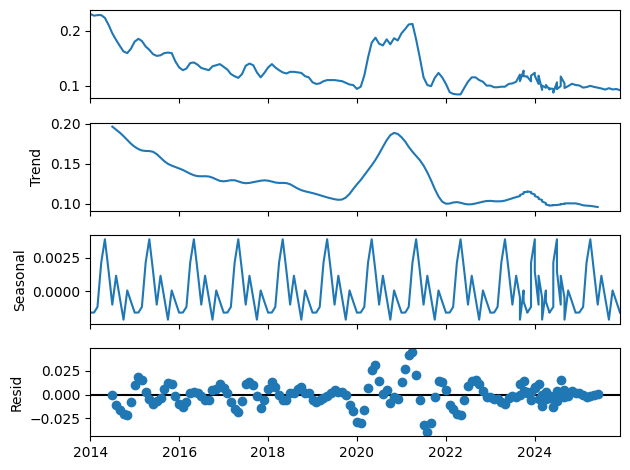

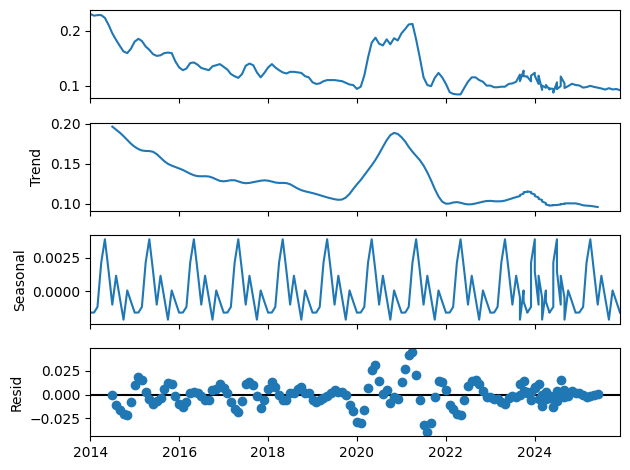

In [436]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [437]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-857.787, Time=4.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-738.590, Time=0.22 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-825.851, Time=1.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=5.82 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-793.331, Time=0.72 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-855.001, Time=2.89 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=2.38 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-829.468, Time=0.97 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=4.82 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.61 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-860.904, Time=2.08 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-798.010, Time=0.68 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-859.185, Time=2.65 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=2.49 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-

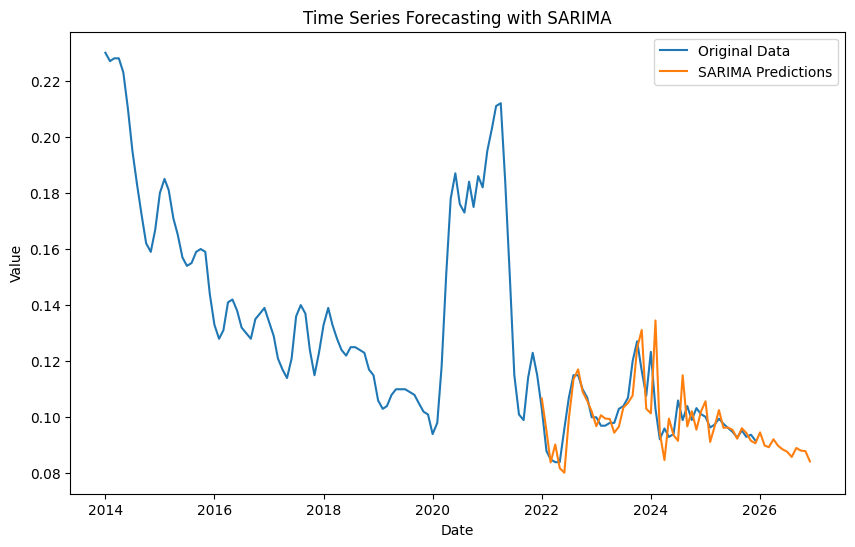

SARIMA - MSE: 6.704047855055183e-05, RMSE: 0.008187825019536741, MAPE: 5.15%


In [438]:
model_sarima(data_filtered,'Ireland', '15-24', 'Female')

## 15-24 Total

In [439]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Total')


In [440]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9385
Strong seasonality detected.


(0.9384699070019583, True)

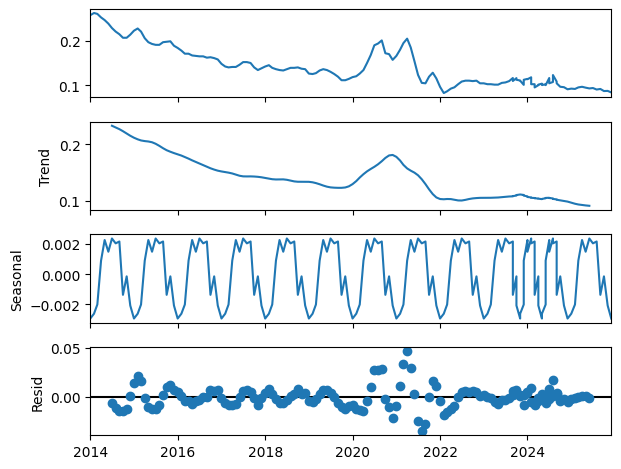

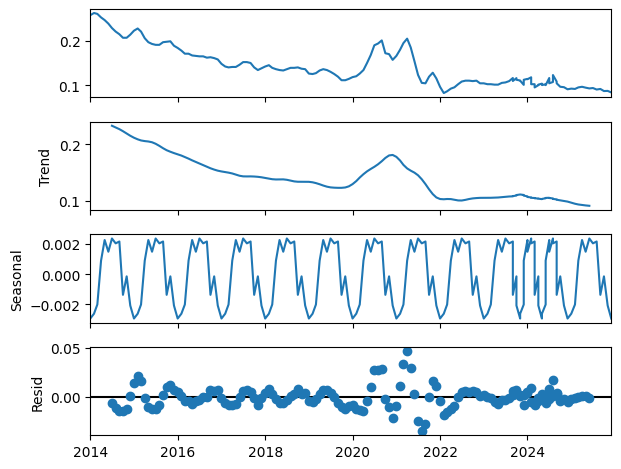

In [441]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [442]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-758.278, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-845.302, Time=0.40 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-802.926, Time=0.12 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-864.448, Time=1.95 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-873.940, Time=3.19 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-878.034, Time=2.34 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=2.34 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-881.477, Time=2.53 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-847.747, Time=1.16 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-882.303, Time=1.90 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=i

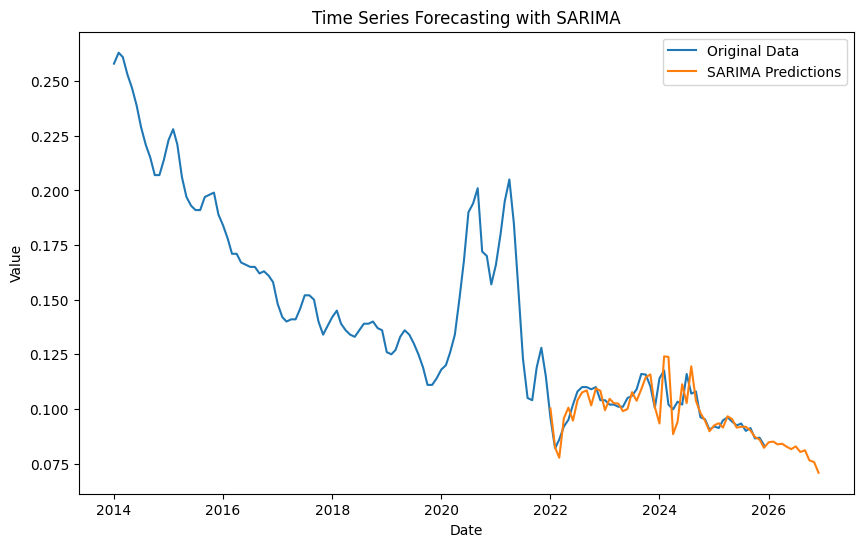

SARIMA - MSE: 4.3446804305999797e-05, RMSE: 0.006591418990323692, MAPE: 4.33%


In [443]:
model_sarima(data_filtered,'Ireland', '15-24', 'Total')

## 25+ Male

In [444]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Male')

In [445]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9914
Strong seasonality detected.


(0.9913754975267901, True)

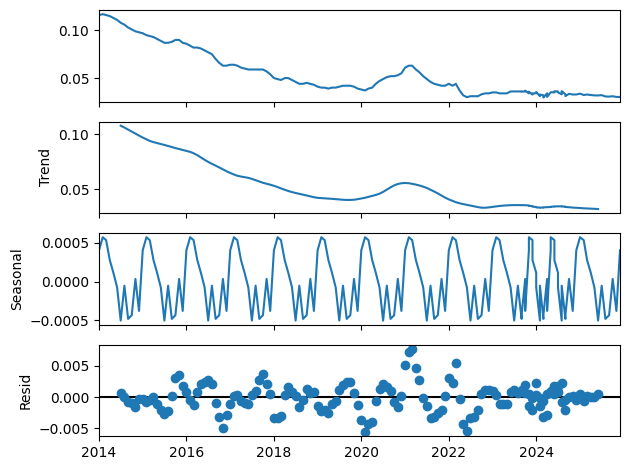

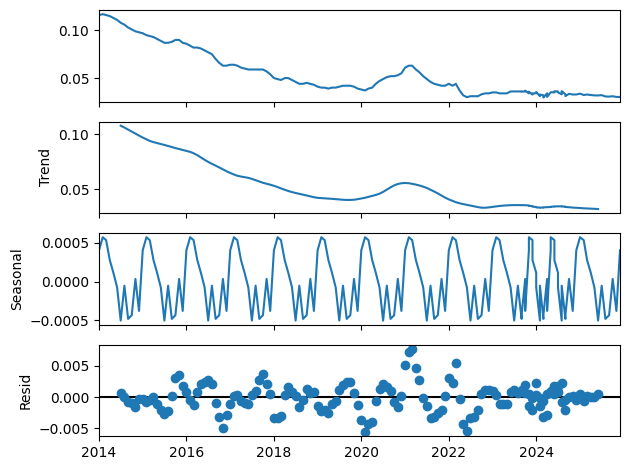

In [446]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [447]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1286.106, Time=3.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1185.290, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1270.829, Time=0.39 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1264.979, Time=0.33 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1234.536, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1279.541, Time=1.38 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1230.537, Time=1.48 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1269.641, Time=0.47 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.68 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1287.968, Time=0.90 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1236.081, Time=0.14 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1281.098, Time=0.40 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1232.081, Time=0.42 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,1

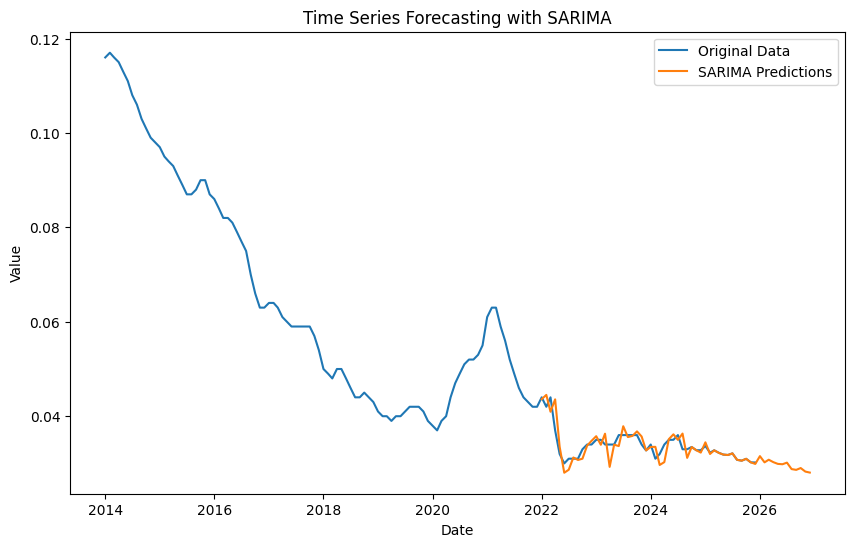

SARIMA - MSE: 3.3579461970624135e-06, RMSE: 0.0018324699716673158, MAPE: 3.41%


In [448]:

model_sarima(data_filtered,'Ireland', '25+', 'Male')

## 25+ Female

In [449]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Female')

In [450]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9708
Strong seasonality detected.


(0.9708131463344161, True)

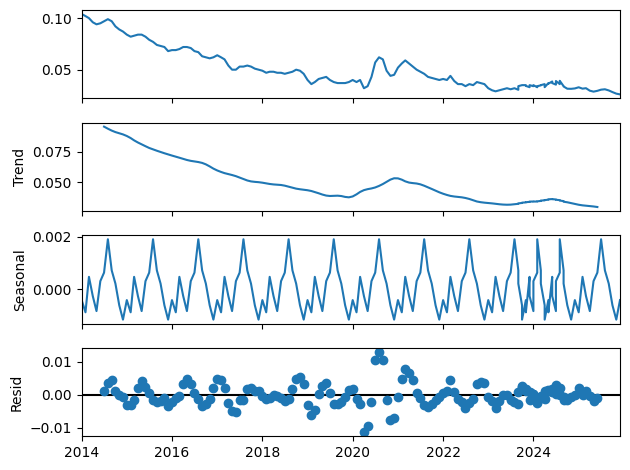

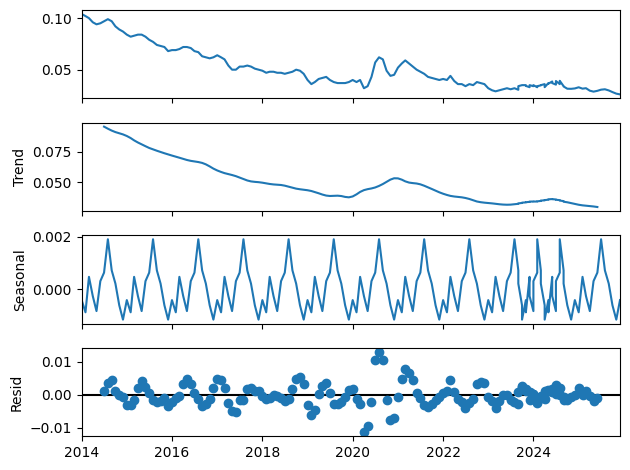

In [451]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [452]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1149.937, Time=1.11 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1062.100, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1110.992, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1151.427, Time=0.34 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1091.538, Time=0.20 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1129.888, Time=0.91 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1135.912, Time=2.07 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1112.472, Time=0.27 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1146.221, Time=1.96 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1124.158, Time=0.37 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1162.801, Time=0.89 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-1101.958, Time=0.20 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1163.397, Time=1.96 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-1124.493, Time=0.68 sec
 ARIM

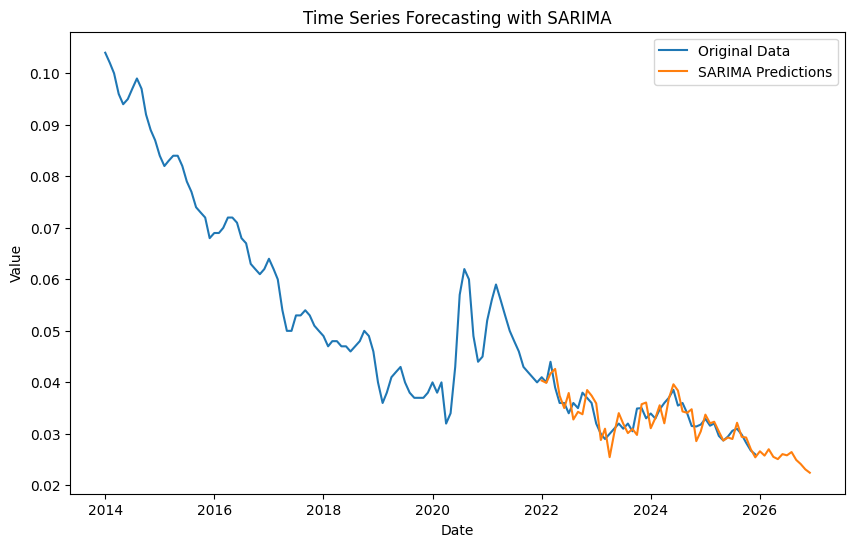

SARIMA - MSE: 4.615627278003359e-06, RMSE: 0.0021484010980269393, MAPE: 4.92%


In [453]:
model_sarima(data_filtered,'Ireland', '25+', 'Female')

## 25+ Total


In [454]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Total')


In [455]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9887
Strong seasonality detected.


(0.9887412724931512, True)

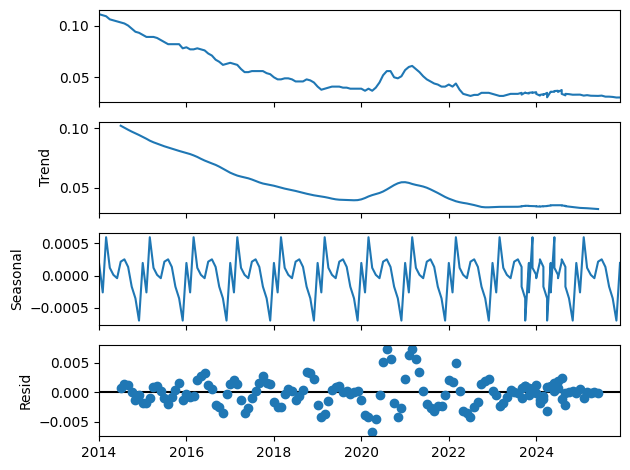

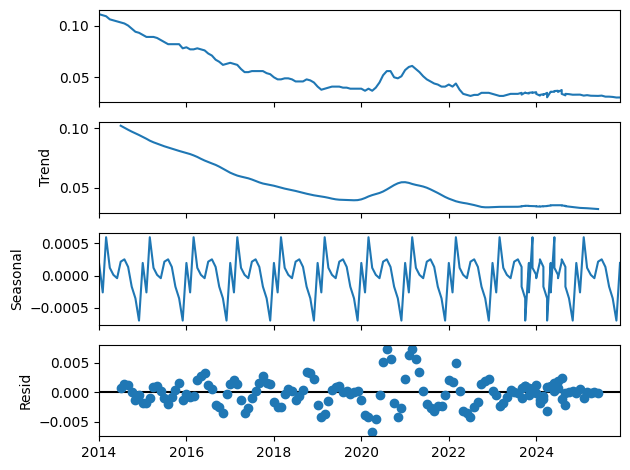

In [456]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [457]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1239.808, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1159.341, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1207.074, Time=0.50 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1236.420, Time=0.39 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1177.474, Time=0.12 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1230.815, Time=0.60 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1173.525, Time=0.80 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1205.592, Time=0.62 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1199.750, Time=0.80 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1241.527, Time=0.69 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1179.275, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1232.439, Time=0.52 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1175.275, Time=0.81 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1201.292, Time=0.58 sec
 ARIM

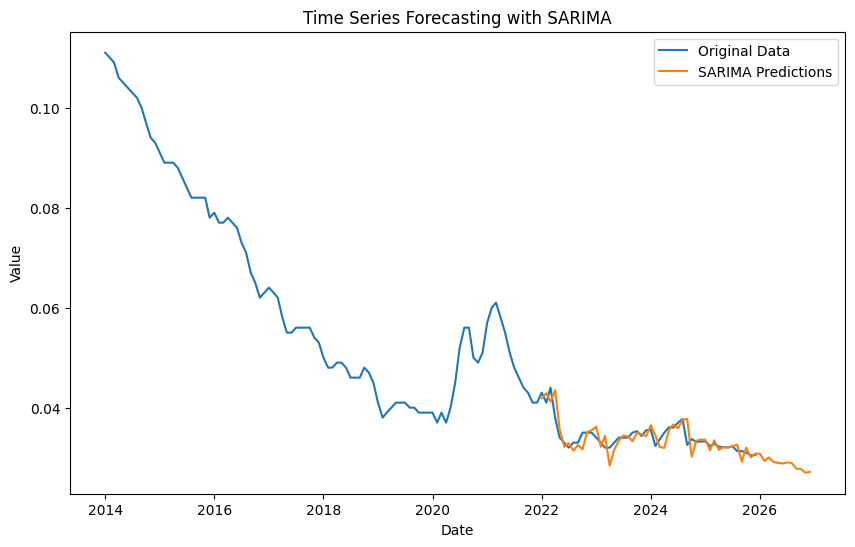

SARIMA - MSE: 3.351156094743097e-06, RMSE: 0.0018306163155459684, MAPE: 3.82%


In [458]:
model_sarima(data_filtered,'Ireland', '25+', 'Total')


# Netherlands

## 15-24 Male

In [459]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Male')


In [460]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9647
Strong seasonality detected.


(0.9647109205038693, True)

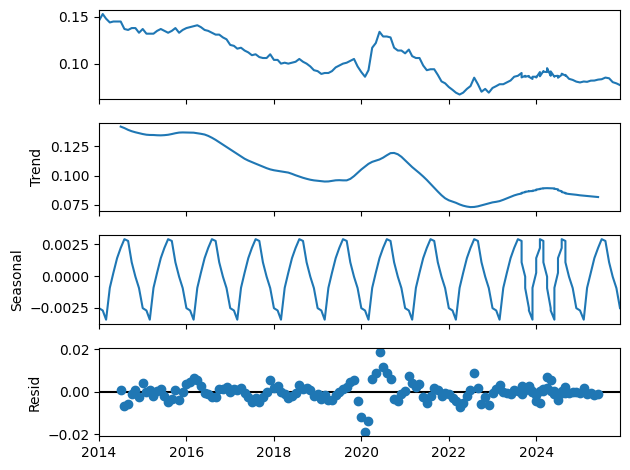

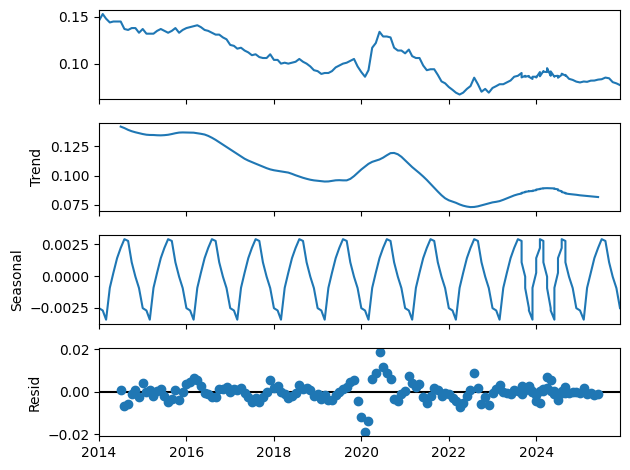

In [461]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [462]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1035.429, Time=0.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-977.713, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1010.152, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1036.094, Time=0.63 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-980.129, Time=0.25 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1024.653, Time=1.30 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.40 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1008.646, Time=0.53 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1035.293, Time=2.38 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1035.151, Time=0.79 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1037.443, Time=0.97 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-984.396, Time=0.14 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1026.217, Time=1.33 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=3.30 sec
 ARIMA(0,1,2)(1,1,0)

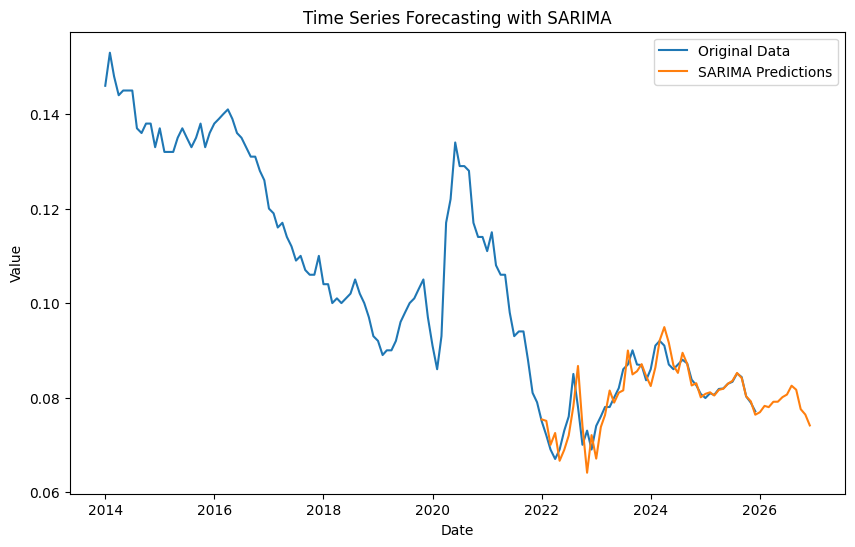

SARIMA - MSE: 1.0717862384616644e-05, RMSE: 0.003273814653369467, MAPE: 2.90%


In [463]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Male')

## 15-24 Female

In [464]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Female')

In [465]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9555
Strong seasonality detected.


(0.9555401465677543, True)

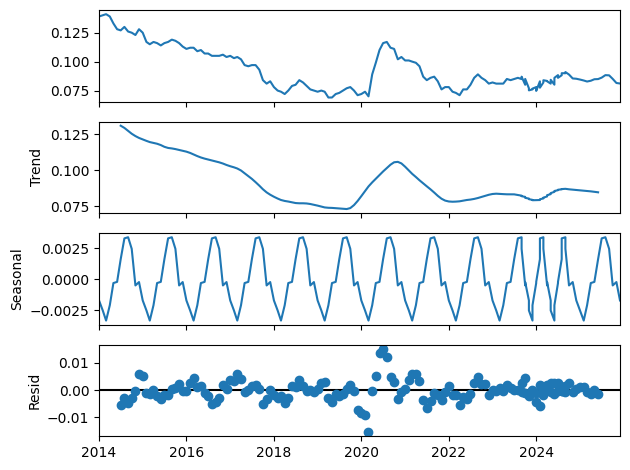

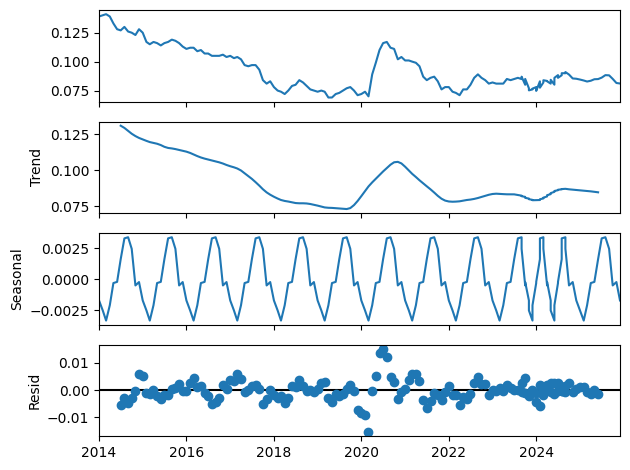

In [466]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [467]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1082.301, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1003.575, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1046.710, Time=0.29 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1080.643, Time=1.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1015.403, Time=0.26 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1070.951, Time=0.95 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1072.129, Time=1.80 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1045.961, Time=0.39 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2.05 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1083.516, Time=0.67 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1016.993, Time=0.14 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1085.244, Time=1.95 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1081.647, Time=2.12 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=2.02 sec
 ARIMA(1,1,0)(0,1

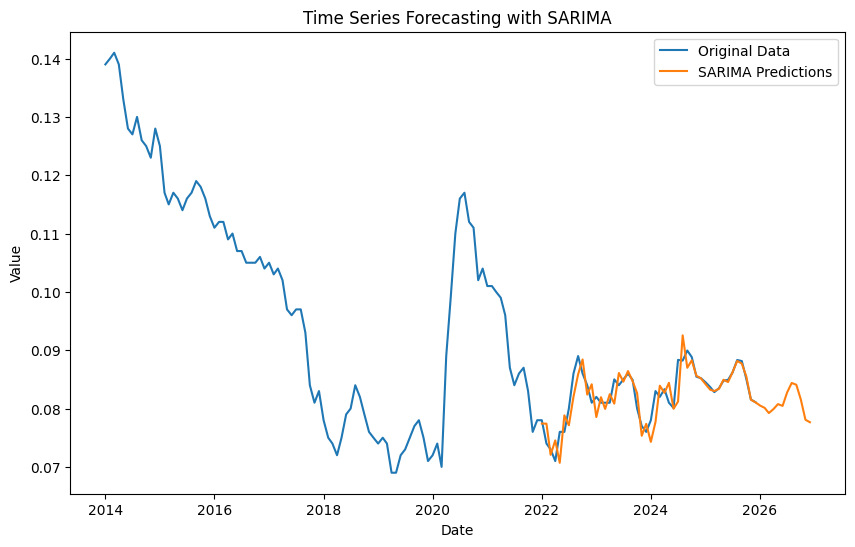

SARIMA - MSE: 6.2700301313519916e-06, RMSE: 0.0025040028217539994, MAPE: 2.21%


In [468]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Female')

## 15-24 Total

In [469]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Total')

In [470]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9642
Strong seasonality detected.


(0.9642004382049486, True)

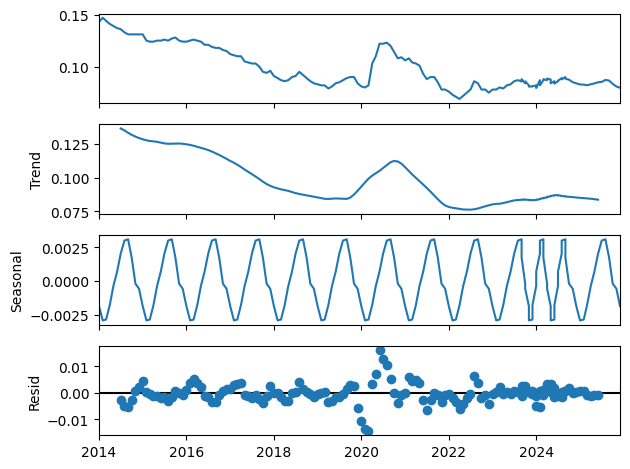

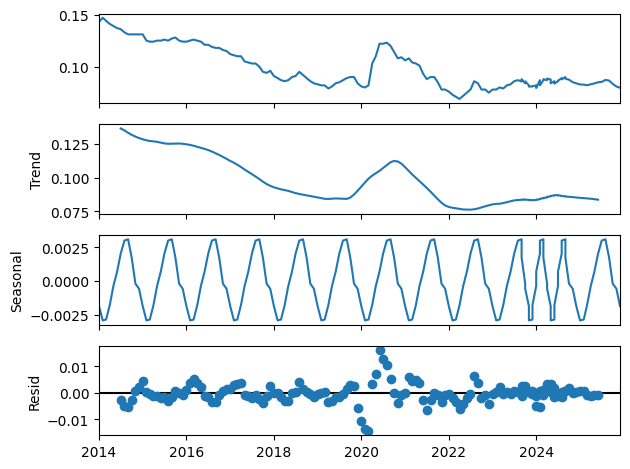

In [471]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [472]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1104.570, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1025.834, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1071.118, Time=0.78 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1099.163, Time=0.66 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1040.744, Time=0.13 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1098.783, Time=1.76 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1099.588, Time=2.78 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1070.237, Time=0.67 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=3.07 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1105.634, Time=0.43 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1041.554, Time=0.21 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1087.041, Time=0.36 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1037.555, Time=0.99 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=3.26 sec
 ARIMA(0,1,0)(0,1

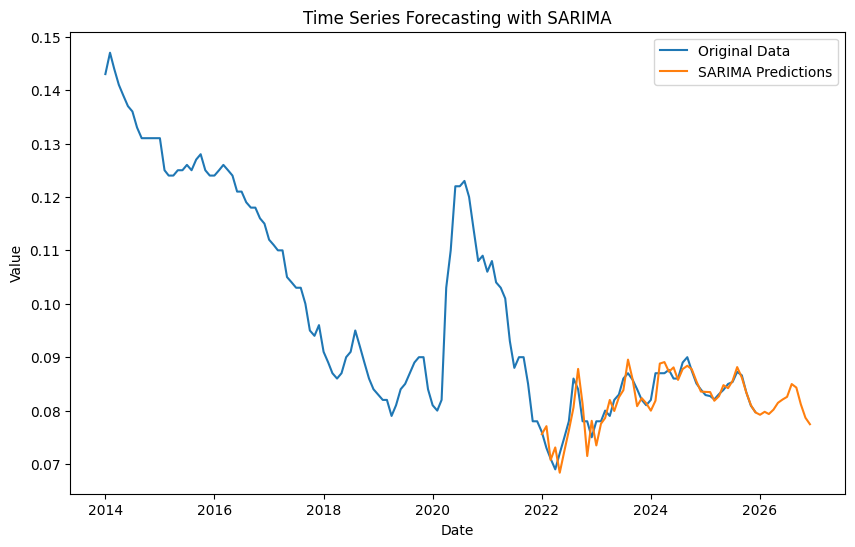

SARIMA - MSE: 5.646558878544833e-06, RMSE: 0.0023762489092148645, MAPE: 2.14%


In [473]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Total')

## 25+ Male

In [474]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Male')

In [475]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9940
Strong seasonality detected.


(0.9940025525957736, True)

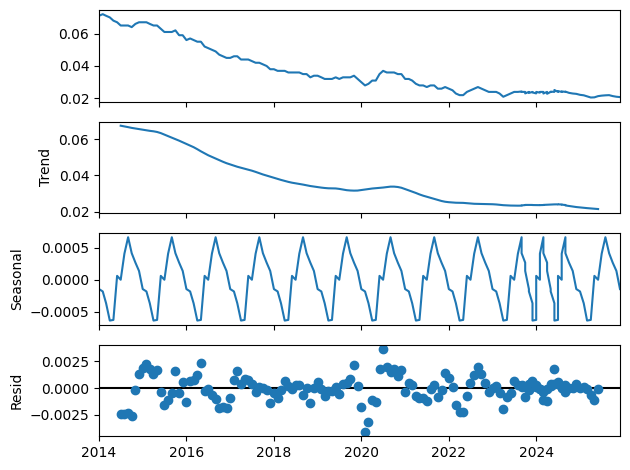

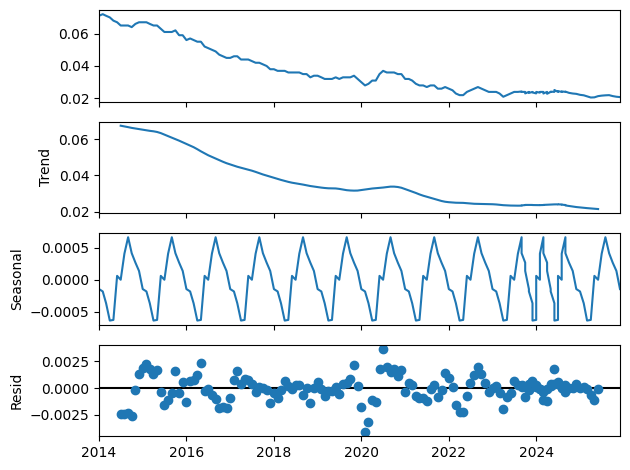

In [476]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [477]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1381.598, Time=1.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1334.343, Time=0.16 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1370.358, Time=1.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1383.688, Time=0.41 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1332.348, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1377.869, Time=0.43 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.94 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1370.378, Time=0.51 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1380.255, Time=1.77 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1385.499, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1379.724, Time=0.21 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1372.297, Time=0.40 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1381.930, Time=1.63 sec
 ARIMA(1,1,0)(0,1

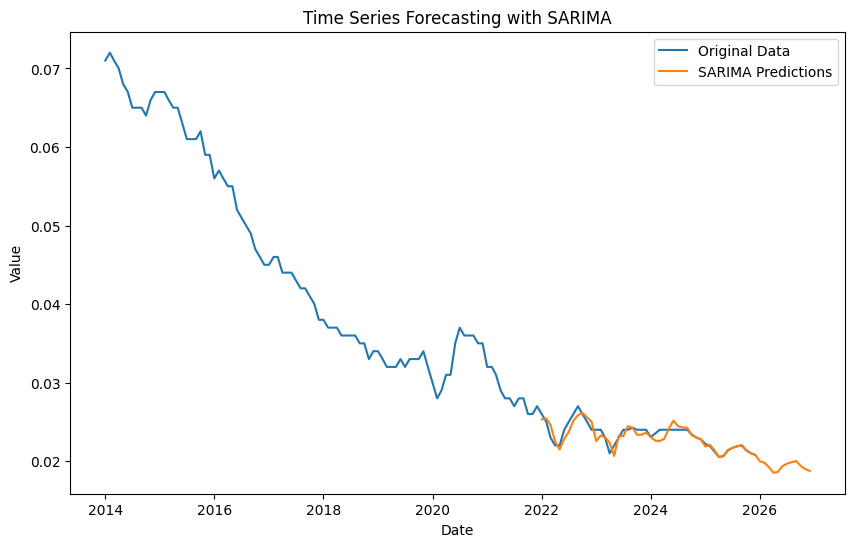

SARIMA - MSE: 5.059099085660458e-07, RMSE: 0.0007112734414879033, MAPE: 2.16%


In [478]:
model_sarima(data_filtered,'Netherlands', '25+', 'Male')

## 25+ Female

In [479]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Female')

In [480]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9929
Strong seasonality detected.


(0.9928516343501148, True)

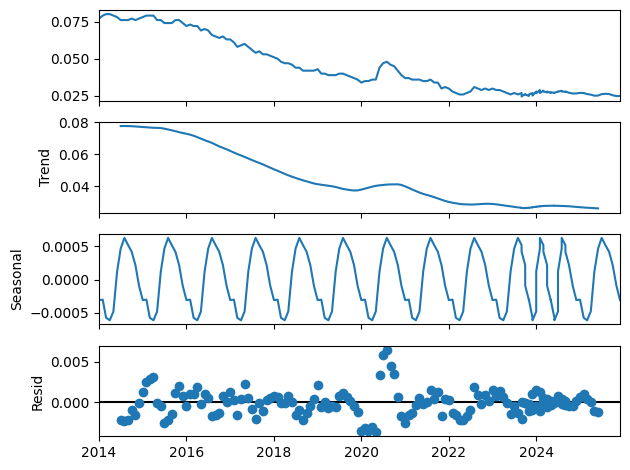

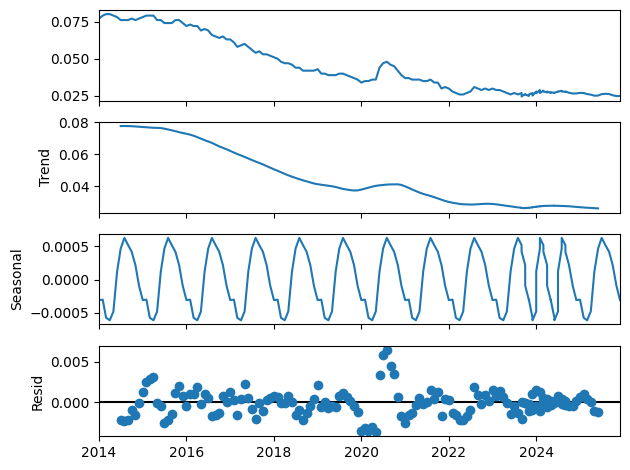

In [481]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [482]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1299.651, Time=1.41 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1265.220, Time=0.14 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1287.259, Time=0.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1301.602, Time=0.78 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1263.234, Time=0.13 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1290.767, Time=0.92 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1259.234, Time=0.45 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1287.230, Time=0.59 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.36 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1303.939, Time=0.40 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1293.089, Time=0.40 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1261.218, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1289.463, Time=0.14 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=1.35 sec
 ARIMA(1,1,0)(0,1

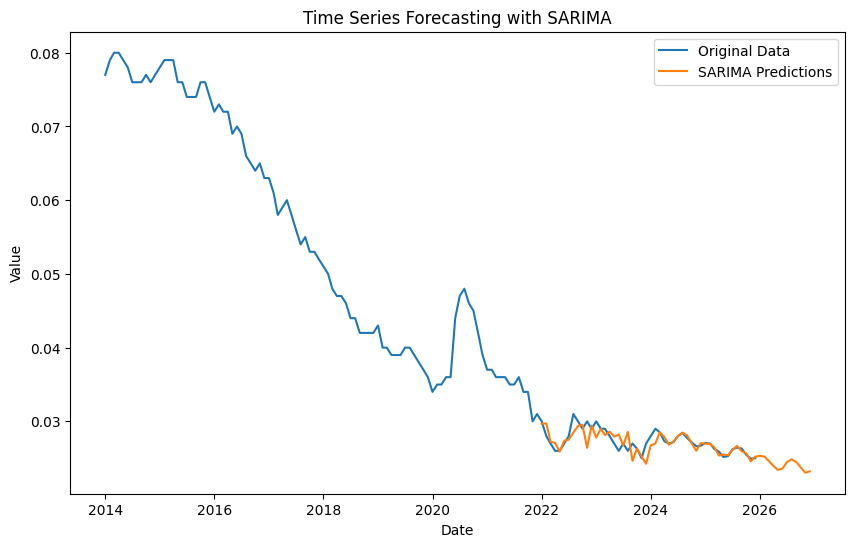

SARIMA - MSE: 1.325868228626446e-06, RMSE: 0.0011514635159771437, MAPE: 2.66%


In [483]:
model_sarima(data_filtered,'Netherlands', '25+', 'Female')

## 25+ Total

In [484]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Total')

In [485]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9943
Strong seasonality detected.


(0.9942576184110036, True)

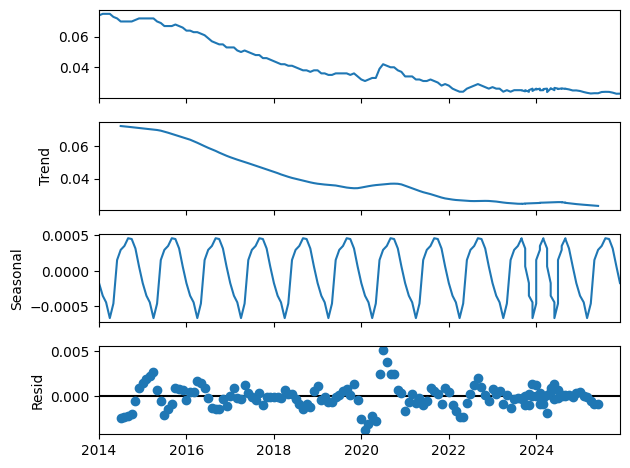

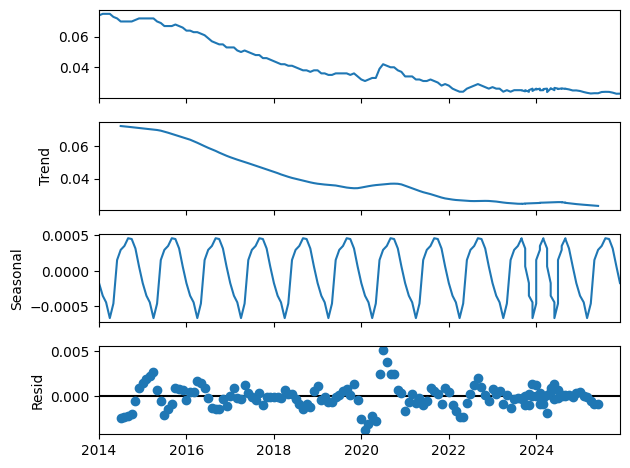

In [486]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [487]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1370.252, Time=1.36 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1327.756, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1355.669, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1372.156, Time=0.63 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1325.779, Time=0.34 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1363.045, Time=0.42 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1361.728, Time=0.26 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1367.730, Time=2.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1373.852, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1364.768, Time=0.32 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1363.506, Time=0.20 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1369.339, Time=1.28 sec
 ARIMA(1,1,0)(0,1

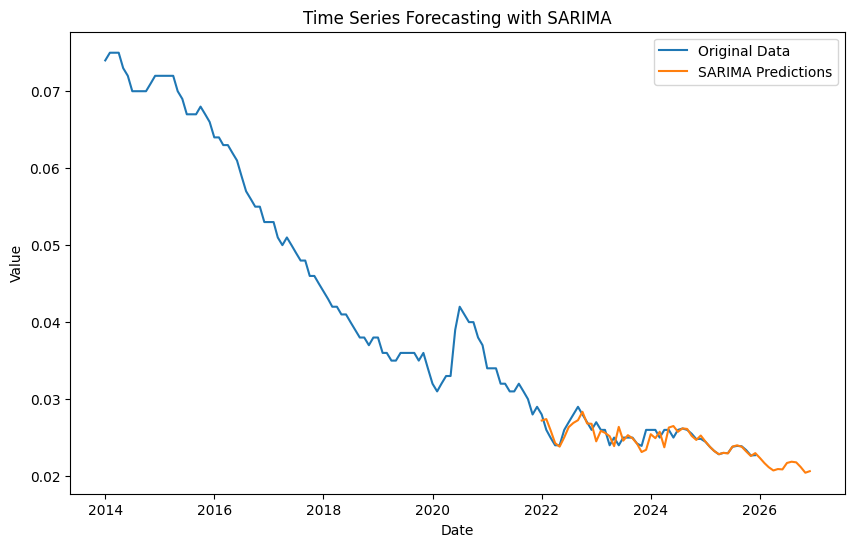

SARIMA - MSE: 8.799555494690699e-07, RMSE: 0.0009380594594529016, MAPE: 2.40%


In [488]:
model_sarima(data_filtered,'Netherlands', '25+', 'Total')


# Chechia

## 15-24 Male

In [489]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Male')

In [490]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9400
Strong seasonality detected.


(0.9400449848876012, True)

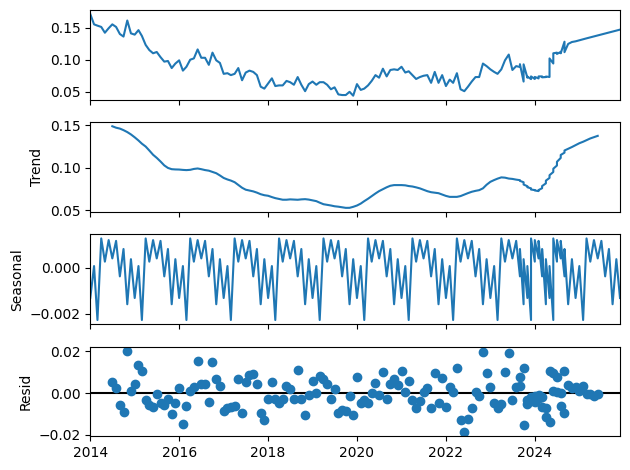

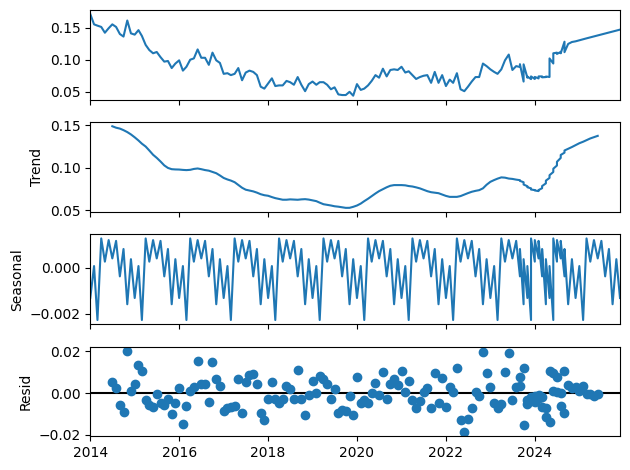

In [491]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [492]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-736.317, Time=0.14 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-782.889, Time=0.56 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-811.421, Time=0.68 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-742.149, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-813.821, Time=1.18 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-782.446, Time=0.47 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-811.398, Time=2.19 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-810.408, Time=1.78 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.36 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-795.743, Time=0.73 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-809.510, Time=3.81 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-802.958, Time=1.82 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-812.084, Time=1.69 sec
 ARIMA(0,1,2)(1,1,1)[12]     

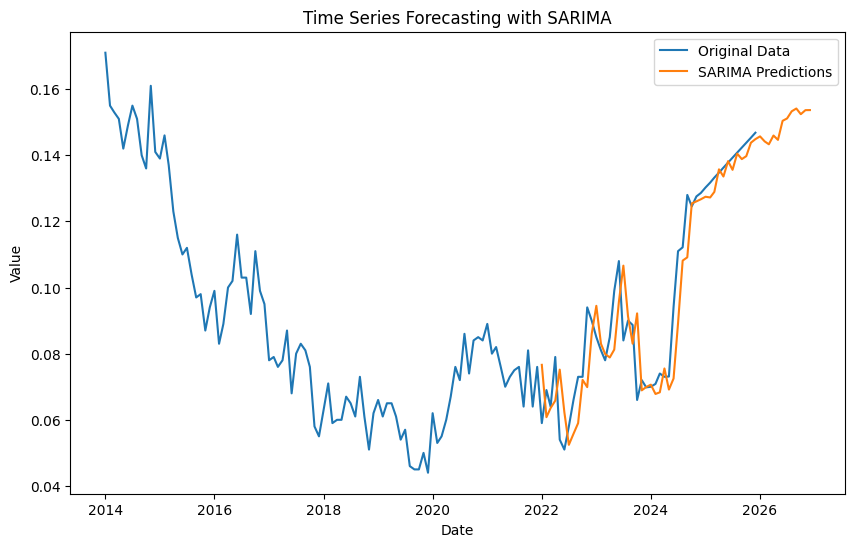

SARIMA - MSE: 0.00011224077156614058, RMSE: 0.01059437452453615, MAPE: 9.08%


In [493]:
model_sarima(data_filtered,'Czechia', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-785.745, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-856.019, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-787.736, Time=0.07 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-876.733, Time=0.07 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-892.469, Time=0.17 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-904.803, Time=0.25 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-915.432, Time=0.31 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-912.000, Time=0.22 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-917.634, Time=0.57 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-912.744, Time=0.31 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-913.568, Time=0.38 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-911.683, Time=0.32 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-

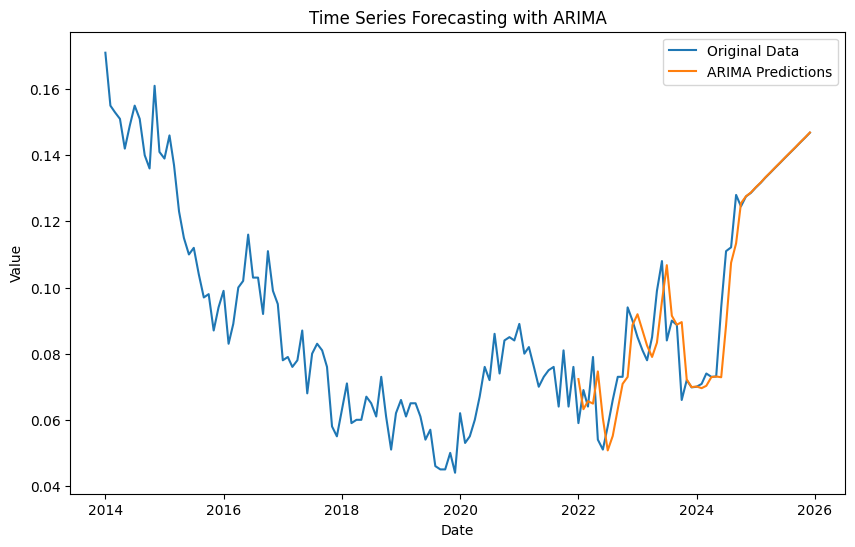

ARIMA - MSE: 0.00012379450584684796, RMSE: 0.01112629793987416, MAPE: 10.90%


In [494]:
model_arima(data_filtered,'Czechia', '15-24', 'Male')

## 15-24 Female

In [495]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Female')

In [496]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9022
Strong seasonality detected.


(0.902161210333303, True)

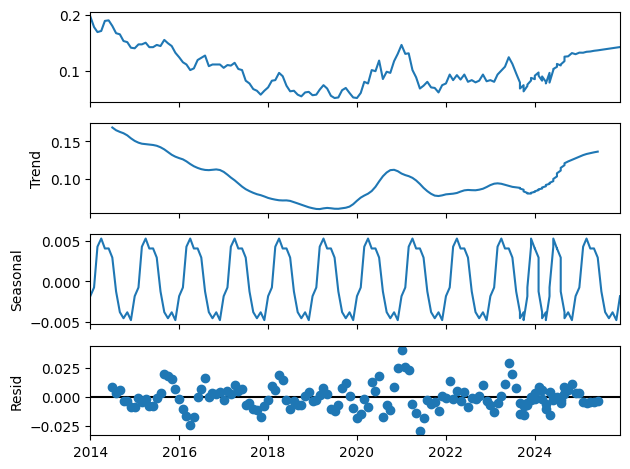

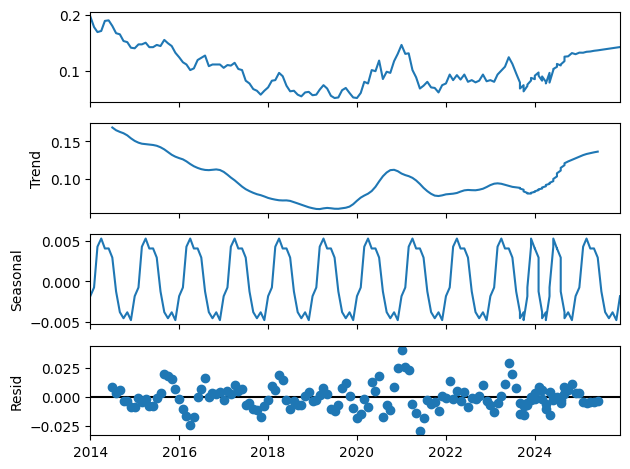

In [497]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [498]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-722.856, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-754.803, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-721.094, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-766.650, Time=0.74 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-790.032, Time=1.95 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=2.64 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-791.495, Time=1.40 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-768.460, Time=0.71 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.97 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-756.833, T

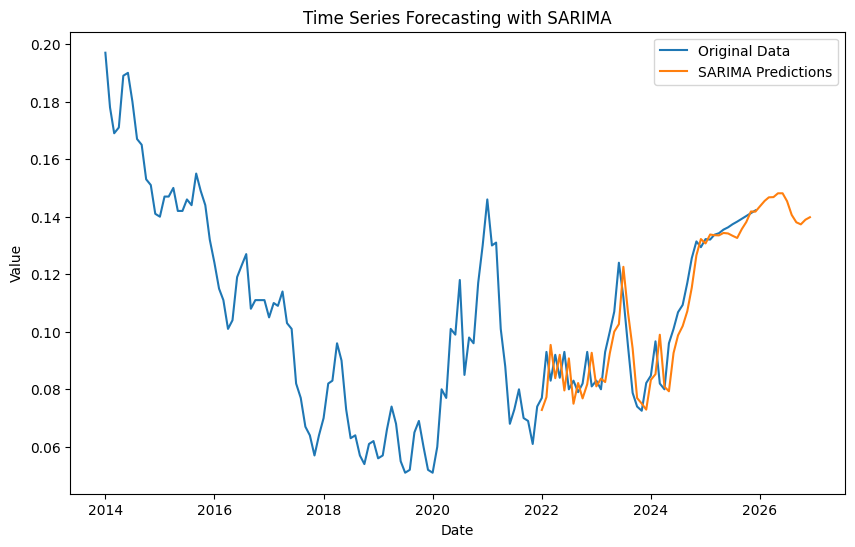

SARIMA - MSE: 7.674381658491081e-05, RMSE: 0.008760354820719924, MAPE: 7.39%


In [499]:
model_sarima(data_filtered,'Czechia', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-876.805, Time=0.89 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-813.768, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-874.296, Time=0.09 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-815.753, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-895.747, Time=0.42 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-873.464, Time=0.22 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-923.112, Time=0.45 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-890.436, Time=0.20 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-907.622, Time=0.24 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-910.899, Time=0.48 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-925.312, Time=0.46 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-902.666, Time=0.41 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-892.344, Time=0.10 sec
 ARIMA(3,2,2)(0,0,0)[0]             : 

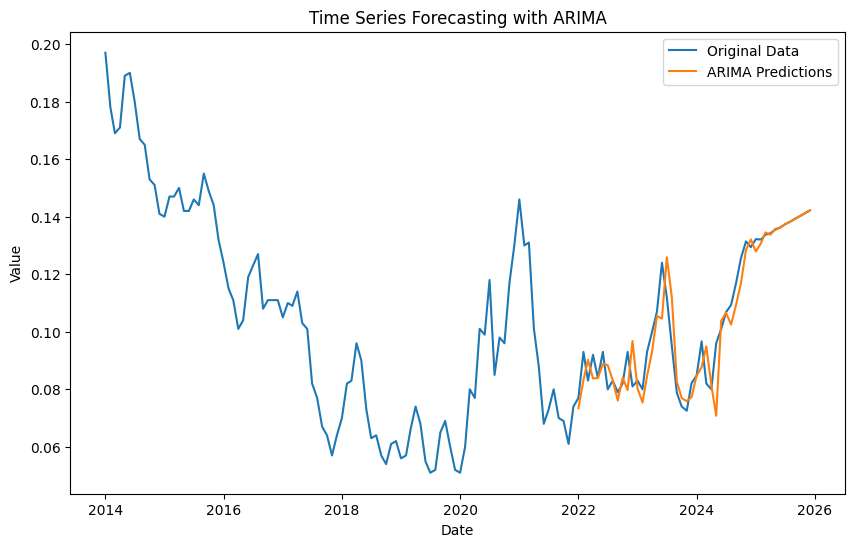

ARIMA - MSE: 9.051546937572113e-05, RMSE: 0.009513961812816002, MAPE: 7.86%


In [500]:
model_arima(data_filtered,'Czechia', '15-24', 'Female')

## 15-24 Total

In [501]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Total')

In [502]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9554
Strong seasonality detected.


(0.9554207739014478, True)

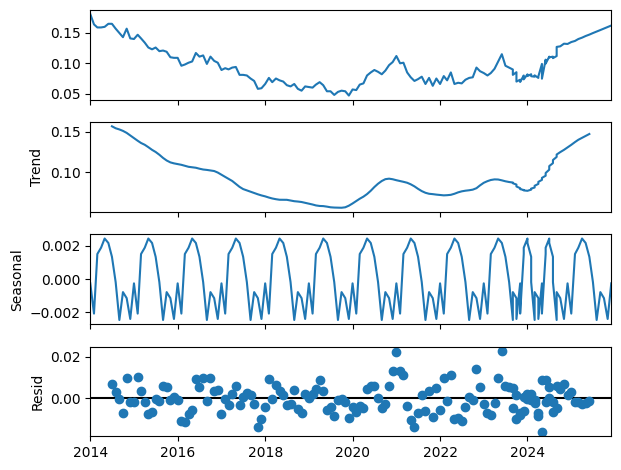

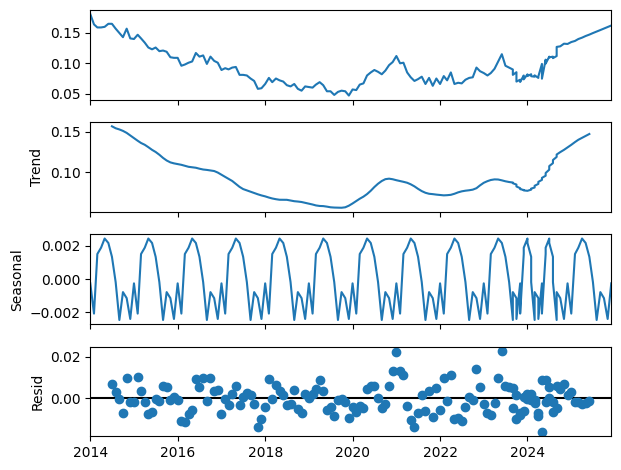

In [503]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [504]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-790.517, Time=0.14 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-833.139, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-862.594, Time=1.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-791.649, Time=0.29 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-863.968, Time=2.57 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-832.083, Time=0.54 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-862.898, Time=2.25 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=3.91 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-864.268, Time=1.33 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=2.68 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-862.803, Time=3.01 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-866.237, Time=2.61 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-862.942, Time=1.00 sec
 ARIMA(0,1,2)(1,1,2)[12]          

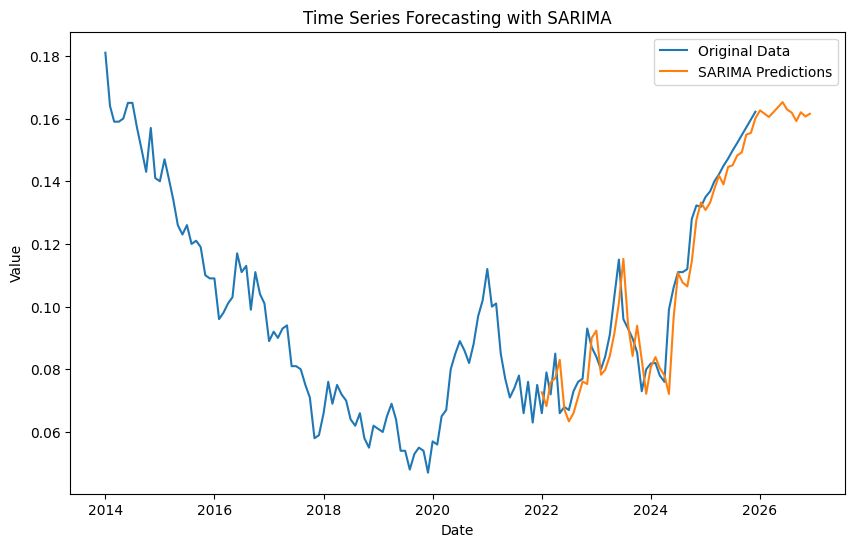

SARIMA - MSE: 6.860420519969158e-05, RMSE: 0.008282765552621394, MAPE: 6.60%


In [505]:
model_sarima(data_filtered,'Czechia', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-959.325, Time=0.36 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-865.724, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-938.040, Time=0.18 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-964.124, Time=0.30 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-867.703, Time=0.07 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-960.219, Time=0.29 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-977.184, Time=0.49 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-971.752, Time=0.18 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-979.508, Time=0.43 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-969.716, Time=0.70 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-977.460, Time=0.69 sec
 ARIMA(1,2,3)(0,0,0)[0]             : AIC=-979.654, Time=0.14 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-977.293, Time=0.28 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-978.753, Time=0.47 sec
 ARIMA(2,2,3)(0,0,0)[0]          

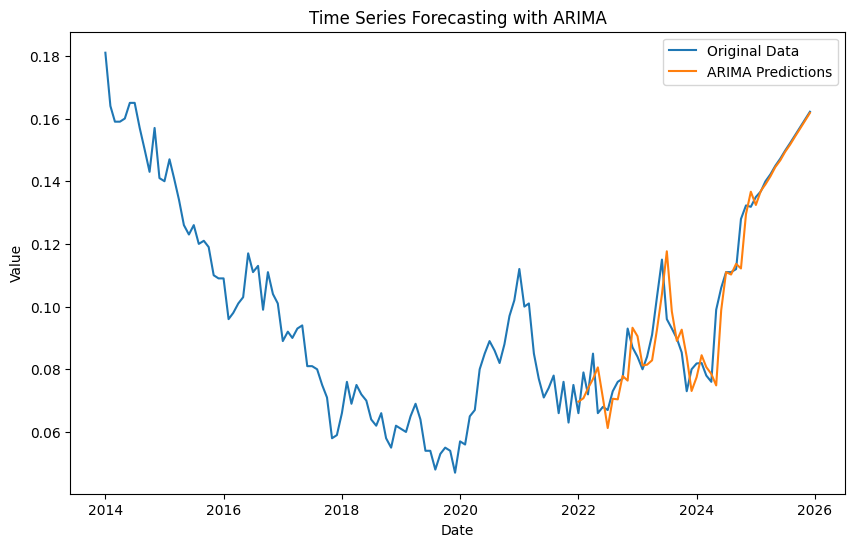

ARIMA - MSE: 8.325195297797729e-05, RMSE: 0.009124250817353569, MAPE: 8.29%


In [506]:
model_arima(data_filtered,'Czechia', '15-24', 'Total')

## 25+ Male

In [507]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Male')

In [508]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9833
Strong seasonality detected.


(0.9832940494941579, True)

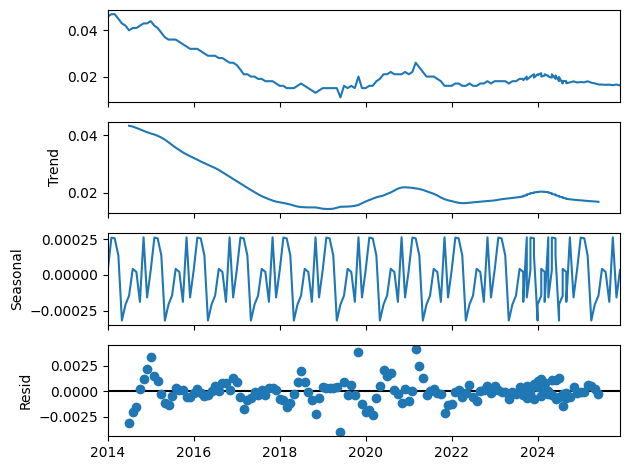

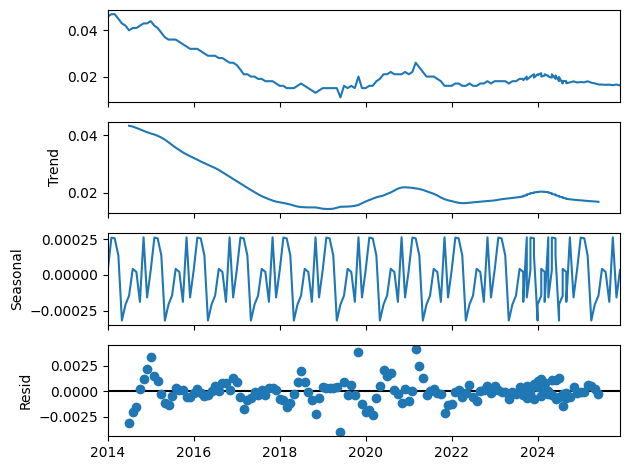

In [509]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [510]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1339.770, Time=1.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1267.426, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1318.948, Time=0.56 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1336.702, Time=0.83 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1274.561, Time=0.16 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1329.462, Time=1.27 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1323.774, Time=2.86 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1321.069, Time=1.40 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1323.245, Time=2.88 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1338.211, Time=0.85 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1334.315, Time=0.93 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1334.592, Time=3.48 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1336.954, Time=0.94 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1338.417, Time=1.42 sec
 ARIM

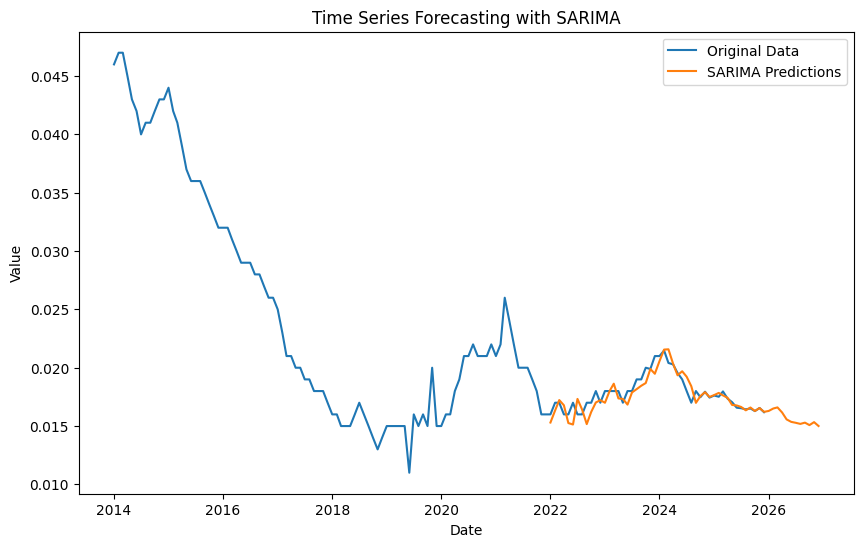

SARIMA - MSE: 5.803357666922954e-07, RMSE: 0.000761797720324953, MAPE: 3.12%


In [511]:
model_sarima(data_filtered,'Czechia', '25+', 'Male')

## 25+ Female

In [512]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Female')

In [513]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9627
Strong seasonality detected.


(0.9626773560124554, True)

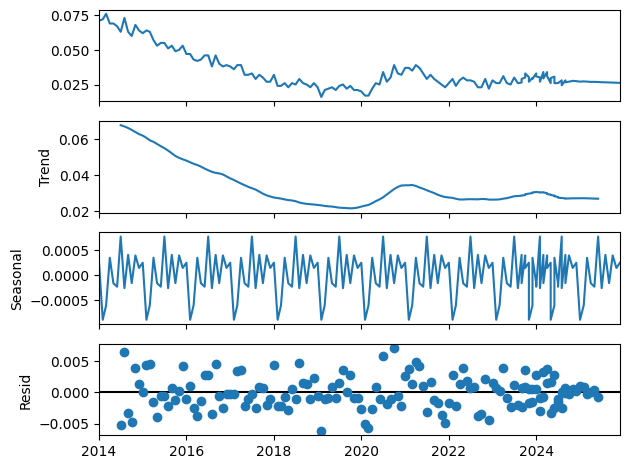

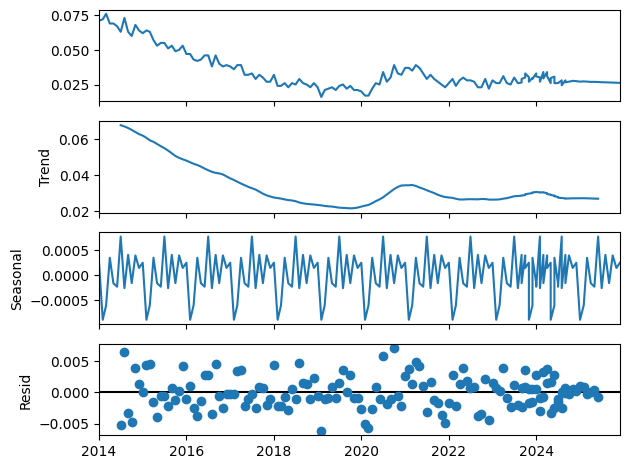

In [514]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [515]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1081.026, Time=1.50 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1030.651, Time=0.14 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1060.151, Time=1.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1082.571, Time=4.28 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1055.262, Time=0.19 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1075.555, Time=1.58 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1082.053, Time=2.36 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1066.432, Time=0.53 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1086.811, Time=3.71 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-1074.795, Time=2.63 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-1078.723, Time=0.48 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1054.677, Time=1.31 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1084.776, Time=4.16 sec
 ARIMA(0,1,2)(1,1,2)[12]             : AIC=-1086.187, Time=3.14 sec
 ARIM

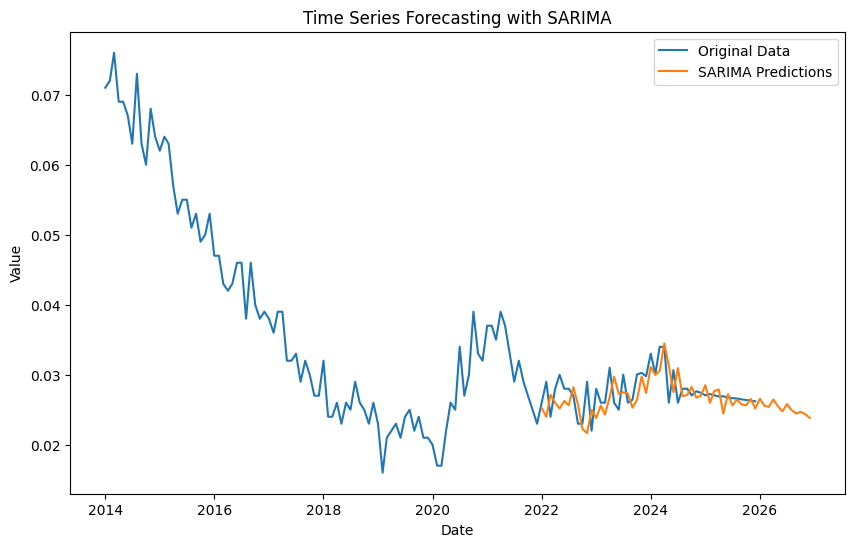

SARIMA - MSE: 6.819605104972087e-06, RMSE: 0.0026114373637849495, MAPE: 7.40%


In [516]:
model_sarima(data_filtered,'Czechia', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1193.726, Time=2.06 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1035.666, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1094.642, Time=0.14 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1037.666, Time=0.06 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1204.060, Time=0.56 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1181.978, Time=0.20 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1206.563, Time=0.16 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1194.914, Time=0.44 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1208.683, Time=0.52 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1219.498, Time=0.58 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1167.065, Time=0.37 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1214.895, Time=0.75 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-1202.372, Time=1.57 sec
 ARIMA(3,2,3)(0,0,0)[0] i

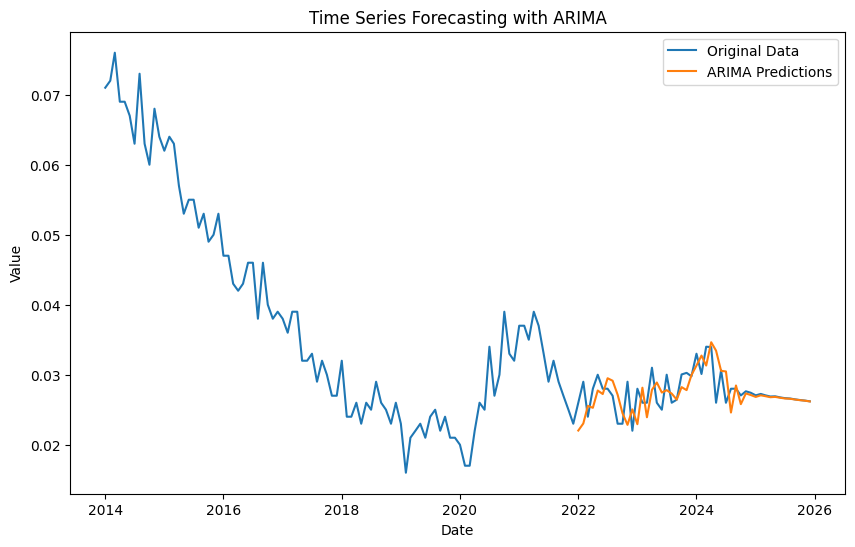

ARIMA - MSE: 9.605344629680893e-06, RMSE: 0.003099249042861979, MAPE: 9.35%


In [517]:
model_arima(data_filtered,'Czechia', '25+', 'Female')

## 25+ Total

In [518]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Total')

In [519]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9799
Strong seasonality detected.


(0.979940854184773, True)

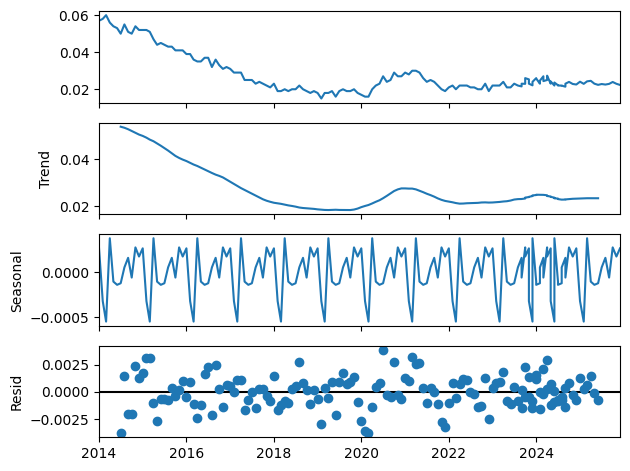

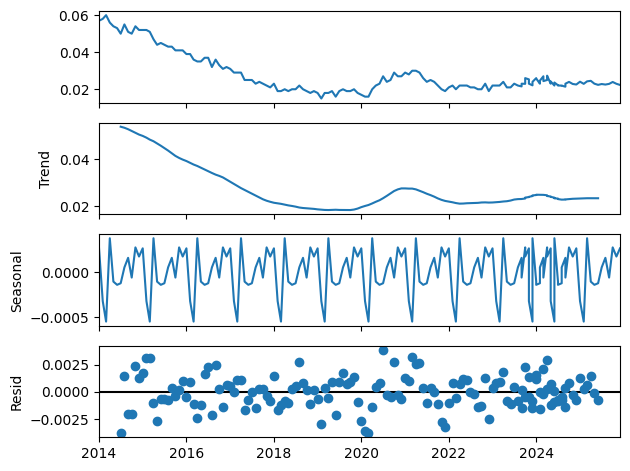

In [520]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [521]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1238.077, Time=1.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1202.553, Time=0.16 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1223.762, Time=0.98 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1239.536, Time=0.98 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1211.804, Time=0.27 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1236.712, Time=1.29 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=2.50 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1224.006, Time=1.33 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=3.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1228.154, Time=0.52 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1238.583, Time=1.92 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1239.213, Time=3.01 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1236.202, Time=5.44 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-1239.774, Time=6.81 sec
 ARIMA(0,1,1)(0,1

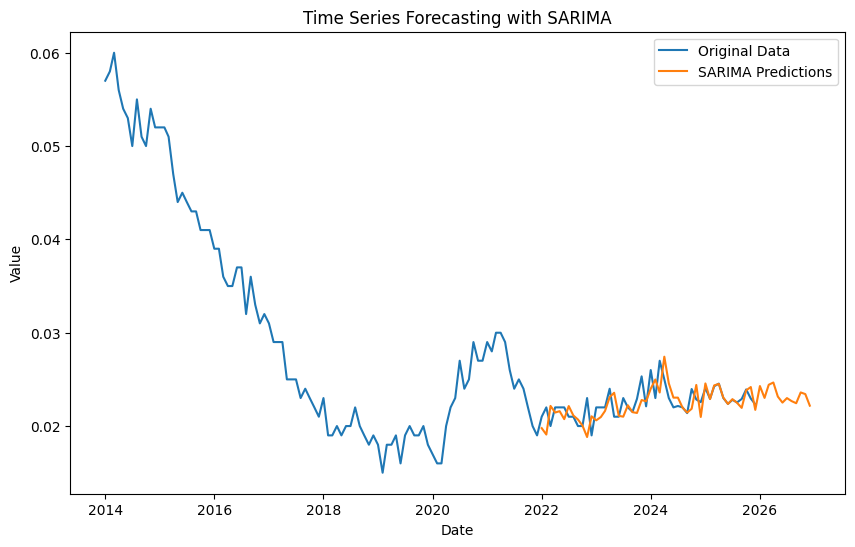

SARIMA - MSE: 2.2092652782514805e-06, RMSE: 0.0014863597405243053, MAPE: 4.80%


In [522]:
model_sarima(data_filtered,'Czechia', '25+', 'Total')


# Canada

## 15-24 Male

In [523]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Male')

In [524]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7134
Strong seasonality detected.


(0.7134105654064251, True)

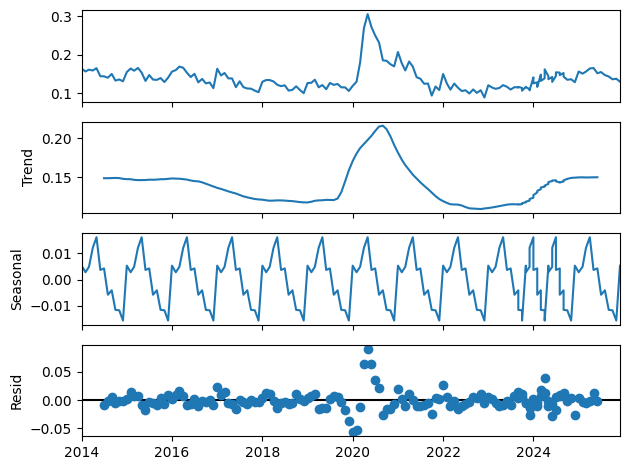

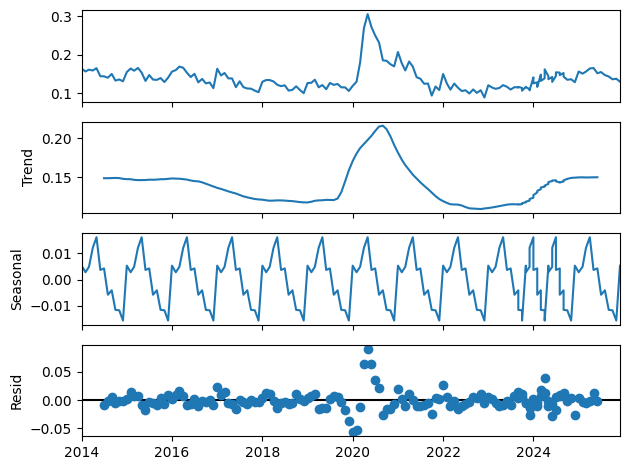

In [525]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [526]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-649.235, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-677.415, Time=1.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.83 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-650.523, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-686.685, Time=0.42 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-705.108, Time=1.52 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=2.06 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.56 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=2.25 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=inf, Time=2.11 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, Time=1.62 sec
 ARIMA(2,1,1)(2,1,1)[12]             : AIC=inf, Time=1.76 sec
 A

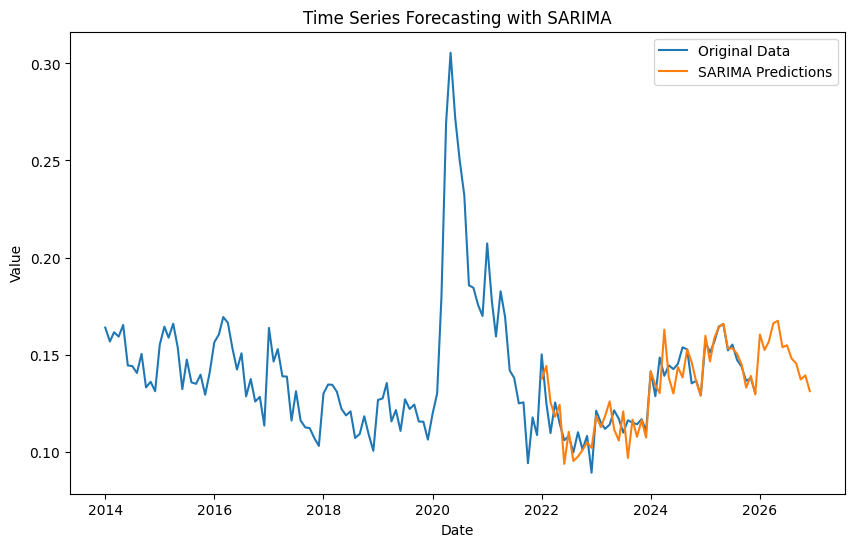

SARIMA - MSE: 8.225635873765766e-05, RMSE: 0.009069529135388322, MAPE: 5.35%


In [527]:
model_sarima(data_filtered,'Canada', '15-24', 'Male')

## 15-24 Female

In [528]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Female')

In [529]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6664
Weak or no seasonality detected.


(0.6664326243383574, False)

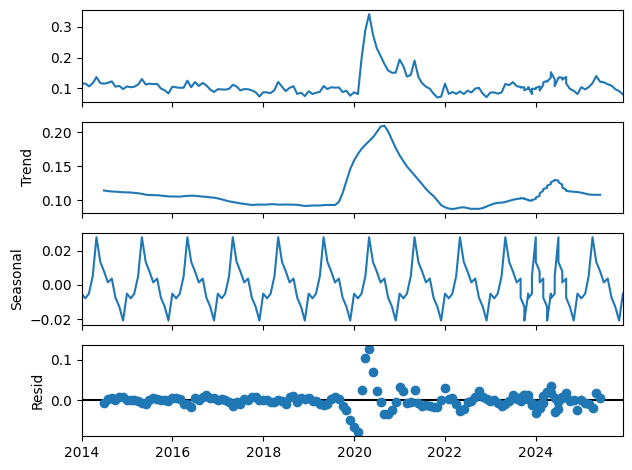

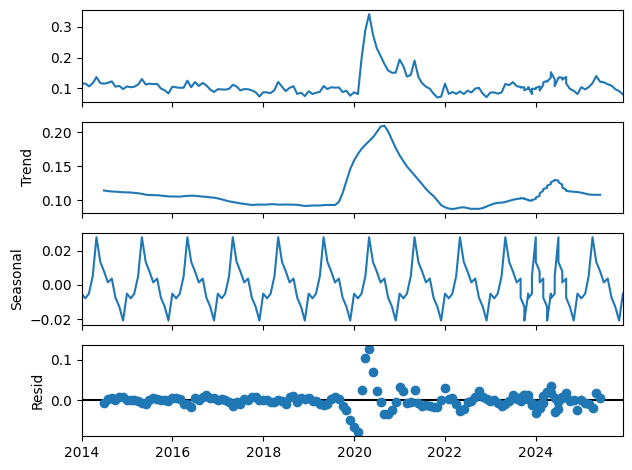

In [530]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [531]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-594.445, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-638.299, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-611.159, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-647.729, Time=1.55 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.90 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-632.249, Time=0.76 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-654.028, Time=0.60 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-645.515, Time=0.36 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=4.05 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-654.375, Time=1.04 sec
 ARIMA(3,1,0)(1,1,0)[12]             : AIC=-645.4

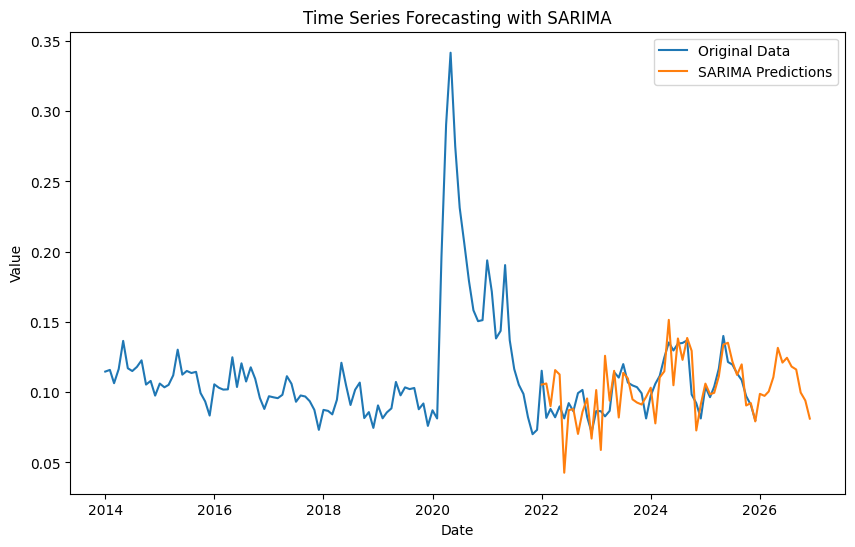

SARIMA - MSE: 0.0002766611536049668, RMSE: 0.016633134208710237, MAPE: 12.94%


In [532]:
model_sarima(data_filtered,'Canada', '15-24', 'Female')

## 15-24 Total

In [533]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Total')

In [534]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6989
Weak or no seasonality detected.


(0.6988520565737435, False)

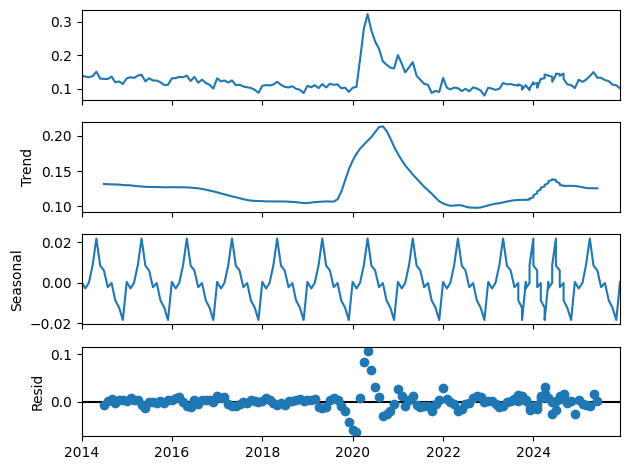

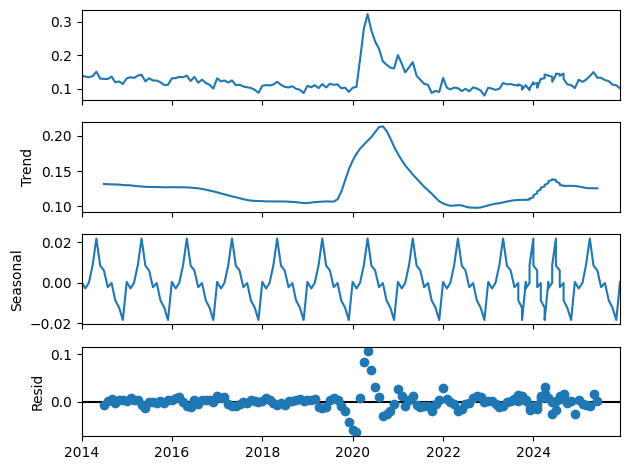

In [535]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [536]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-646.382, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-697.947, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-738.512, Time=0.35 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-673.990, Time=0.25 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-736.915, Time=1.30 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.43 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-703.647, Time=0.25 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-737.889, Time=1.23 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-734.761, Time=1.58 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-736.167, Time=0.26 sec

Best model:  ARIMA(0,1,1)(0,1,1)[12]       

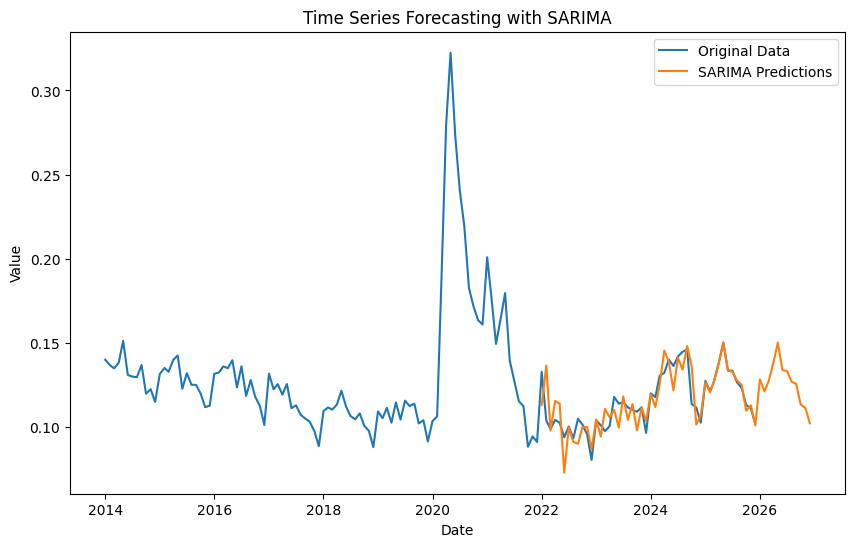

SARIMA - MSE: 9.240017583425851e-05, RMSE: 0.009612501018686995, MAPE: 5.88%


In [537]:
model_sarima(data_filtered,'Canada', '15-24', 'Total')

## 25+ Male

In [538]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Male')

In [539]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7281
Strong seasonality detected.


(0.7281022956048484, True)

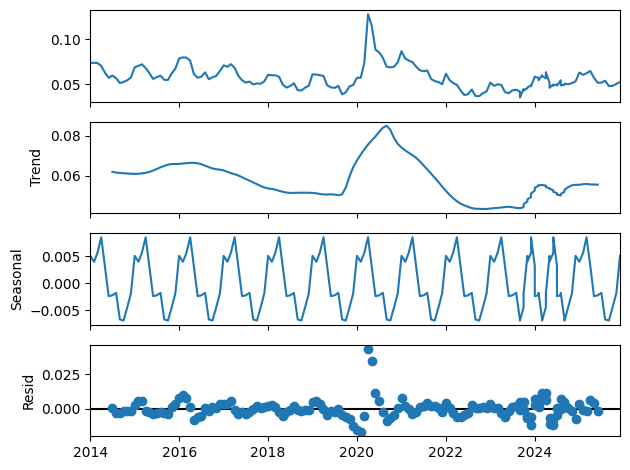

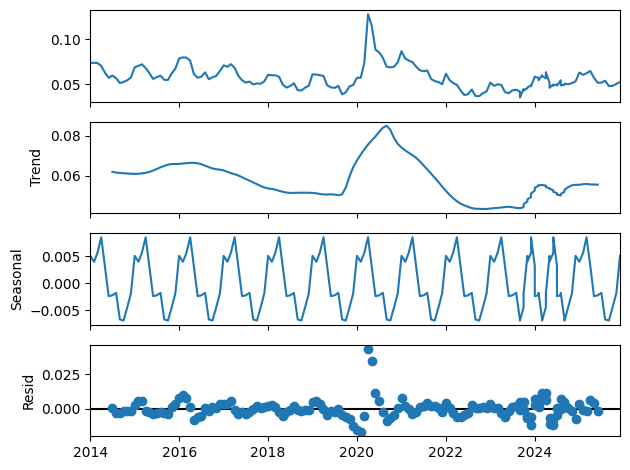

In [540]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [541]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-943.827, Time=1.70 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-878.856, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-912.926, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-946.959, Time=1.30 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-885.843, Time=0.12 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-934.657, Time=0.46 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-917.910, Time=0.58 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.38 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-937.614, Time=0.11 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-954.139, Time=1.76 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-891.813, Time=0.10 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-938.562, Time=0.51 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=2.76 sec
 ARIMA(0,1,2)(1,1,0)[12]          

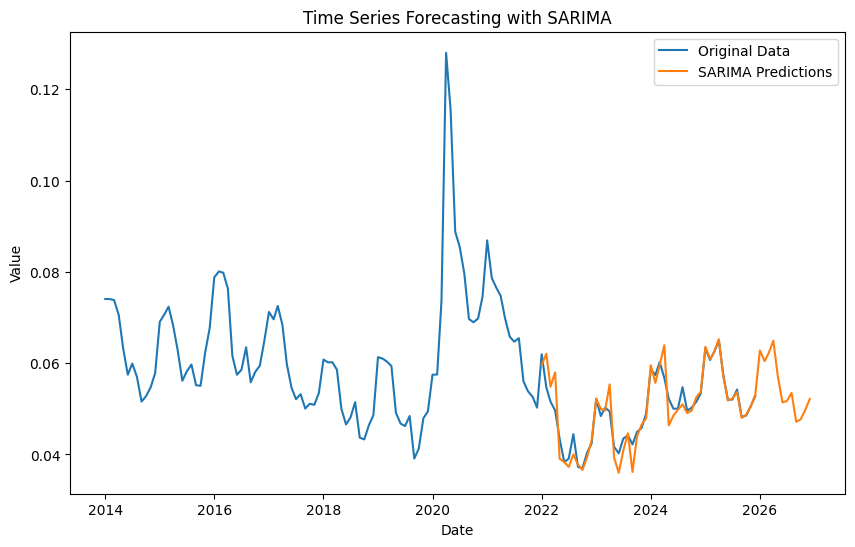

SARIMA - MSE: 8.34163929088076e-06, RMSE: 0.002888189621697433, MAPE: 3.78%


In [542]:
model_sarima(data_filtered,'Canada', '25+', 'Male')

## 25+ Female

In [543]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Female')

In [544]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7436
Strong seasonality detected.


(0.7436419514287834, True)

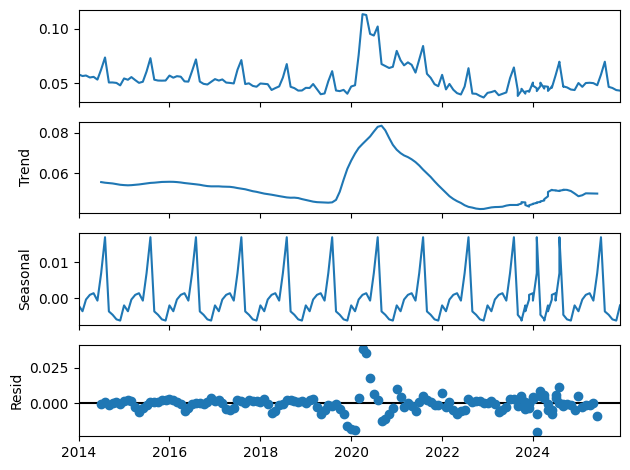

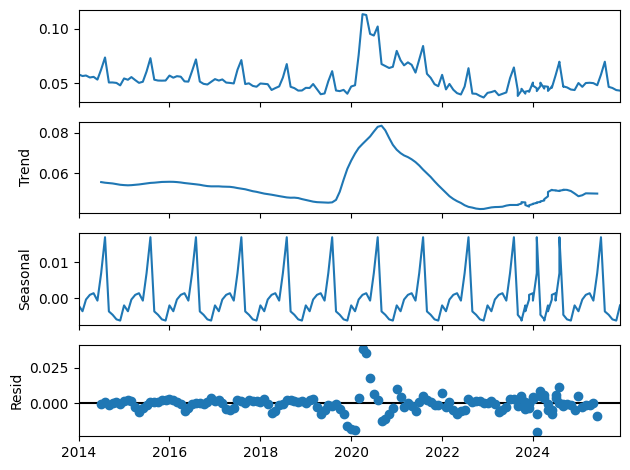

In [545]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [546]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-985.275, Time=0.92 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-910.953, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-951.576, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-988.133, Time=0.50 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-934.266, Time=0.20 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-977.630, Time=0.67 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-959.582, Time=0.37 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-989.577, Time=0.85 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-984.570, Time=2.65 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-971.770, Time=2.03 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-969.480, Time=0.73 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-986.644, Time=3.34 sec
 ARIMA(0,1,2)(1,1,2)[12]             : AIC=-988.145, Time=1.96 sec
 ARIMA(1,1,0)(1,1,2)[12]

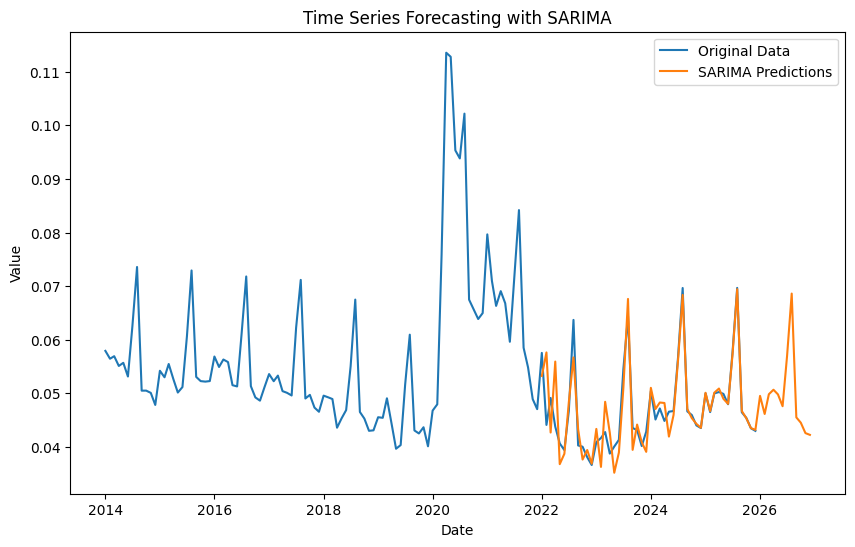

SARIMA - MSE: 1.4263966526520792e-05, RMSE: 0.003776766676208737, MAPE: 5.33%


In [547]:
model_sarima(data_filtered,'Canada', '25+', 'Female')

## 25+ Total

In [548]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Total')

In [549]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7234
Strong seasonality detected.


(0.7234236999516097, True)

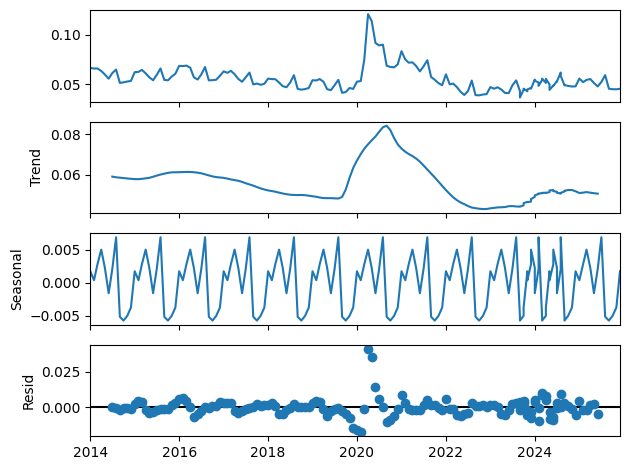

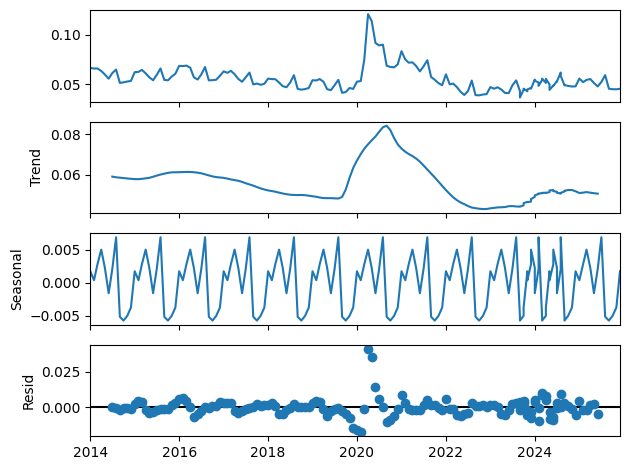

In [550]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [551]:
data_filtered = data_filtered[~data_filtered.index.duplicated(keep='first')]
print(data_filtered.index.min(), data_filtered.index.max())
print(data_filtered.index.freq)
data_filtered = data_filtered.asfreq('MS')
print(data_filtered.index.freq)

2014-01-01 00:00:00 2025-12-01 00:00:00
None
<MonthBegin>


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-982.901, Time=1.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-906.952, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-945.713, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-984.482, Time=0.62 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-933.892, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-984.560, Time=0.94 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-956.316, Time=0.20 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-971.237, Time=1.77 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-965.867, Time=0.37 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-984.335, Time=3.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-963.953, Time=1.13 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-972.635, Time=0.73 sec
 ARIMA(0,1,2)(1,1,1)[12]     

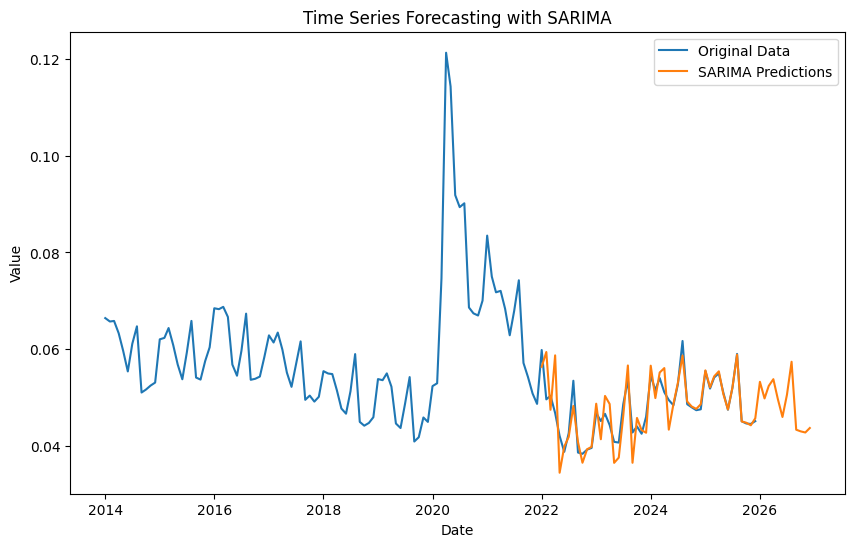

SARIMA - MSE: 1.211307268478168e-05, RMSE: 0.00348038398524957, MAPE: 4.85%


In [552]:
model_sarima(data_filtered,'Canada', '25+', 'Total')

## Final dataframe with results

In [557]:
forecast_results_df

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
0,SARIMA,Italy,15-24,Male,2022-01-01,0.248273,0.000008,0.002824,0.004566
1,SARIMA,Italy,15-24,Male,2022-02-01,0.233000,0.000008,0.002824,0.004566
2,SARIMA,Italy,15-24,Male,2022-03-01,0.233000,0.000008,0.002824,0.004566
3,SARIMA,Italy,15-24,Male,2022-04-01,0.227385,0.000008,0.002824,0.004566
4,SARIMA,Italy,15-24,Male,2022-05-01,0.222000,0.000008,0.002824,0.004566
...,...,...,...,...,...,...,...,...,...
7699,SARIMA,Canada,25+,Total,2026-08-01,0.057433,0.000012,0.003480,0.048531
7700,SARIMA,Canada,25+,Total,2026-09-01,0.043404,0.000012,0.003480,0.048531
7701,SARIMA,Canada,25+,Total,2026-10-01,0.043061,0.000012,0.003480,0.048531
7702,SARIMA,Canada,25+,Total,2026-11-01,0.042830,0.000012,0.003480,0.048531


In [558]:
data = forecast_results_df.copy()
filtered_data = data[pd.to_datetime(data['Date']) >= pd.to_datetime("2026-01-01")]

In [559]:
filtered_data

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
48,SARIMA,Italy,15-24,Male,2026-01-01,0.160921,0.000008,0.002824,0.004566
49,SARIMA,Italy,15-24,Male,2026-02-01,0.160921,0.000008,0.002824,0.004566
50,SARIMA,Italy,15-24,Male,2026-03-01,0.160921,0.000008,0.002824,0.004566
51,SARIMA,Italy,15-24,Male,2026-04-01,0.151093,0.000008,0.002824,0.004566
52,SARIMA,Italy,15-24,Male,2026-05-01,0.151093,0.000008,0.002824,0.004566
...,...,...,...,...,...,...,...,...,...
7699,SARIMA,Canada,25+,Total,2026-08-01,0.057433,0.000012,0.003480,0.048531
7700,SARIMA,Canada,25+,Total,2026-09-01,0.043404,0.000012,0.003480,0.048531
7701,SARIMA,Canada,25+,Total,2026-10-01,0.043061,0.000012,0.003480,0.048531
7702,SARIMA,Canada,25+,Total,2026-11-01,0.042830,0.000012,0.003480,0.048531


In [561]:
forecast_results_df = filtered_data

filtered_df = forecast_results_df.loc[
    forecast_results_df.groupby(['Country', 'Age', 'Sex', 'Date'])['RMSE'].idxmin()
].reset_index(drop=True)

filtered_df.to_csv('filtered_results_2026.csv', index=False)
filtered_df

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
0,SARIMA,Canada,15-24,Female,2026-01-01,0.098804,0.000277,0.016633,0.129385
1,SARIMA,Canada,15-24,Female,2026-02-01,0.097345,0.000277,0.016633,0.129385
2,SARIMA,Canada,15-24,Female,2026-03-01,0.100479,0.000277,0.016633,0.129385
3,SARIMA,Canada,15-24,Female,2026-04-01,0.110653,0.000277,0.016633,0.129385
4,SARIMA,Canada,15-24,Female,2026-05-01,0.131543,0.000277,0.016633,0.129385
...,...,...,...,...,...,...,...,...,...
1207,SARIMA,United States of America,25+,Total,2026-08-01,0.032032,0.000012,0.003405,0.079921
1208,SARIMA,United States of America,25+,Total,2026-09-01,0.028182,0.000012,0.003405,0.079921
1209,SARIMA,United States of America,25+,Total,2026-10-01,0.026916,0.000012,0.003405,0.079921
1210,SARIMA,United States of America,25+,Total,2026-11-01,0.026328,0.000012,0.003405,0.079921


In [562]:
filtered_df = filtered_df.drop(columns=['Model'])
filtered_df.to_csv('filtered_data_2026_without_model_column.csv', index=False)

In [563]:
columns_to_keep = ['Age', 'Sex', 'Country', 'Unemployment Rate (%)', 'Year', 'Month']
def process_forecast_data(forecast_df, initial_df, output_file):

    mapped_df = forecast_df.rename(columns={'Forecast': 'Unemployment Rate (%)'})

    mapped_df['Year'] = pd.to_datetime(mapped_df['Date']).dt.year
    mapped_df['Month'] = pd.to_datetime(mapped_df['Date']).dt.month

    cleaned_df = mapped_df[columns_to_keep]

    combined_df = pd.concat([initial_df, cleaned_df], ignore_index=True)
    combined_df.to_csv(output_file, index=False)

    return combined_df

,Country,Age,Sex,Date,Unemployment Rate (%),MSE,RMSE,MAPE
0,Canada,15-24,Female,2026-01-01,0.098804,0.000277,0.016633,0.129385
1,Canada,15-24,Female,2026-02-01,0.097345,0.000277,0.016633,0.129385
2,Canada,15-24,Female,2026-03-01,0.100479,0.000277,0.016633,0.129385
3,Canada,15-24,Female,2026-04-01,0.110653,0.000277,0.016633,0.129385
4,Canada,15-24,Female,2026-05-01,0.131543,0.000277,0.016633,0.129385
...,...,...,...,...,...,...,...,...
1207,United States of America,25+,Total,2026-08-01,0.032032,0.000012,0.003405,0.079921
1208,United States of America,25+,Total,2026-09-01,0.028182,0.000012,0.003405,0.079921
1209,United States of America,25+,Total,2026-10-01,0.026916,0.000012,0.003405,0.079921
1210,United States of America,25+,Total,2026-11-01,0.026328,0.000012,0.003405,0.079921


In [564]:
filtered_initial_data = pd.read_csv('datasets/filtered_initial_unemployment_data.csv')

,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,0.096000,2014,4
1,25+,Total,Norway,0.028000,2014,10
2,25+,Male,Iceland,0.052000,2021,1
3,25+,Male,Iceland,0.049000,2021,2
4,25+,Male,Iceland,0.048000,2021,3
...,...,...,...,...,...,...
34862,25+,Total,United States of America,0.032032,2026,8
34863,25+,Total,United States of America,0.028182,2026,9
34864,25+,Total,United States of America,0.026916,2026,10
34865,25+,Total,United States of America,0.026328,2026,11


In [ ]:
combined_df_with_2026 = process_forecast_data(filtered_df, filtered_initial_data, 'datasets/df_with_2026_.csv')